In [1]:
#import all the necessary packages.

from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings
from bs4 import BeautifulSoup
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
import math
import time
import re
import os
import seaborn as sns
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity  
from sklearn.metrics import pairwise_distances
from matplotlib import gridspec
from scipy.sparse import hstack
import plotly
import plotly.figure_factory as ff
from plotly.graph_objs import Scatter, Layout
import os
plotly.offline.init_notebook_mode(connected=True)
warnings.filterwarnings("ignore")

In [2]:
amazon_data = pd.read_pickle('Submit/16k_apperal_data_submit')

In [7]:
# we use the list of stop words that are downloaded from nltk lib.
stop_words = set(stopwords.words('english'))
print ('list of stop words:', stop_words)

def nlp_preprocessing(total_text, index, column):
    if type(total_text) is not int:
        string = ""
        for words in total_text.split():
            # remove the special chars in review like '"#$@!%^&*()_+-~?>< etc.
            word = ("".join(e for e in words if e.isalnum()))
            # Conver all letters to lower-case
            word = word.lower()
            # stop-word removal
            if not word in stop_words:
                string += word + " "
        amazon_data[column][index] = string

list of stop words: {'those', 'no', "should've", 'same', "needn't", 'who', 'yourselves', 'out', 'the', 'but', 'they', 'after', 'am', 'she', 'an', 'm', "you're", 'other', 'her', 've', 'won', "hasn't", 's', 'o', 'ourselves', 'their', "couldn't", 'are', "aren't", 'will', 'that', 'about', 'there', 'itself', 'its', 'them', 'during', 'was', 'where', 'my', "you've", 'do', 'having', 'does', 'you', 'again', 'i', 'what', 'into', 'he', 'here', 'so', 'don', 'yourself', 'haven', "wasn't", 'should', "won't", "hadn't", 'this', 'to', 'ours', 'y', 'these', 'has', 'up', "doesn't", 'each', 'it', 'with', 'aren', 'on', 'can', 'before', 'while', 'than', 'ma', 'through', 'just', 'below', 'mustn', 'very', 'hadn', 'me', 're', "shouldn't", "you'd", 'couldn', 'all', 'shan', "you'll", 'd', 'both', 'nor', "didn't", 'some', 'had', 'then', "she's", 'hers', 'herself', 'against', 'now', 'doesn', 'his', 'ain', 'myself', 'is', 'down', "that'll", 't', 'him', 'isn', 'we', 'such', 'too', 'a', 'few', 'our', 'most', 'whom', 

In [8]:
start_time = time.clock()
# we take each title and we text-preprocess it.
for index, row in amazon_data.iterrows():
    nlp_preprocessing(row['title'], index, 'title')
# we print the time it took to preprocess whole titles 
print(time.clock() - start_time, "seconds")

5.726182600000001 seconds


In [10]:
idf_title_vectorizer = CountVectorizer()
idf_title_features = idf_title_vectorizer.fit_transform(amazon_data['title'])

def n_containing(word):
    # return the number of documents which had the given word
    return sum(1 for blob in amazon_data['title'] if word in blob.split())

def idf(word):
    # idf = log(#number of docs / #number of docs which had the given word)
    return math.log(amazon_data.shape[0] / (n_containing(word)))

In [11]:
start_time = time.clock()

# we need to convert the values into float
idf_title_features  = idf_title_features.astype(np.float)

for i in idf_title_vectorizer.vocabulary_.keys():
    # for every word in whole corpus we will find its idf value
    idf_val = idf(i)
    
    # to calculate idf_title_features we need to replace the count values with the idf values of the word
    # idf_title_features[:, idf_title_vectorizer.vocabulary_[i]].nonzero()[0] will return all documents in which the word i present
    for j in idf_title_features[:, idf_title_vectorizer.vocabulary_[i]].nonzero()[0]:
        
        # we replace the count values of word i in document j with  idf_value of word i 
        # idf_title_features[doc_id, index_of_word_in_courpus] = idf value of word
        idf_title_features[j,idf_title_vectorizer.vocabulary_[i]] = idf_val
        
print(time.clock() - start_time, "seconds")

219.3139044 seconds


In [12]:
#reading the saved file of word2vec
import pickle
with open('word2vec_model', 'rb') as handle:
    model = pickle.load(handle)

In [13]:
vocab = model.keys()
# this function will add the vectors of each word and returns the avg vector of given sentance
def build_avg_vec(sentence, num_features, doc_id, m_name):
    # sentace: its title of the apparel
    # num_features: the lenght of word2vec vector, its values = 300
    # m_name: model information it will take two values
        # if  m_name == 'avg', we will append the model[i], w2v representation of word i
        # if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)

    featureVec = np.zeros((num_features,), dtype="float32")
    # we will intialize a vector of size 300 with all zeros
    # we add each word2vec(wordi) to this fetureVec
    nwords = 0
    
    for word in sentence.split():
        nwords += 1
        if word in vocab:
            if m_name == 'weighted' and word in  idf_title_vectorizer.vocabulary_:
                featureVec = np.add(featureVec, idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[word]] * model[word])
            elif m_name == 'avg':
                featureVec = np.add(featureVec, model[word])
    if(nwords>0):
        featureVec = np.divide(featureVec, nwords)
    # returns the avg vector of given sentance, its of shape (1, 300)
    return featureVec

In [14]:
doc_id = 0
w2v_title_weight = []
# for every title we build a weighted vector representation
for i in amazon_data['title']:
    w2v_title_weight.append(build_avg_vec(i, 300, doc_id,'weighted'))
    doc_id += 1
# w2v_title = np.array(# number of doc in courpus * 300), each row corresponds to a doc 
w2v_title_weight = np.array(w2v_title_weight)

In [16]:
#load the features and corresponding ASINS info.
bottleneck_features_train = np.load('16k_data_cnn_features.npy')
asins = np.load('16k_data_cnn_feature_asins.npy')
asins = list(asins)

# load the original 16K dataset
data = pd.read_pickle('Submit/16k_apperal_data_submit')
df_asins = list(data['asin'])

In [17]:
# some of the brand values are empty. 
# Need to replace Null with string "NULL"
data['brand'].fillna(value="Not given", inplace=True )

# replace spaces with hypen
brands = [x.replace(" ", "-") for x in data['brand'].values]
types = [x.replace(" ", "-") for x in data['product_type_name'].values]
colors = [x.replace(" ", "-") for x in data['color'].values]

brand_vectorizer = CountVectorizer()
brand_features = brand_vectorizer.fit_transform(brands)

#type_vectorizer = CountVectorizer()
#type_features = type_vectorizer.fit_transform(types)

color_vectorizer = CountVectorizer()
color_features = color_vectorizer.fit_transform(colors)

extra_features = ((brand_features)).tocsr()
extra_features1 = ((color_features)).tocsr()

In [18]:
def heat_map_w2v_brand(sentance1, sentance2, url, doc_id1, doc_id2, df_id1, df_id2, model):
    
    # sentance1 : title1, input apparel
    # sentance2 : title2, recommended apparel
    # url: apparel image url
    # doc_id1: document id of input apparel
    # doc_id2: document id of recommended apparel
    # df_id1: index of document1 in the data frame
    # df_id2: index of document2 in the data frame
    # model: it can have two values, 1. avg 2. weighted
    
    #s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s1_vec = get_word_vec(sentance1, doc_id1, model)
    #s2_vec = np.array(#number_of_words_title2 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s2_vec = get_word_vec(sentance2, doc_id2, model)
    
    # s1_s2_dist = np.array(#number of words in title1 * #number of words in title2)
    # s1_s2_dist[i,j] = euclidean distance between words i, j
    s1_s2_dist = get_distance(s1_vec, s2_vec)
   
    data_matrix = [['Asin','Brand', 'Color'],
               [data['asin'].loc[df_id1],brands[doc_id1], colors[doc_id1]], # input apparel's features
               [data['asin'].loc[df_id2],brands[doc_id2], colors[doc_id2]]] # recommonded apparel's features
    
    colorscale = [[0, '#1d004d'],[.5, '#f2e5ff'],[1, '#f2e5d1']] # to color the headings of each column 
    
    # we create a table with the data_matrix
    table = ff.create_table(data_matrix, index=True, colorscale=colorscale)
    # plot it with plotly
    plotly.offline.iplot(table, filename='simple_table')
    
    # devide whole figure space into 25 * 1:10 grids
    gs = gridspec.GridSpec(25, 15)
    fig = plt.figure(figsize=(25,10))
    
    # in first 25*10 grids we plot heatmap
    ax1 = plt.subplot(gs[:, :-5])
    # ploting the heap map based on the pairwise distances
    ax1 = sns.heatmap(np.round(s1_s2_dist,6), annot=True)
    # set the x axis labels as recommended apparels title
    ax1.set_xticklabels(sentance2.split())
    # set the y axis labels as input apparels title
    ax1.set_yticklabels(sentance1.split())
    # set title as recommended apparels title
    ax1.set_title(sentance2)

    # in last 25 * 10:15 grids we display image
    ax2 = plt.subplot(gs[:, 10:16])
    # we dont display grid lins and axis labels to images
    ax2.grid(False)
    ax2.set_xticks([])
    ax2.set_yticks([])
    
    # pass the url it display it
    display_img(url, ax2, fig)
    
    plt.show()

In [21]:
# Utility functions

def get_word_vec(sentence, doc_id, m_name):
    # sentence : title of the apparel
    # doc_id: document id in our corpus
    # m_name: model information it will take two values
        # if  m_name == 'avg', we will append the model[i], w2v representation of word i
        # if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)
    vec = []
    for i in sentence.split():
        if i in vocab:
            if m_name == 'weighted' and i in  idf_title_vectorizer.vocabulary_:
                vec.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[i]] * model[i])
            elif m_name == 'avg':
                vec.append(model[i])
        else:
            # if the word in our courpus is not there in the google word2vec corpus, we are just ignoring it
            vec.append(np.zeros(shape=(300,)))
    # we will return a numpy array of shape (#number of words in title * 300 ) 300 = len(w2v_model[word])
    # each row represents the word2vec representation of each word (weighted/avg) in given sentance 
    return  np.array(vec)

def get_distance(vec1, vec2):
    # vec1 = np.array(#number_of_words_title1 * 300), each row is a vector of length 300 corresponds to each word in give title
    # vec2 = np.array(#number_of_words_title2 * 300), each row is a vector of length 300 corresponds to each word in give title
    
    final_dist = []
    # for each vector in vec1 we caluclate the distance(euclidean) to all vectors in vec2
    for i in vec1:
        dist = []
        for j in vec2:
            # np.linalg.norm(i-j) will result the euclidean distance between vectors i, j
            dist.append(np.linalg.norm(i-j))
        final_dist.append(np.array(dist))
    # final_dist = np.array(#number of words in title1 * #number of words in title2)
    # final_dist[i,j] = euclidean distance between vectors i, j
    return np.array(final_dist)


def heat_map_w2v(sentence1, sentence2, url, doc_id1, doc_id2, model):
    # sentance1 : title1, input apparel
    # sentance2 : title2, recommended apparel
    # url: apparel image url
    # doc_id1: document id of input apparel
    # doc_id2: document id of recommended apparel
    # model: it can have two values, 1. avg 2. weighted
    
    #s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s1_vec = get_word_vec(sentence1, doc_id1, model)
    #s2_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s2_vec = get_word_vec(sentence2, doc_id2, model)

    # s1_s2_dist = np.array(#number of words in title1 * #number of words in title2)
    # s1_s2_dist[i,j] = euclidean distance between words i, j
    s1_s2_dist = get_distance(s1_vec, s2_vec)

    
    
    # devide whole figure into 2 parts 1st part displays heatmap 2nd part displays image of apparel
    gs = gridspec.GridSpec(2, 2, width_ratios=[4,1],height_ratios=[2,1]) 
    fig = plt.figure(figsize=(15,15))
    
    ax = plt.subplot(gs[0])
    # ploting the heap map based on the pairwise distances
    ax = sns.heatmap(np.round(s1_s2_dist,4), annot=True)
    # set the x axis labels as recommended apparels title
    ax.set_xticklabels(sentence2.split())
    # set the y axis labels as input apparels title
    ax.set_yticklabels(sentence1.split())
    # set title as recommended apparels title
    ax.set_title(sentence2)
    
    ax = plt.subplot(gs[1])
    # we remove all grids and axis labels for image
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])
    display_img(url, ax, fig)
    
    plt.show()

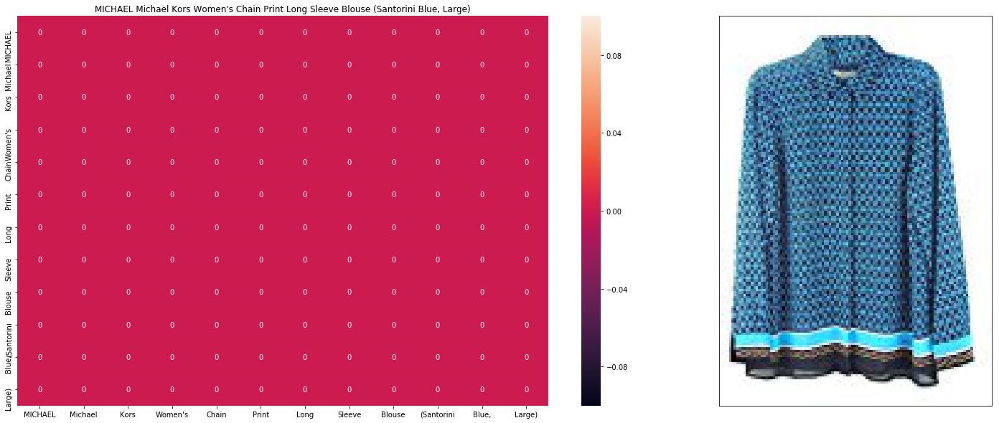

Product Title:  Fashion Crop Tops Women Casual Summer Emoji Sexy Lady Girl Shirt Hipster Tank Top
Euclidean Distance from input image: 0.011536824703216552
Amazon Url: www.amazon.com/dp/B010V3B44G


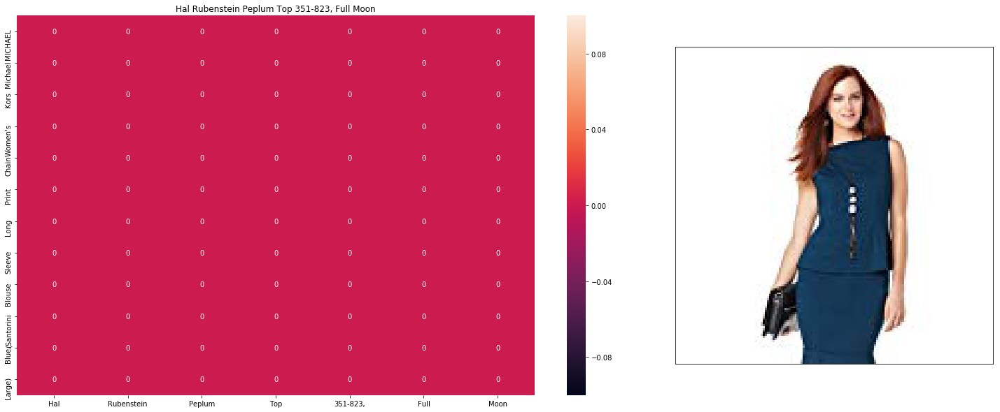

Product Title:  CHIC Women Harajuku Fashion Funny Emoji Sexy Crop tops Sleeveless Vest T Shirt
Euclidean Distance from input image: 7.127462387084961
Amazon Url: www.amazon.com/dp/B011RCJNL6


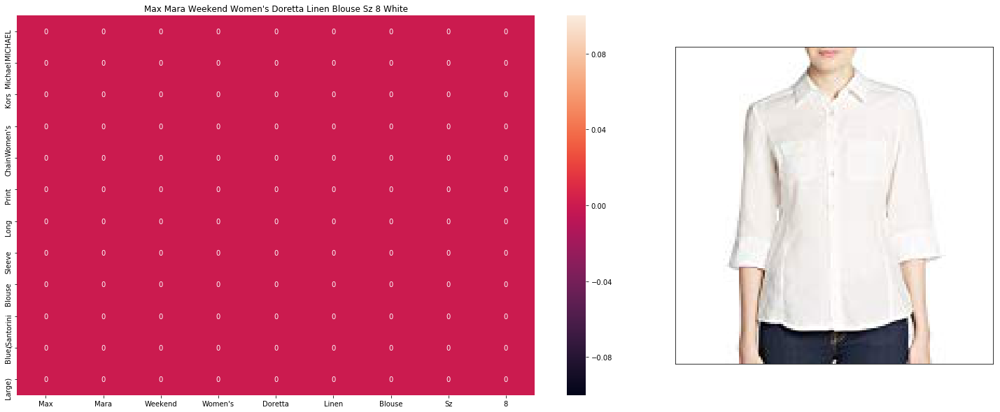

Product Title:  Women Quotes About Boys Print White Sleeveless Crop Top
Euclidean Distance from input image: 7.497840932654069
Amazon Url: www.amazon.com/dp/B0748CKWF3


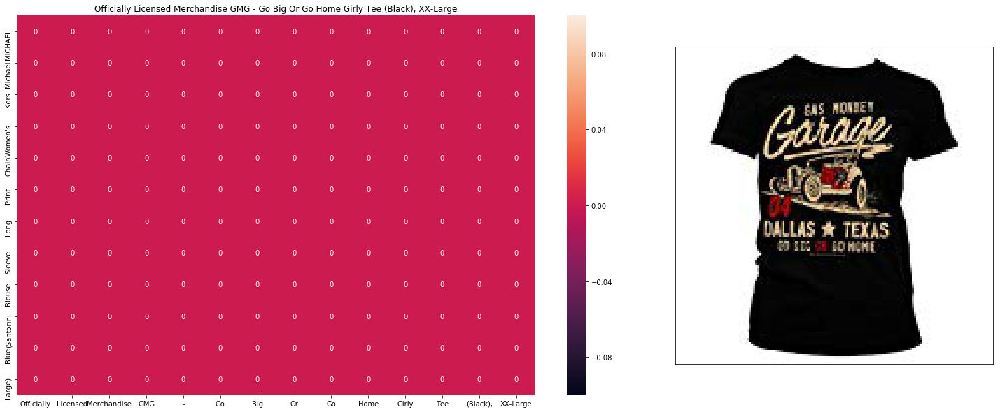

Product Title:  Women Forever Young Print White Sleeveless Crop Top
Euclidean Distance from input image: 8.026273279946366
Amazon Url: www.amazon.com/dp/B0748CDWPH


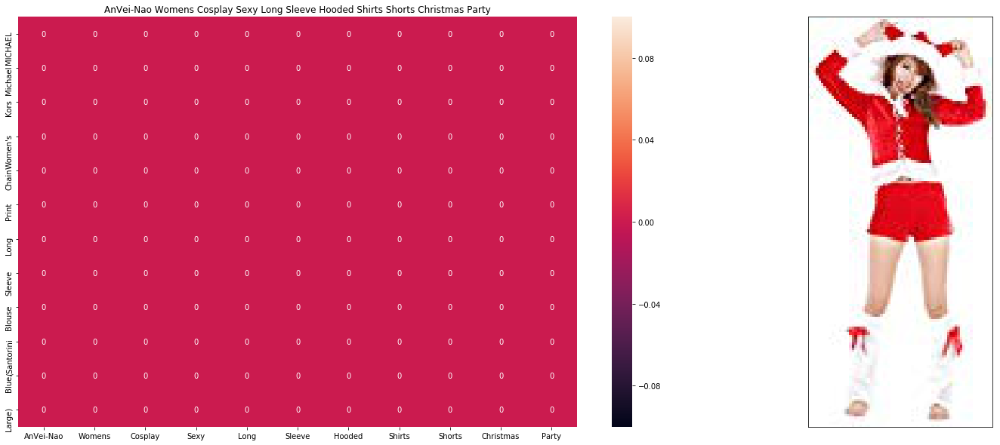

Product Title:  Kingde Self Confident Stretch vest T-shirt Suspenders(BQN46)
Euclidean Distance from input image: 8.209136702441537
Amazon Url: www.amazon.com/dp/B015H2R3SC


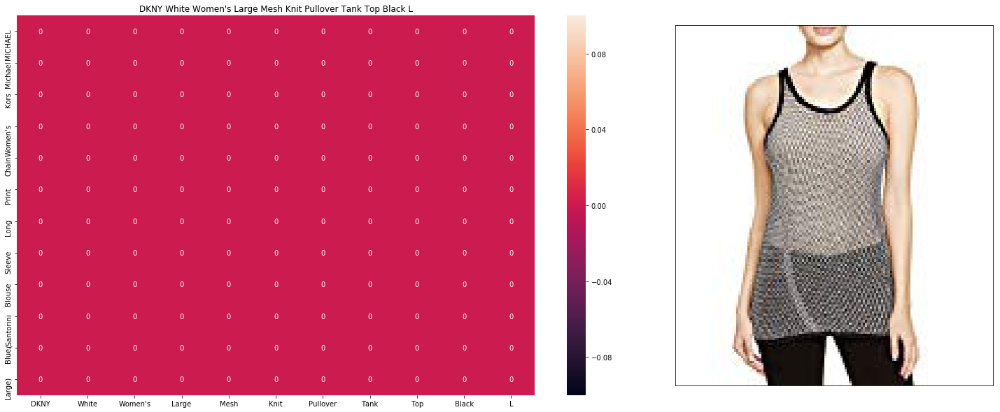

Product Title:  Women The Infinity Books Print White Sleeveless Crop Top
Euclidean Distance from input image: 8.227800992773698
Amazon Url: www.amazon.com/dp/B074TYKHPL


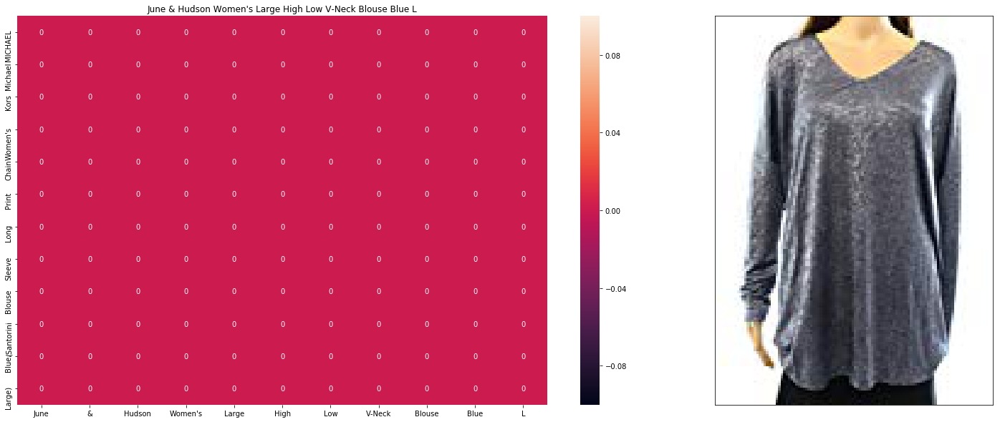

Product Title:  Ladies Crop Top Emoji Women Never Grow Up t shirt Vest Style Tank Tops
Euclidean Distance from input image: 8.562112617492676
Amazon Url: www.amazon.com/dp/B013SPUM7O


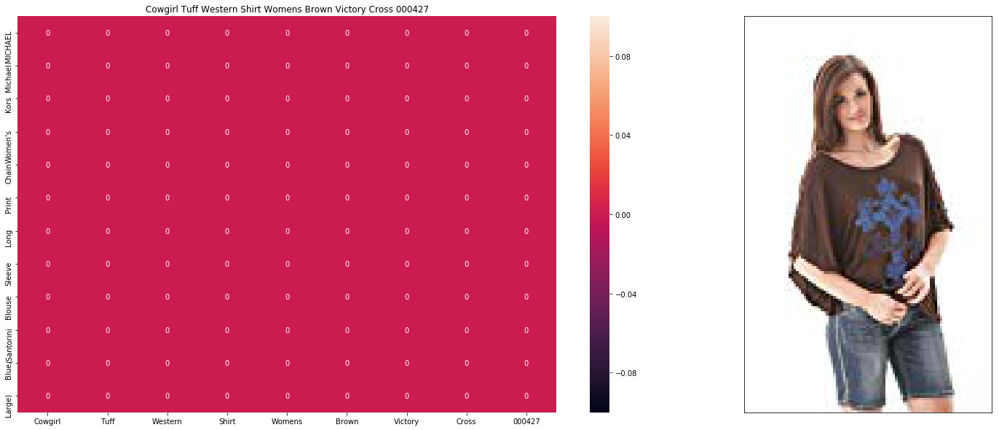

Product Title:  Women Three Wise Monkeys Emoji Print Sleeveless Crop Top
Euclidean Distance from input image: 8.693652274035774
Amazon Url: www.amazon.com/dp/B074VPC98H


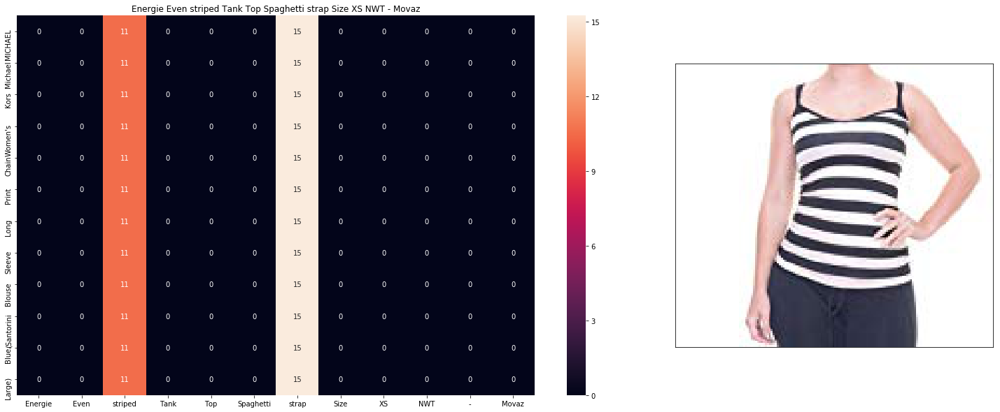

Product Title:  Women Just Keep Swimming Print Sleeveless Crop Top
Euclidean Distance from input image: 9.283566023730598
Amazon Url: www.amazon.com/dp/B0749CCCY4


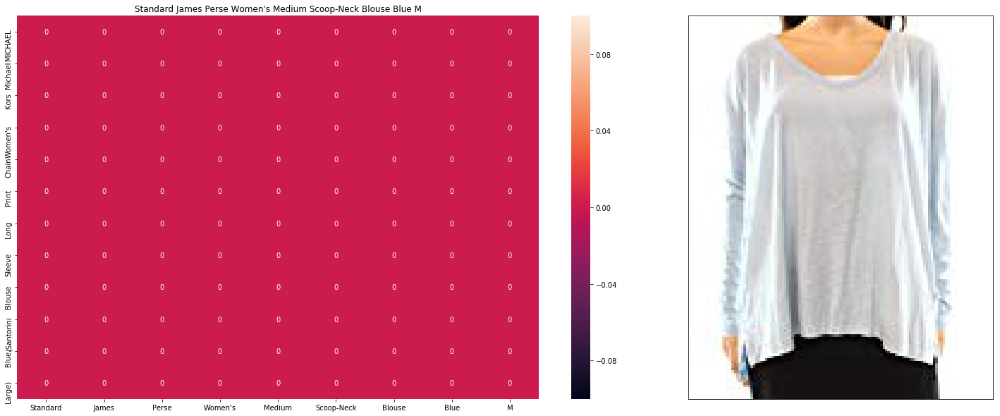

Product Title:  Women Fashion Best Friends Printed "Best" Pattern One Sleeveless Crop Top
Euclidean Distance from input image: 9.353532413381295
Amazon Url: www.amazon.com/dp/B01GFJOGUE


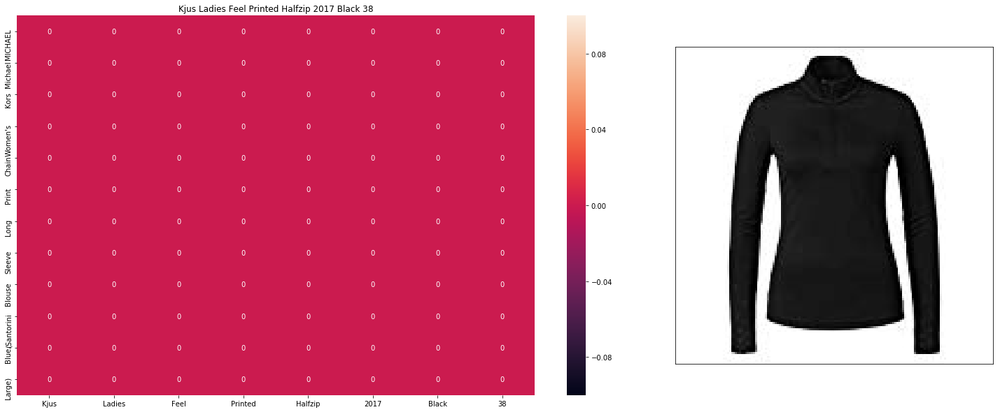

Product Title:  Women Fashion I Love Food Printed White Crop Top
Euclidean Distance from input image: 9.397976735876725
Amazon Url: www.amazon.com/dp/B017K0DQZ8


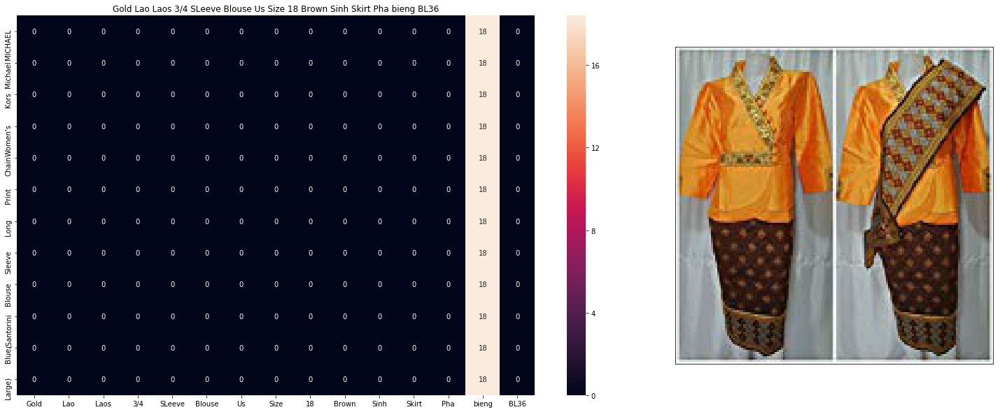

Product Title:  Women Fashion Cute Word Printed My Name is Barbie Sleeveless Crop Top
Euclidean Distance from input image: 9.457888724231086
Amazon Url: www.amazon.com/dp/B01AK8SC10


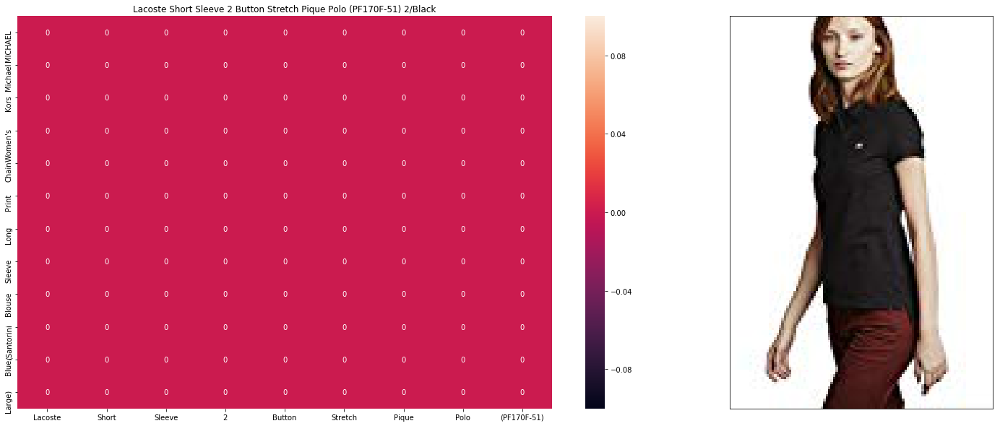

Product Title:  Women Ya-Bish Print White Sleeveless Crop Top
Euclidean Distance from input image: 9.594039968298599
Amazon Url: www.amazon.com/dp/B0748JNFL9


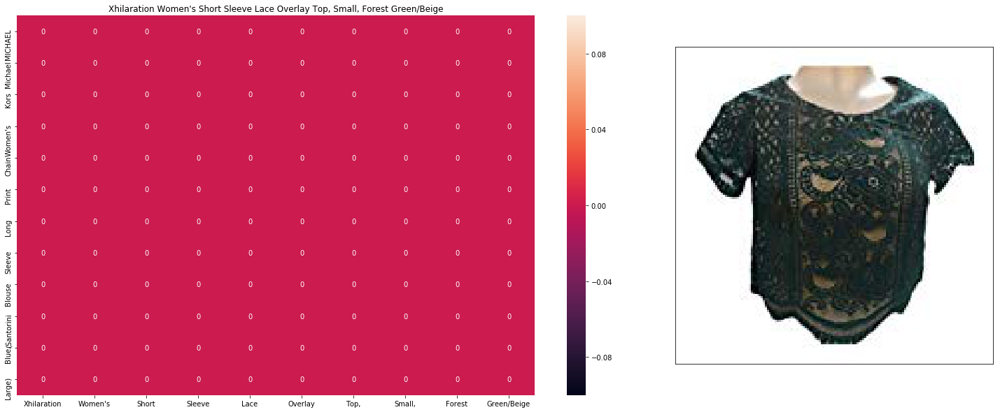

Product Title:  Kingde Slim Starbucks Coffee Small vest T-shirt Sling Stretch(BQN53)
Euclidean Distance from input image: 9.63346293525032
Amazon Url: www.amazon.com/dp/B015H2QWY8


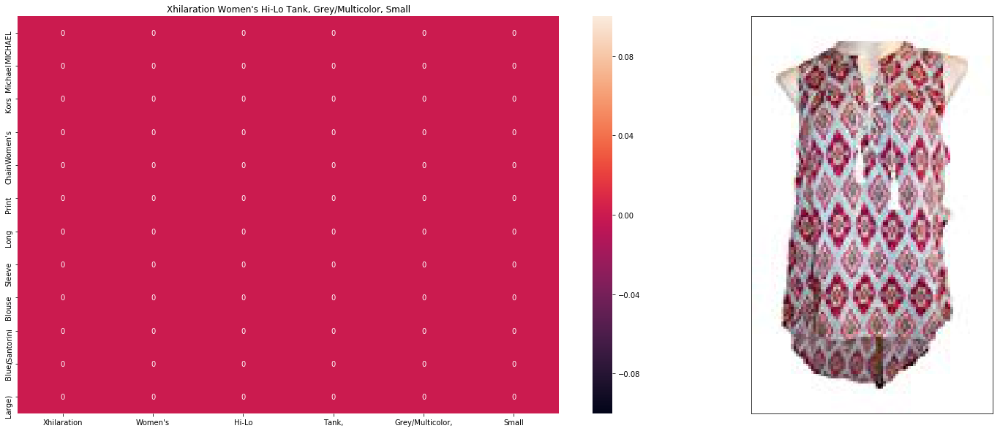

Product Title:  Women Fashion Infinity for Books Printed White Crop Top
Euclidean Distance from input image: 9.688389803790413
Amazon Url: www.amazon.com/dp/B017K0BCX6


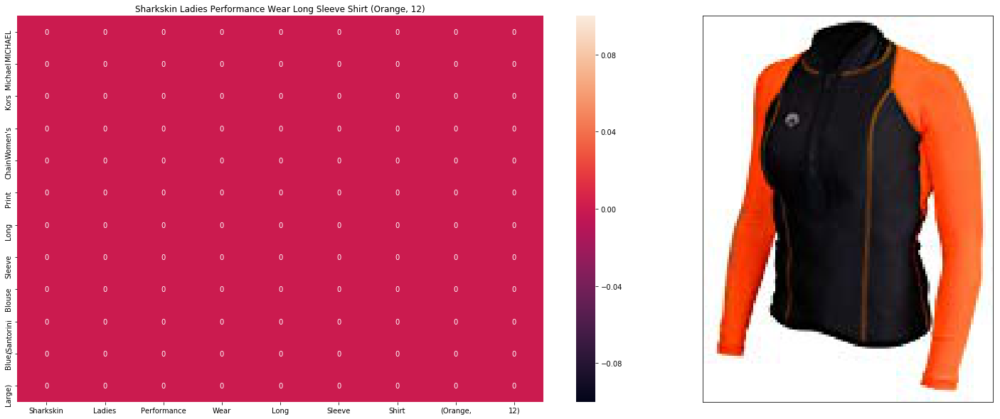

Product Title:  Women Fashion Cool Quote About Me Printed Sleeveless Crop Top
Euclidean Distance from input image: 9.721015600012466
Amazon Url: www.amazon.com/dp/B018RVK1FM


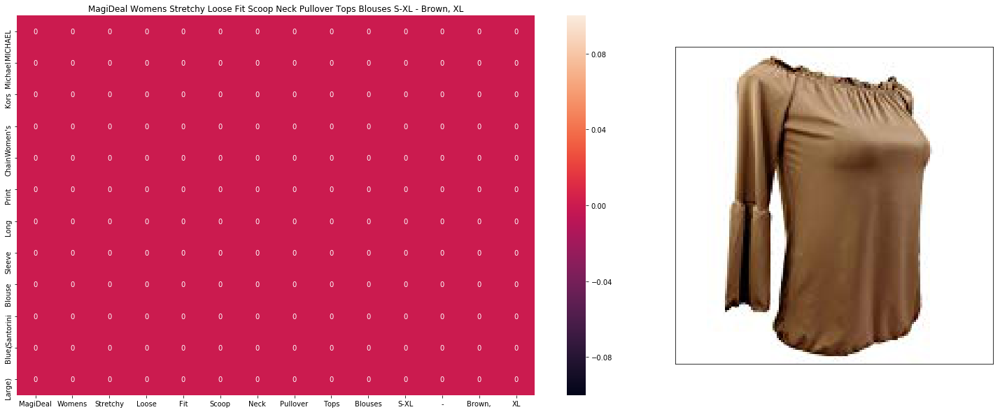

Product Title:  CHIC Summer Women Funny Crop Top Fashion Short Sleeveless Casual T Shirt
Euclidean Distance from input image: 9.831410459326431
Amazon Url: www.amazon.com/dp/B011RCIVS2


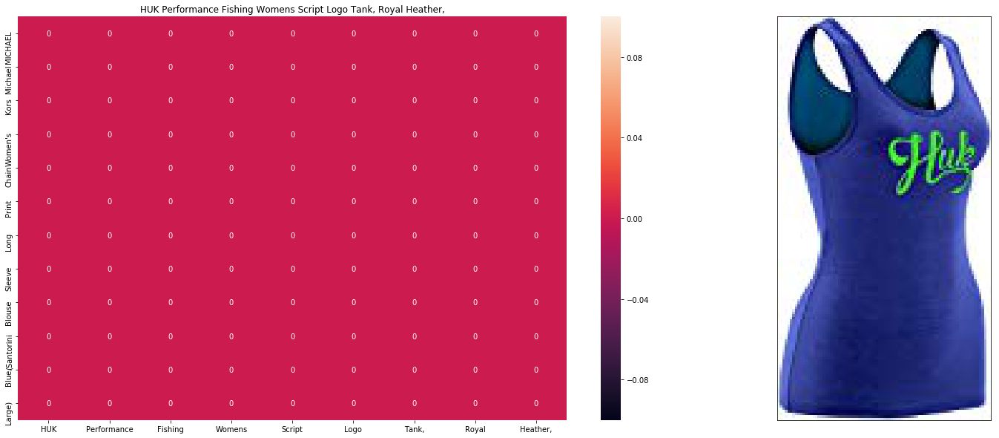

Product Title:  Women Summer Crop Top Harajuku Sexy Lady Slim Shirt Hipster Tank Top
Euclidean Distance from input image: 9.86948786153193
Amazon Url: www.amazon.com/dp/B010V3EDEE


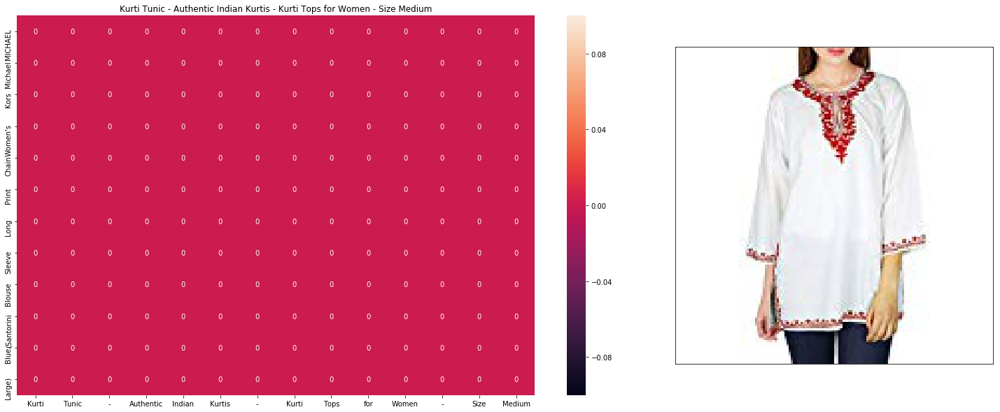

Product Title:  Women Fashion Giant Pink Donut Printed White Sleeveless Crop Top
Euclidean Distance from input image: 9.957871679114028
Amazon Url: www.amazon.com/dp/B017Q4BOCA


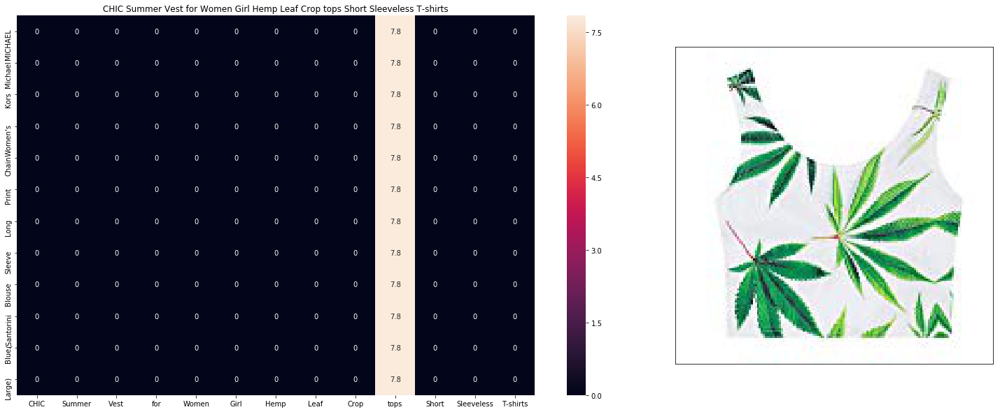

Product Title:  Women (Pattern 8) Cute Baby Alien Print Sleeveless Crop Top
Euclidean Distance from input image: 10.008018423938118
Amazon Url: www.amazon.com/dp/B074BNJM8S


In [47]:
from IPython.display import display, Image, SVG, Math, YouTubeVideo
import PIL.Image

#get similar products using CNN features (VGG-16)
def get_similar_products_cnn(doc_id, w1, w2, w3, w4, num_results):
    doc_id = asins.index(df_asins[doc_id])
    title = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    brand  = pairwise_distances(extra_features, extra_features[doc_id])
    color = pairwise_distances(extra_features1, extra_features1[doc_id])
    image = pairwise_distances(bottleneck_features_train, bottleneck_features_train[doc_id].reshape(1,-1))
    pairwise_dist = (w1 * title[0:16042] +  w2 * brand[0:16042] + w3 * image + w4*color[0:16042])/float(w1 + w2 + w3 + w4)


    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]
    
    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])

    for i in range(len(indices)):
        rows = data[['medium_image_url','title']].loc[data['asin']==asins[indices[i]]]
        heat_map_w2v_brand(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        for indx, row in rows.iterrows():
            #display(Image(url=row['medium_image_url'], embed=True))
            print('Product Title: ', row['title'])
            print('Euclidean Distance from input image:', pdists[i])
            print('Amazon Url: www.amazon.com/dp/'+ asins[indices[i]])

get_similar_products_cnn(12566, 5, 5, 5, 5, 20)

<table style="width:100%">
  <tr>
     <th> SR </th>
    <th>Weight of</th>
    <th>Nomenclature</th>
      
      
</tr>
  <tr>
    <td> 1. </td>
    <td>Title</td>
    <td>W1</td>
  <tr>
    <tr>
     <td> 2. </td>
    <td>Brand</td>
    <td>W2</td>
  <tr>
  <tr>
     <td> 3. </td>
    <td>color</td>
    <td>W4</td>
  <tr>
    <tr>
      <td> 4. </td>
    <td>IMAGE</td>
    <td>W3</td>
  <tr>
</tr>
</table> 


__GIVING MORE WEIGHT TO COLOR__

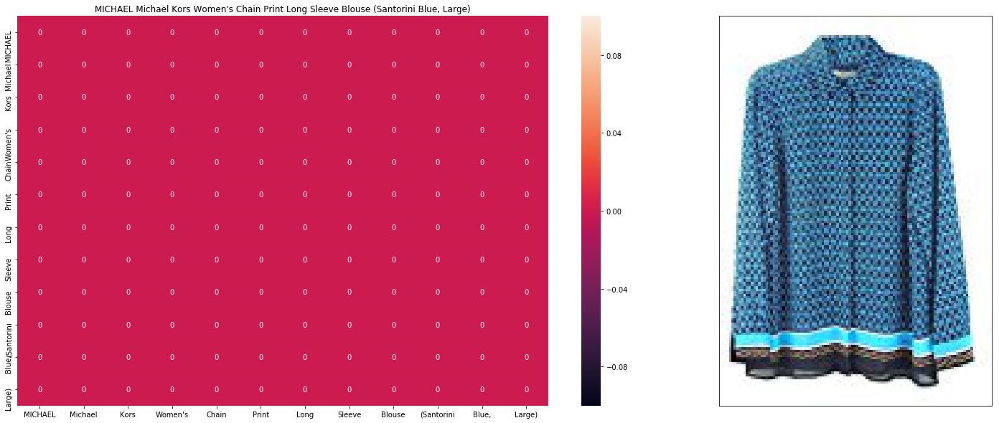

Product Title:  Fashion Crop Tops Women Casual Summer Emoji Sexy Lady Girl Shirt Hipster Tank Top
Euclidean Distance from input image: 0.0
Amazon Url: www.amazon.com/dp/B010V3B44G


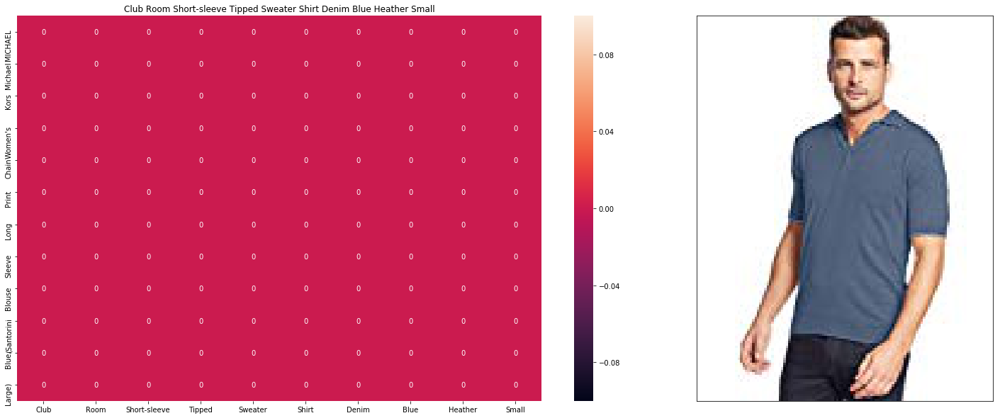

Product Title:  Mercu Women Short Sleeve Casual Basic Blouse Crop Top Alien T-Shirt Plus Size
Euclidean Distance from input image: 1.0
Amazon Url: www.amazon.com/dp/B01LCXQ21Y


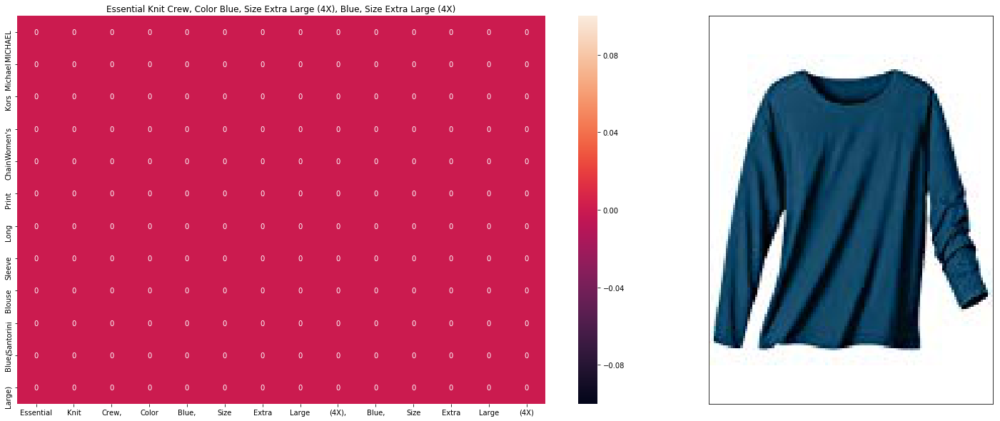

Product Title:  St. John Deep Women's Gathered Solid Seamed Blouse $195 Black 2
Euclidean Distance from input image: 1.0
Amazon Url: www.amazon.com/dp/B074TVF575


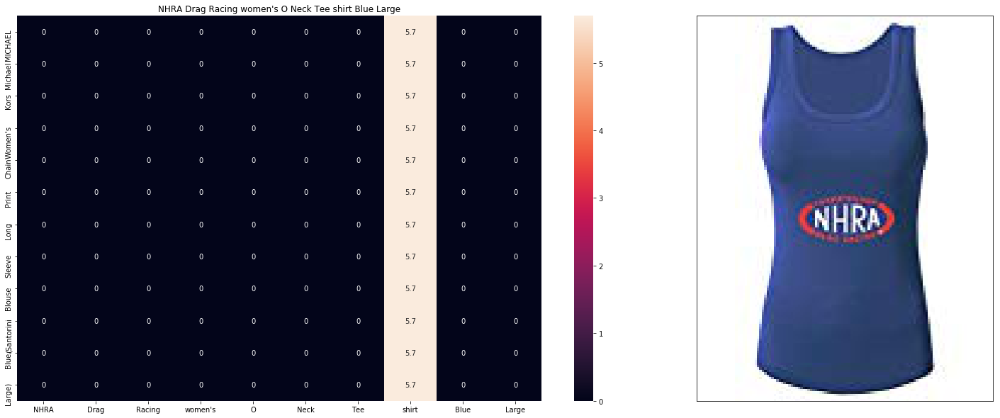

Product Title:  Bila Ladies Size Small V-Neck 5-Button Placket Front Mint Green
Euclidean Distance from input image: 1.0
Amazon Url: www.amazon.com/dp/B00XPR3B0Q


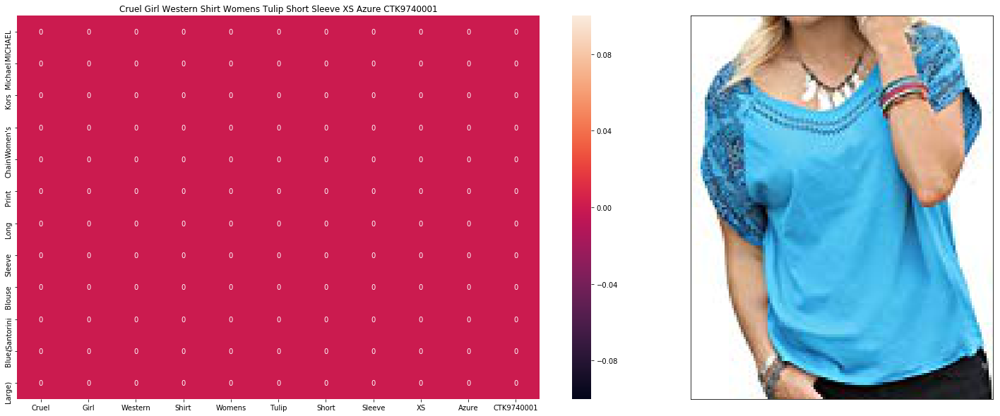

Product Title:  Pretty Rebellious Juniors Friday Graphic Baseball Greypink M
Euclidean Distance from input image: 1.0
Amazon Url: www.amazon.com/dp/B01NCSZYRA


In [60]:
get_similar_products_cnn(12566, 0, 0, 0, 50, 5)

__GIVING MORE WEIGHT TO IMAGE__

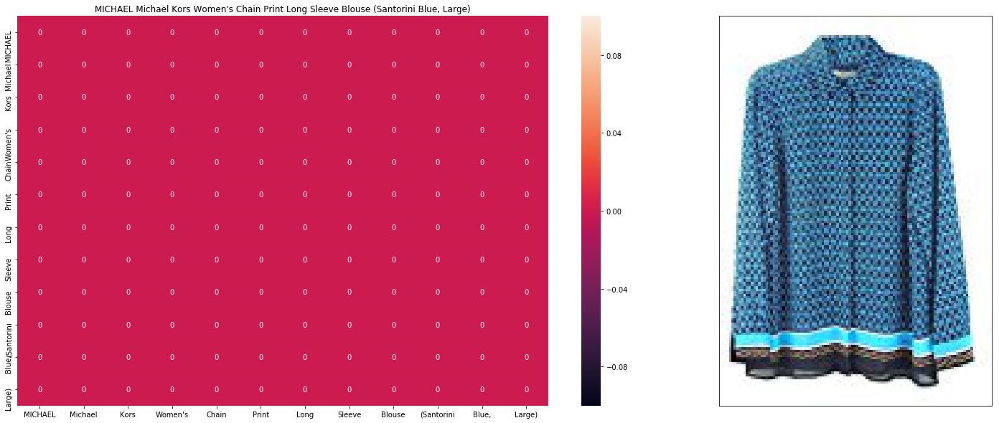

Product Title:  Fashion Crop Tops Women Casual Summer Emoji Sexy Lady Girl Shirt Hipster Tank Top
Euclidean Distance from input image: 0.04419417381286621
Amazon Url: www.amazon.com/dp/B010V3B44G


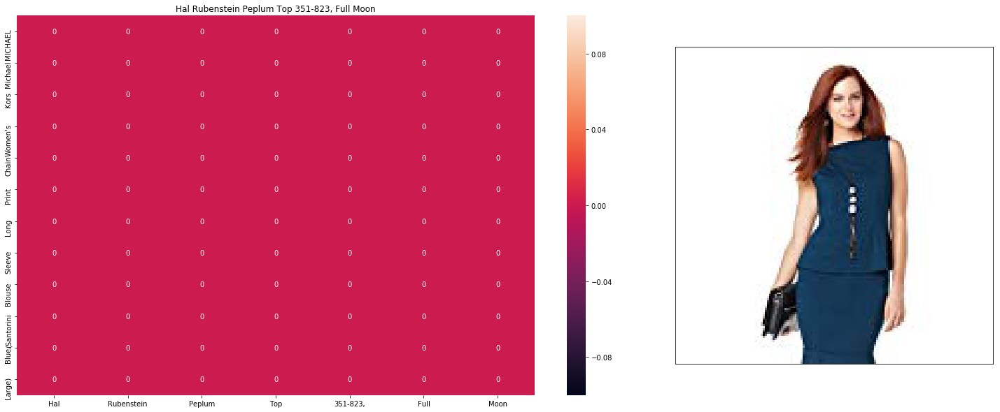

Product Title:  CHIC Women Harajuku Fashion Funny Emoji Sexy Crop tops Sleeveless Vest T Shirt
Euclidean Distance from input image: 18.58573974609375
Amazon Url: www.amazon.com/dp/B011RCJNL6


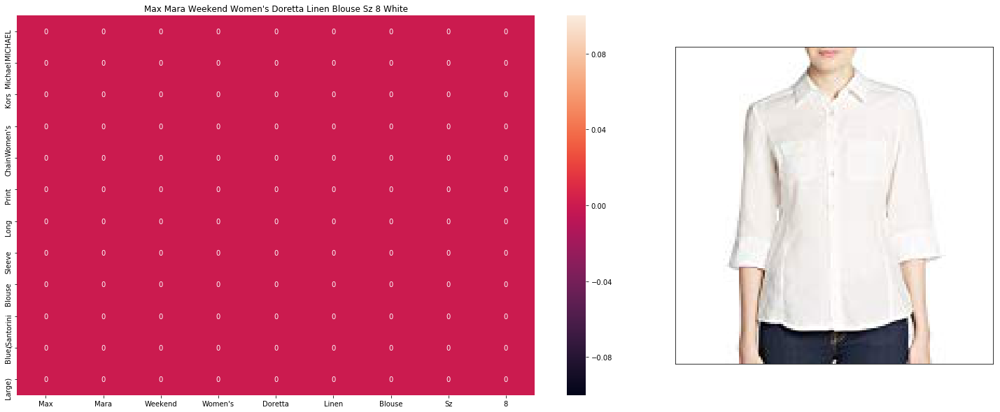

Product Title:  Women Quotes About Boys Print White Sleeveless Crop Top
Euclidean Distance from input image: 22.04553955078125
Amazon Url: www.amazon.com/dp/B0748CKWF3


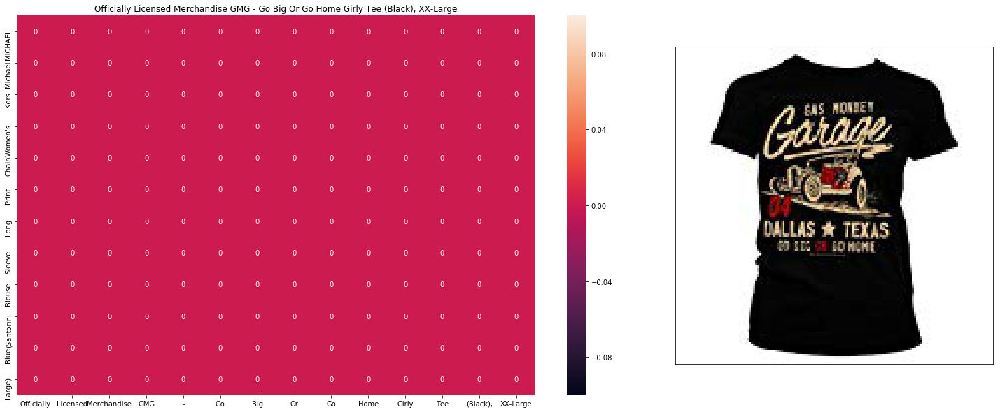

Product Title:  Women Forever Young Print White Sleeveless Crop Top
Euclidean Distance from input image: 22.3210546875
Amazon Url: www.amazon.com/dp/B0748CDWPH


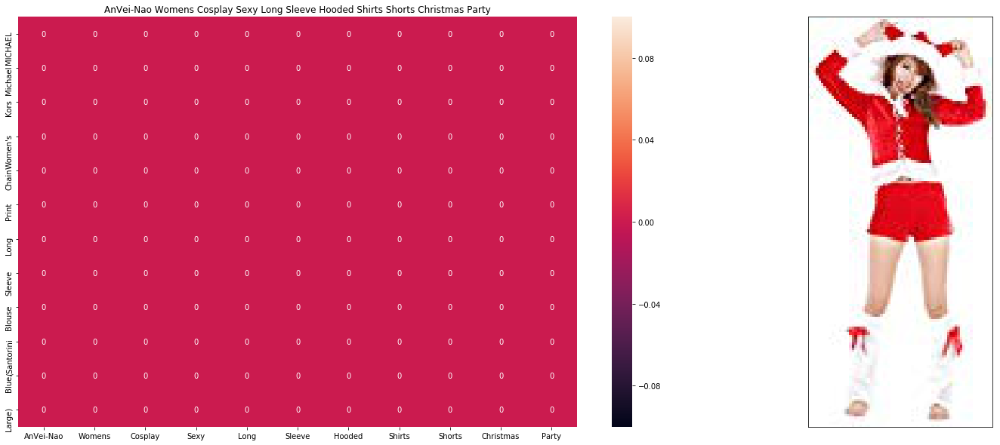

Product Title:  Kingde Self Confident Stretch vest T-shirt Suspenders(BQN46)
Euclidean Distance from input image: 22.724638671875
Amazon Url: www.amazon.com/dp/B015H2R3SC


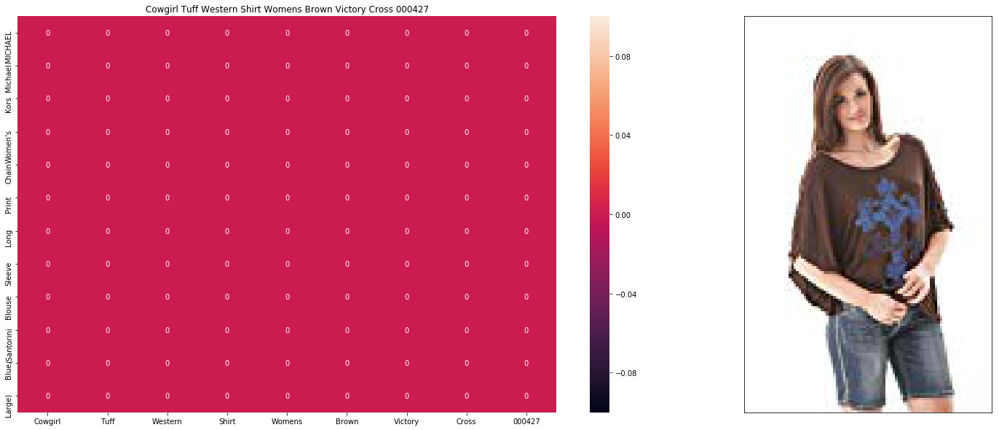

Product Title:  Women Three Wise Monkeys Emoji Print Sleeveless Crop Top
Euclidean Distance from input image: 24.45260009765625
Amazon Url: www.amazon.com/dp/B074VPC98H


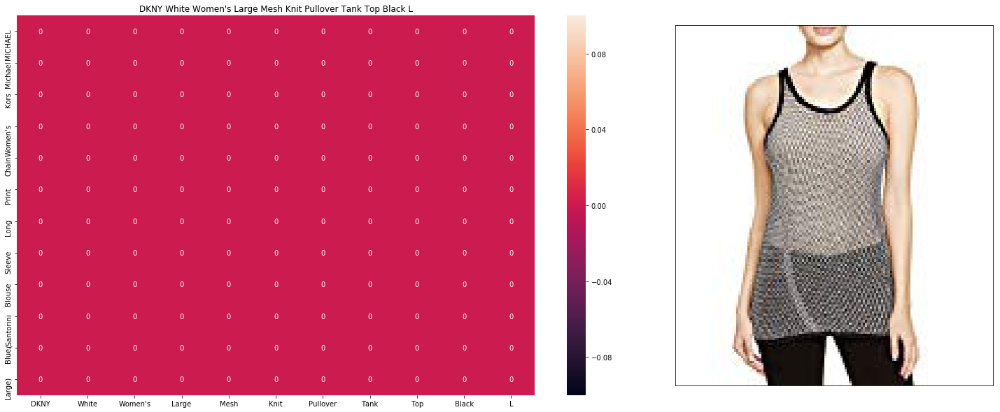

Product Title:  Women The Infinity Books Print White Sleeveless Crop Top
Euclidean Distance from input image: 25.06732177734375
Amazon Url: www.amazon.com/dp/B074TYKHPL


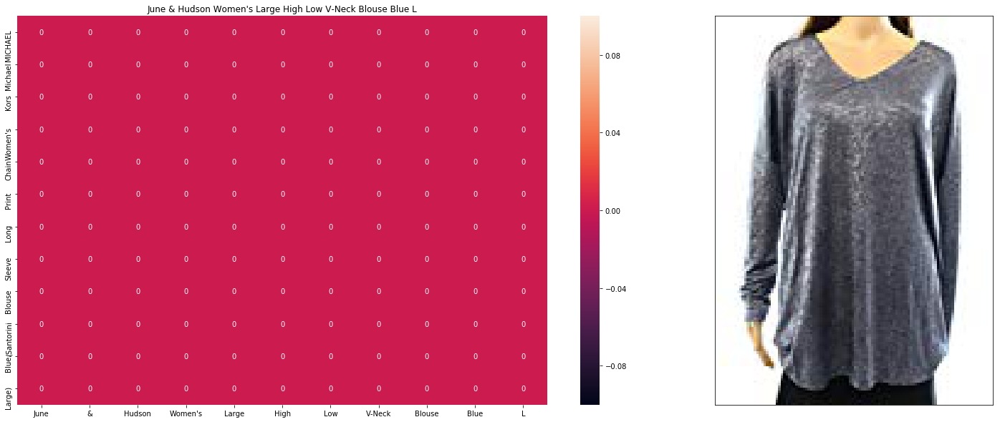

Product Title:  Ladies Crop Top Emoji Women Never Grow Up t shirt Vest Style Tank Tops
Euclidean Distance from input image: 26.78724853515625
Amazon Url: www.amazon.com/dp/B013SPUM7O


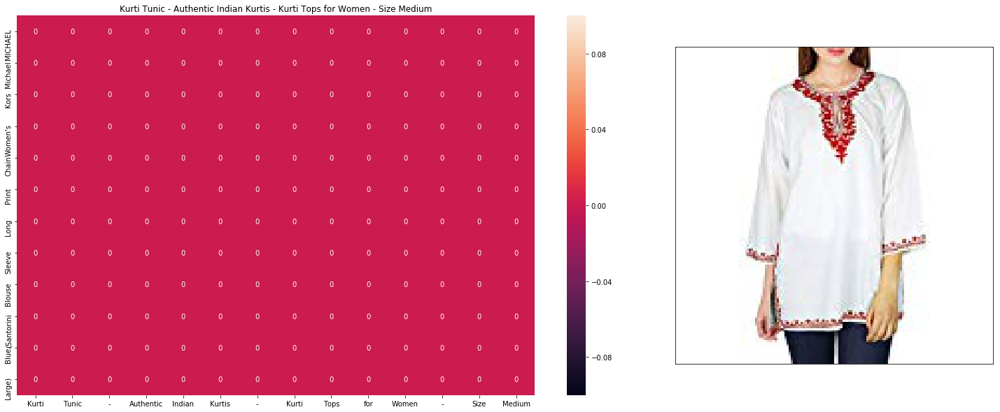

Product Title:  Women Fashion Giant Pink Donut Printed White Sleeveless Crop Top
Euclidean Distance from input image: 28.364716796875
Amazon Url: www.amazon.com/dp/B017Q4BOCA


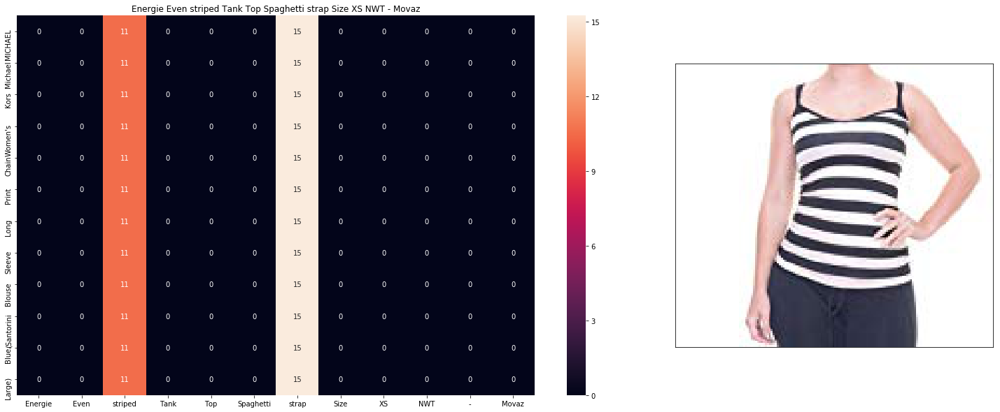

Product Title:  Women Just Keep Swimming Print Sleeveless Crop Top
Euclidean Distance from input image: 29.0222509765625
Amazon Url: www.amazon.com/dp/B0749CCCY4


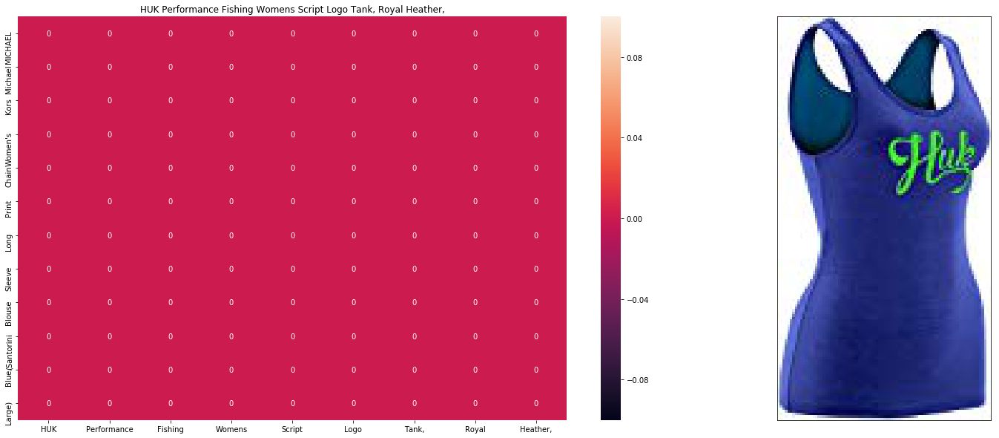

Product Title:  Women Summer Crop Top Harajuku Sexy Lady Slim Shirt Hipster Tank Top
Euclidean Distance from input image: 29.0292138671875
Amazon Url: www.amazon.com/dp/B010V3EDEE


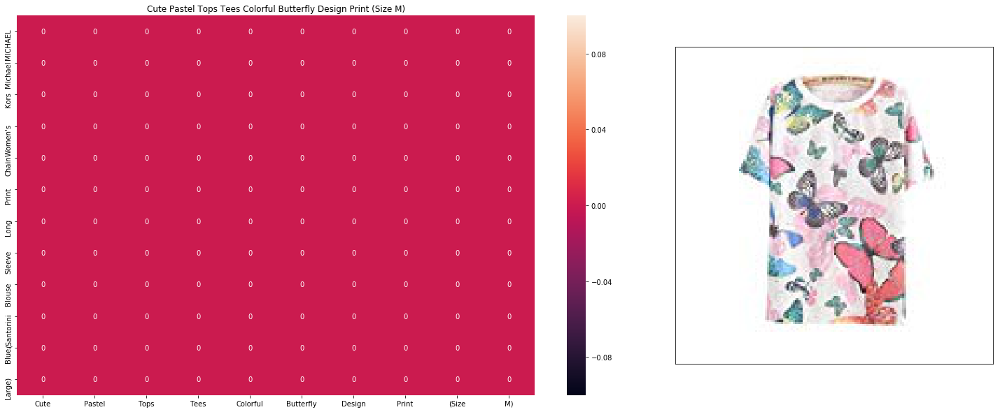

Product Title:  Women Fashion I Just Wanna Hug Printed White Sleeveless Crop Top
Euclidean Distance from input image: 29.04951904296875
Amazon Url: www.amazon.com/dp/B017R0CDOQ


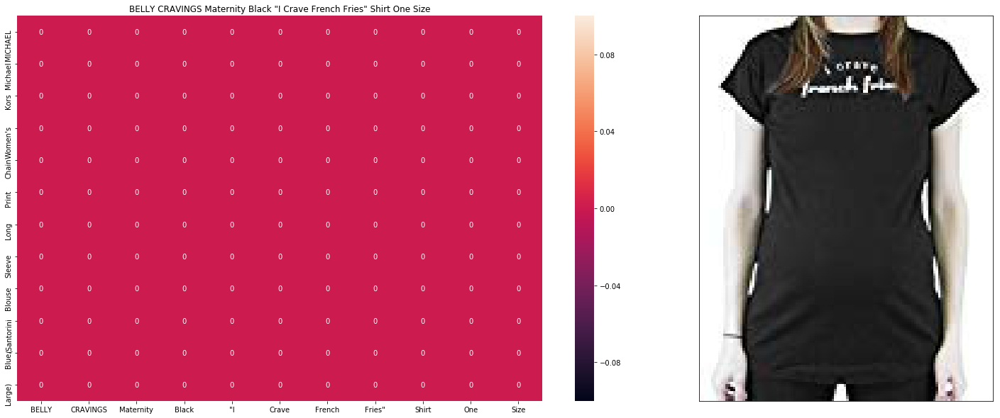

Product Title:  Summer Emoji Sexy Lady Girl Fashion Crop Tops Women Casual Shirt Hipster Tank Top
Euclidean Distance from input image: 29.482333984375
Amazon Url: www.amazon.com/dp/B010V3BDII


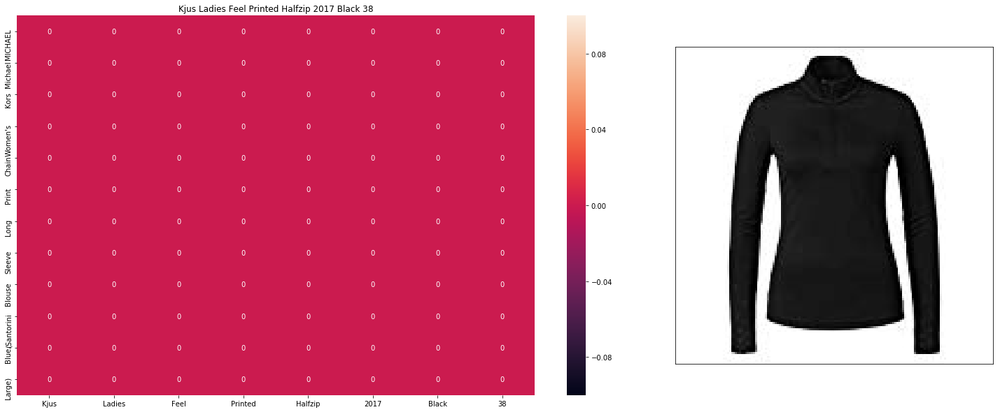

Product Title:  Women Fashion I Love Food Printed White Crop Top
Euclidean Distance from input image: 29.61532470703125
Amazon Url: www.amazon.com/dp/B017K0DQZ8


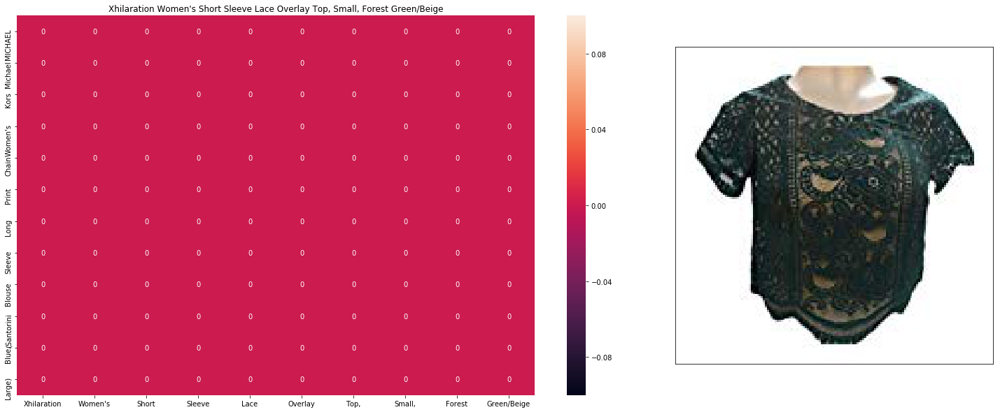

Product Title:  Kingde Slim Starbucks Coffee Small vest T-shirt Sling Stretch(BQN53)
Euclidean Distance from input image: 29.6900341796875
Amazon Url: www.amazon.com/dp/B015H2QWY8


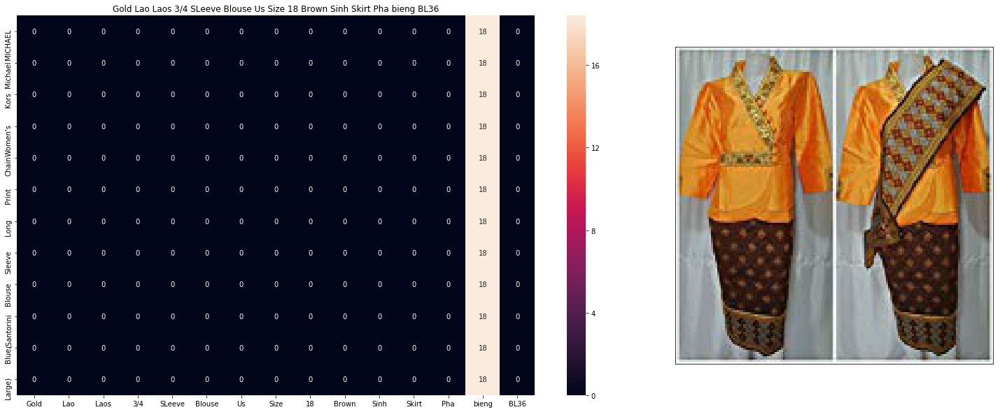

Product Title:  Women Fashion Cute Word Printed My Name is Barbie Sleeveless Crop Top
Euclidean Distance from input image: 29.86229736328125
Amazon Url: www.amazon.com/dp/B01AK8SC10


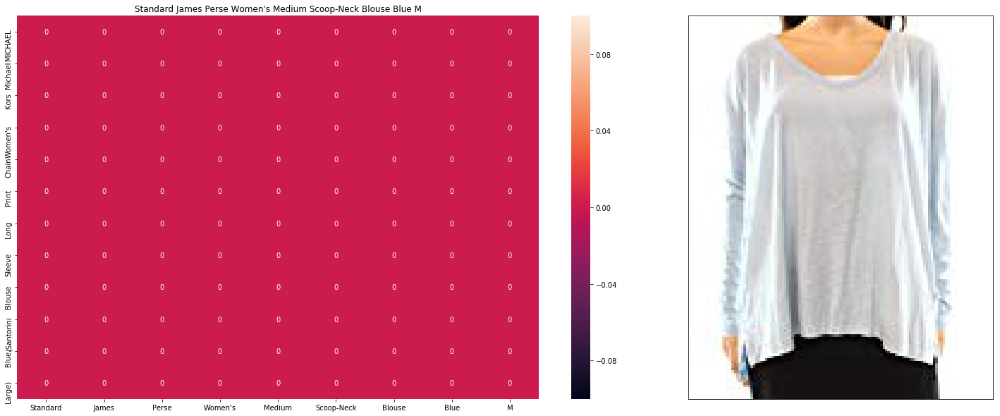

Product Title:  Women Fashion Best Friends Printed "Best" Pattern One Sleeveless Crop Top
Euclidean Distance from input image: 29.954873046875
Amazon Url: www.amazon.com/dp/B01GFJOGUE


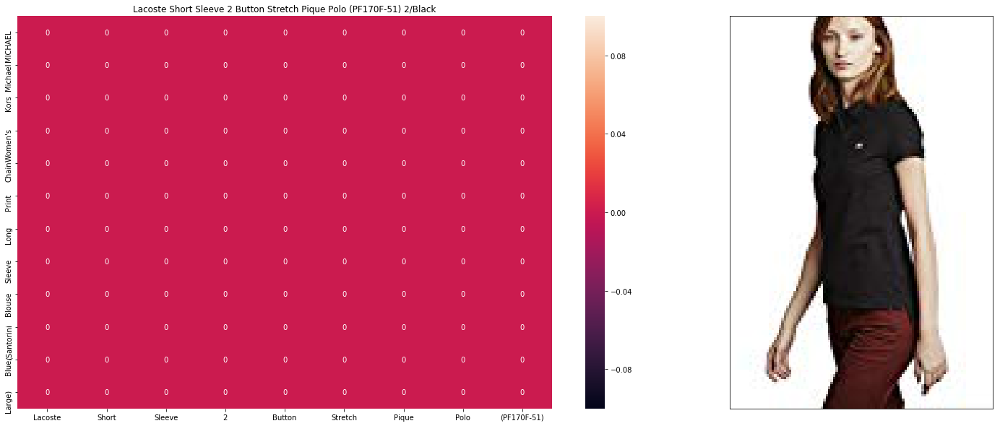

Product Title:  Women Ya-Bish Print White Sleeveless Crop Top
Euclidean Distance from input image: 30.08440185546875
Amazon Url: www.amazon.com/dp/B0748JNFL9


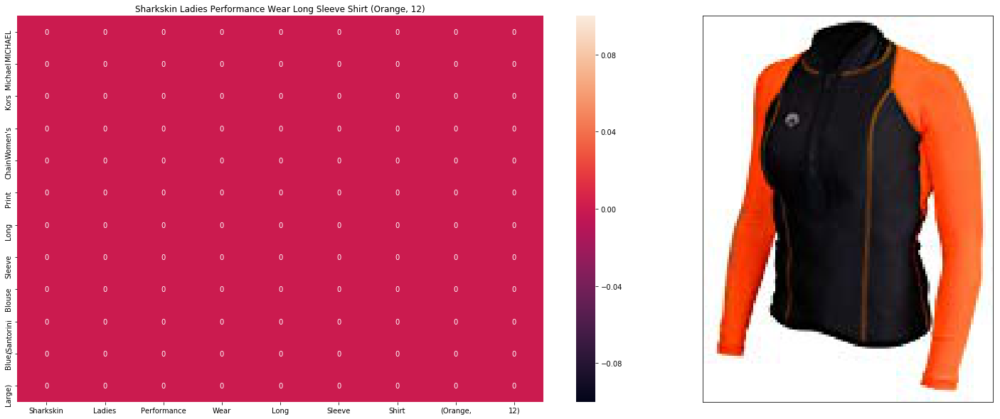

Product Title:  Women Fashion Cool Quote About Me Printed Sleeveless Crop Top
Euclidean Distance from input image: 30.1005810546875
Amazon Url: www.amazon.com/dp/B018RVK1FM


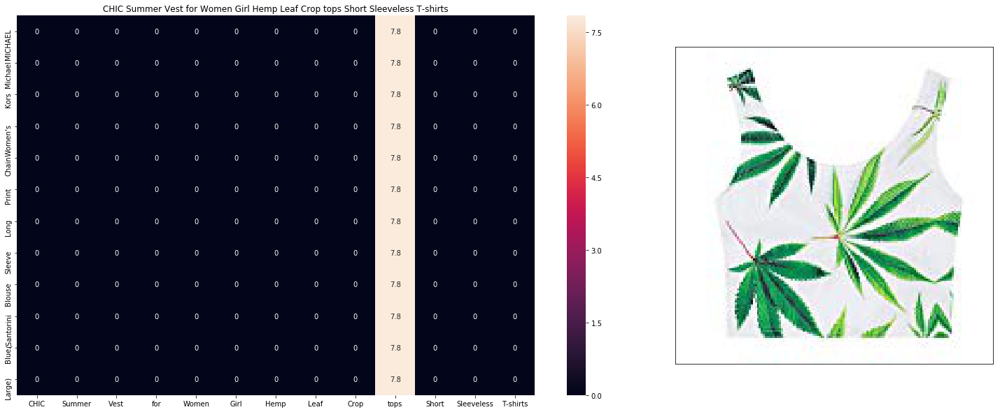

Product Title:  Women (Pattern 8) Cute Baby Alien Print Sleeveless Crop Top
Euclidean Distance from input image: 30.1804638671875
Amazon Url: www.amazon.com/dp/B074BNJM8S


In [61]:
get_similar_products_cnn(12566, 0, 0, 50, 0, 20)

__GIVING MORE WEIGHT TO BRAND__

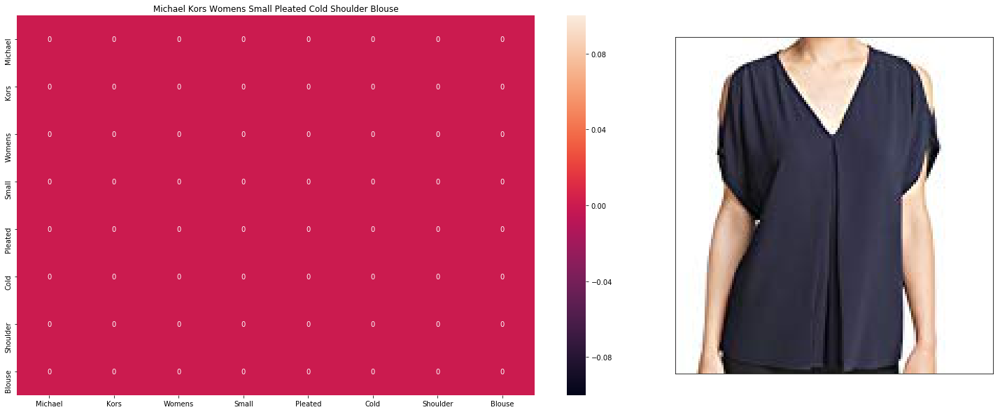

Product Title:  FORNARINA Women's Salt Bis Plaid Off Shoulder Stretch Top Sz Small Blue
Euclidean Distance from input image: 0.0
Amazon Url: www.amazon.com/dp/B0184RPLUO


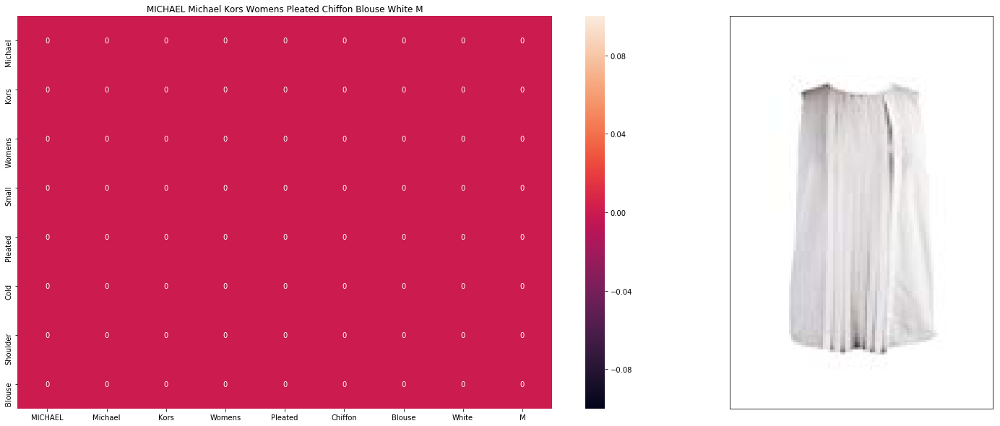

Product Title:  Women's Two-toned T Shirts-Funny Ariana Singer Grande Cute Cartoon Poster 433 Black SizeL
Euclidean Distance from input image: 0.0
Amazon Url: www.amazon.com/dp/B01G0A79WA


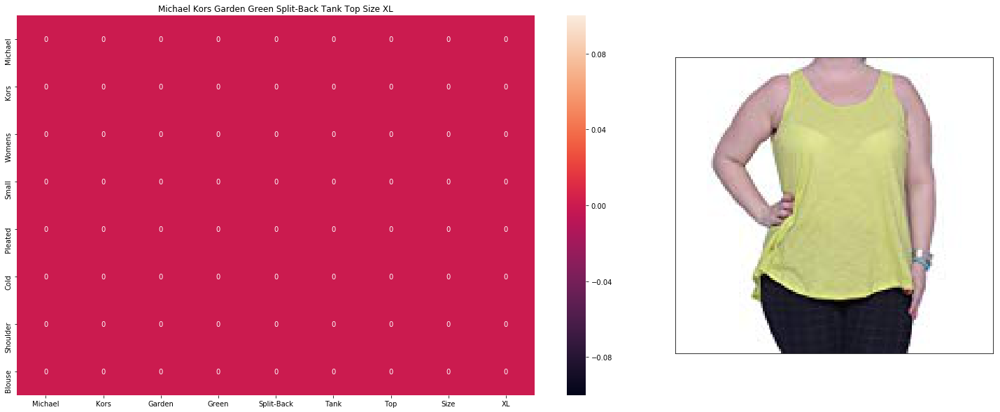

Product Title:  ZEKO Women's Fashion Sleeveless Shirt Deathstroke Size S Black
Euclidean Distance from input image: 0.0
Amazon Url: www.amazon.com/dp/B01547U3E6


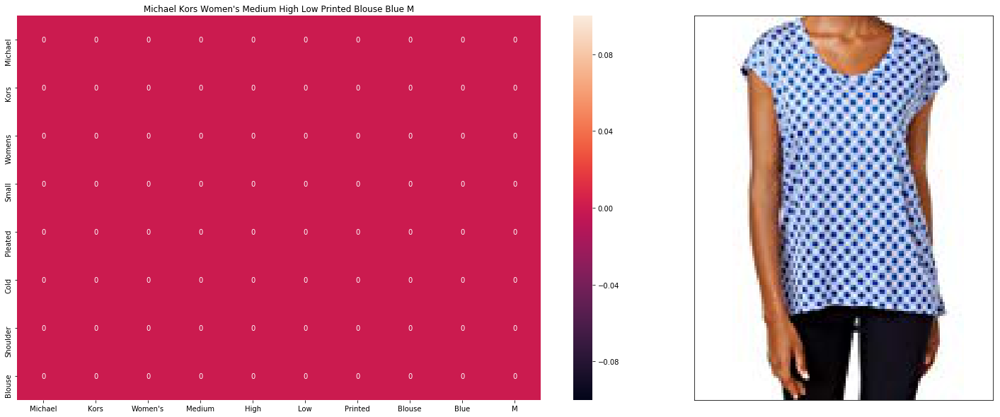

Product Title:  Next Level Apparel Women's Soft Deep V-Neck T-Shirt, Vintage Dark Black, Medium
Euclidean Distance from input image: 0.0
Amazon Url: www.amazon.com/dp/B00MPWB6LS


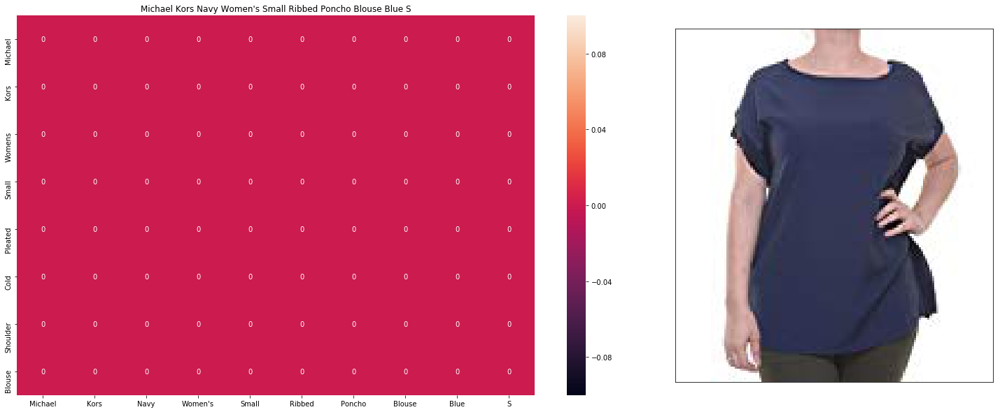

Product Title:  BODEN Women's Cuff Detail Palazzo Top US Sz 2 Multicolored
Euclidean Distance from input image: 0.0
Amazon Url: www.amazon.com/dp/B01H62TXS4


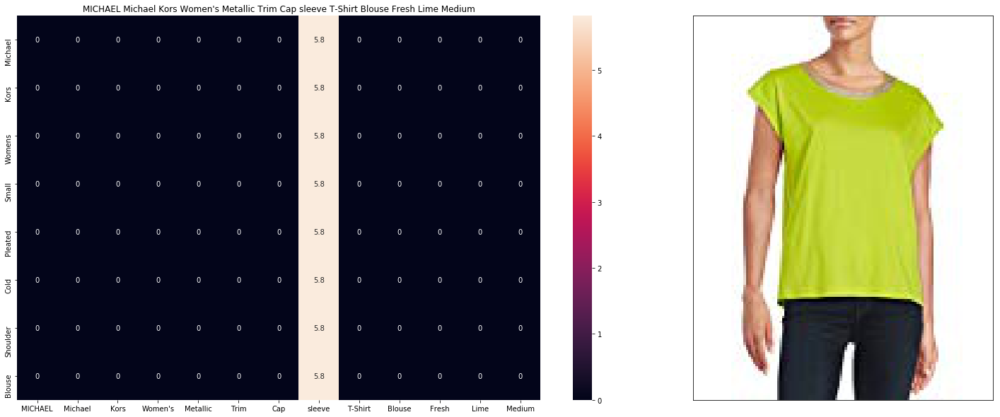

Product Title:  YICHUN Women's Cartoon Printed Summer T-shirts Tops Casual Wear Tees
Euclidean Distance from input image: 0.0
Amazon Url: www.amazon.com/dp/B011VF9B66


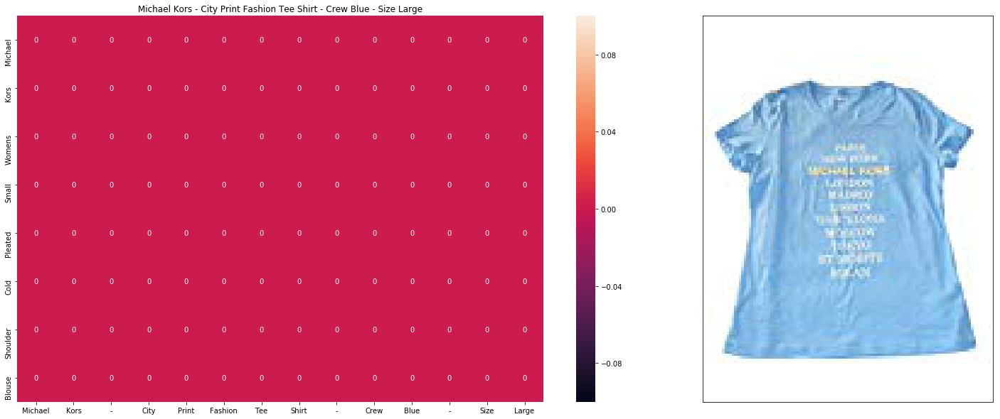

Product Title:  Nygard Women's Petite Slims Beaded tunic Pink Multi
Euclidean Distance from input image: 0.0
Amazon Url: www.amazon.com/dp/B00TQSRDPM


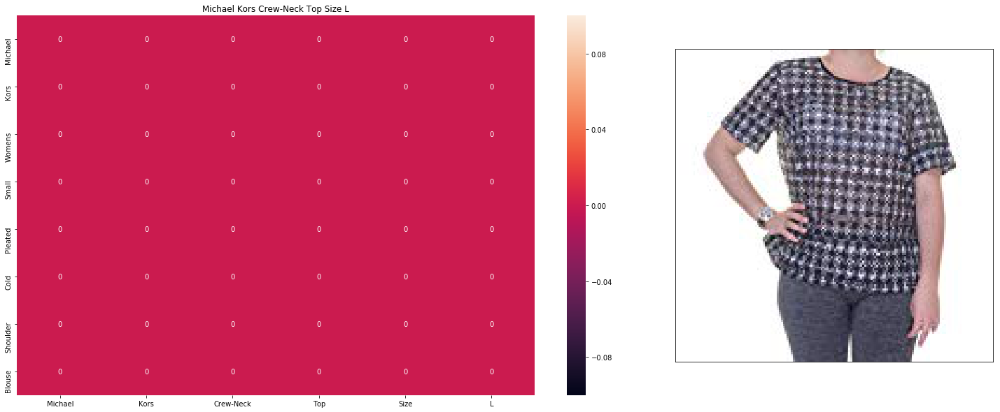

Product Title:  Cecilia Pink Women's Wrap Front Bralette (L)
Euclidean Distance from input image: 0.0
Amazon Url: www.amazon.com/dp/B01G6RHWJ2


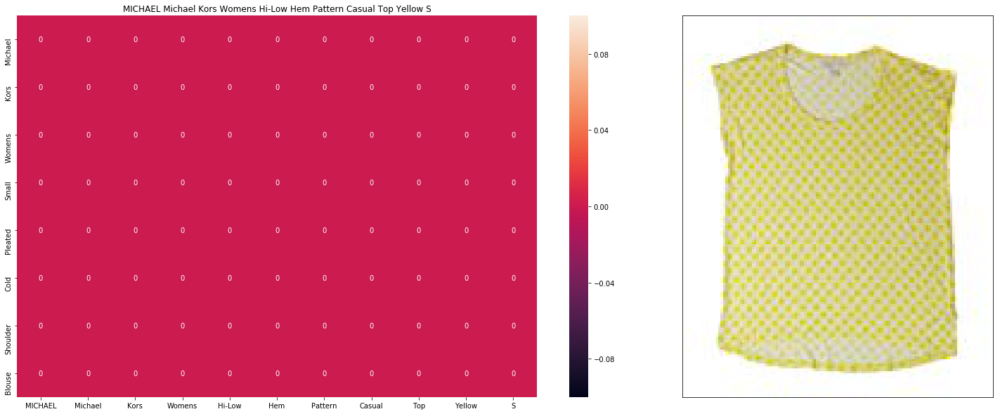

Product Title:  C&C California Women's Striped Shark Bite Tank Top in City Blue, Size Small
Euclidean Distance from input image: 0.0
Amazon Url: www.amazon.com/dp/B018RH41D4


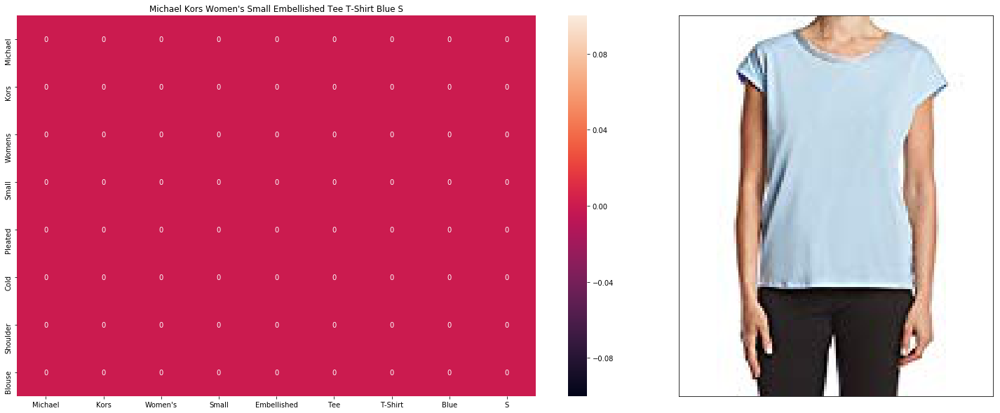

Product Title:  European Painting Colorful Loose Short T-shirt Bky12-store2-021
Euclidean Distance from input image: 0.0
Amazon Url: www.amazon.com/dp/B012B6ABTA


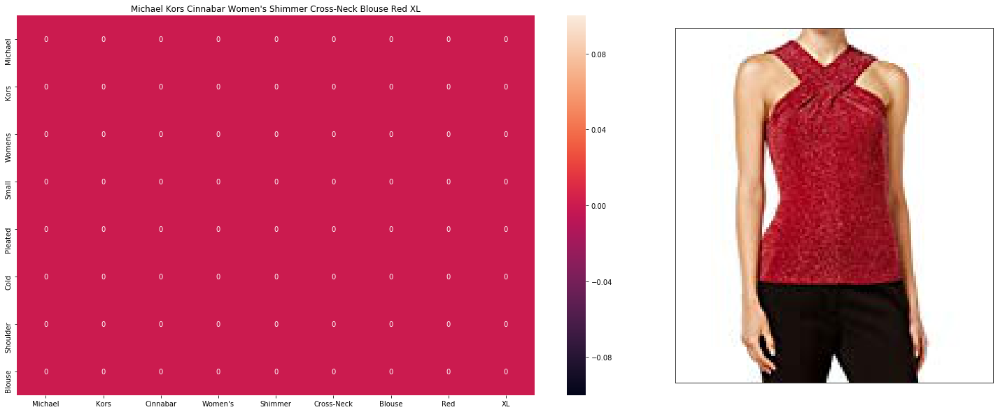

Product Title:  Free People Women's Ventura High/Low Thermal Top, Size X-Small - Black
Euclidean Distance from input image: 0.0
Amazon Url: www.amazon.com/dp/B00ZH2WMIE


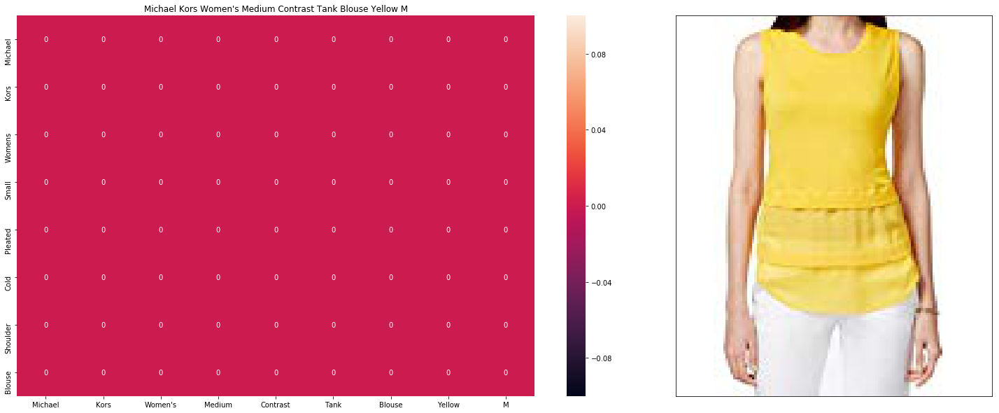

Product Title:  Charter Club Women's Plus Short Sleeve Pima Cotton Boat Neck Shirt (0x, Strawberry Ice)
Euclidean Distance from input image: 0.0
Amazon Url: www.amazon.com/dp/B01CUZIDK6


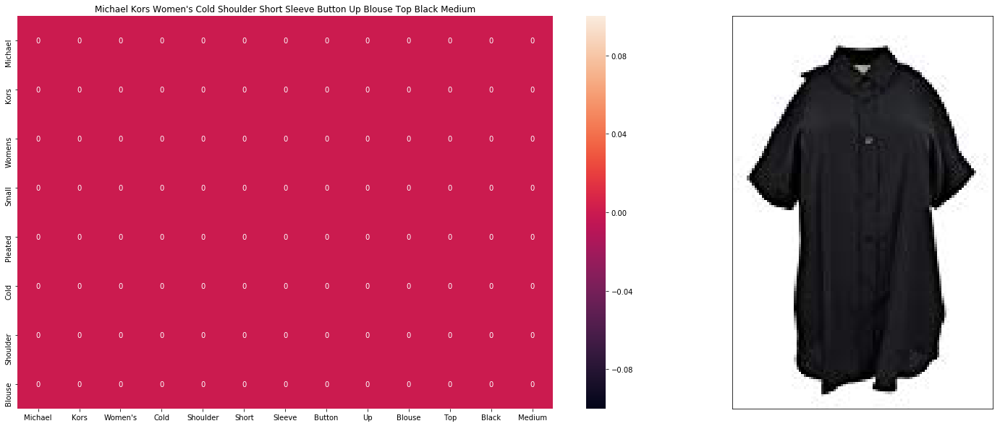

Product Title:  VIGVOG Women Casual Star Logo T-Shirt Chunky Tops
Euclidean Distance from input image: 0.0
Amazon Url: www.amazon.com/dp/B00Q43SKD6


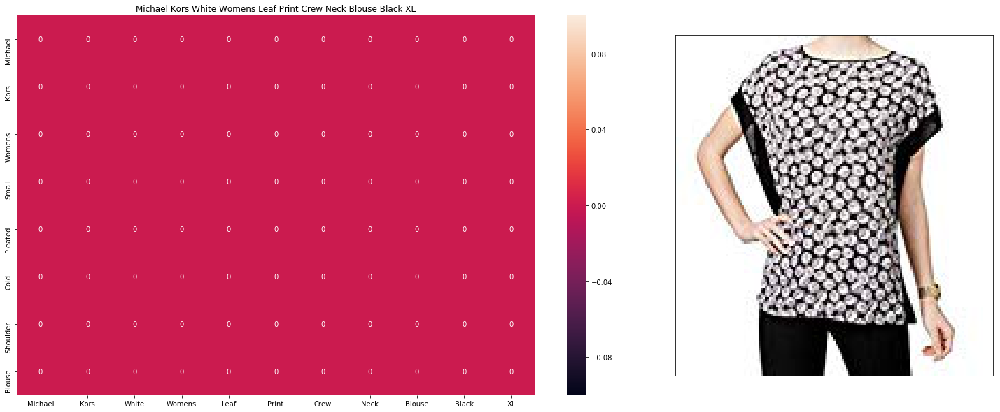

Product Title:  Krezy Case Girls Kick The Dust Up Tank Top -Xtra Large White
Euclidean Distance from input image: 0.0
Amazon Url: www.amazon.com/dp/B018ROXJGW


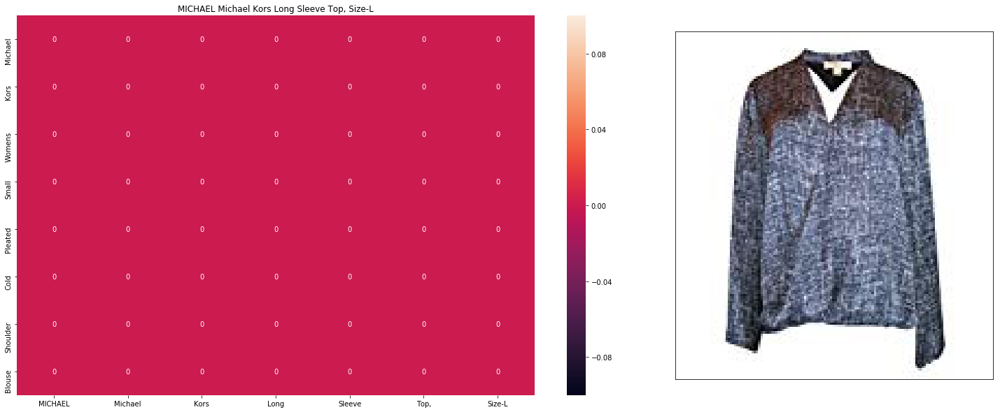

Product Title:  Style&co. Short Sleeve Scoop Neck Shirt Size M
Euclidean Distance from input image: 0.0
Amazon Url: www.amazon.com/dp/B01AS7UVPS


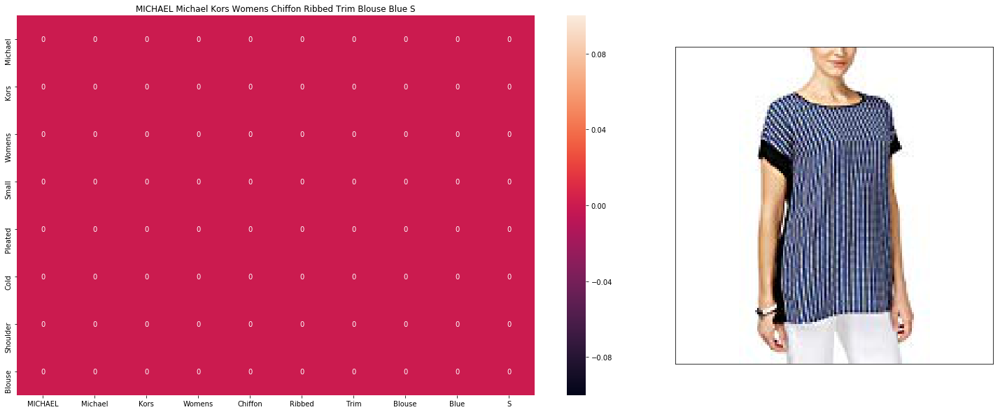

Product Title:  Scoop Neck Short Sleeve Dolman Top - Navy Blue Camo
Euclidean Distance from input image: 0.0
Amazon Url: www.amazon.com/dp/B00S8JB74S


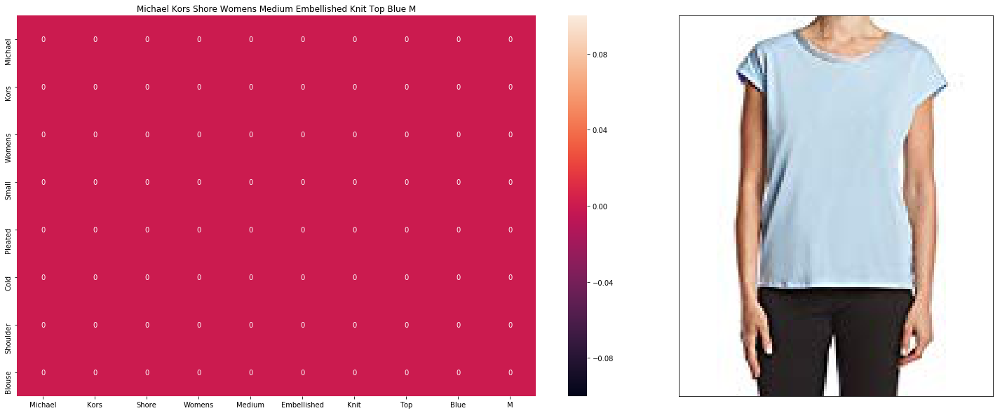

Product Title:  Van Heusen womens Long-Sleeve Yarn-Dyed Gingham Check(v0226)-ASH-XL
Euclidean Distance from input image: 0.0
Amazon Url: www.amazon.com/dp/B01BTVW83A


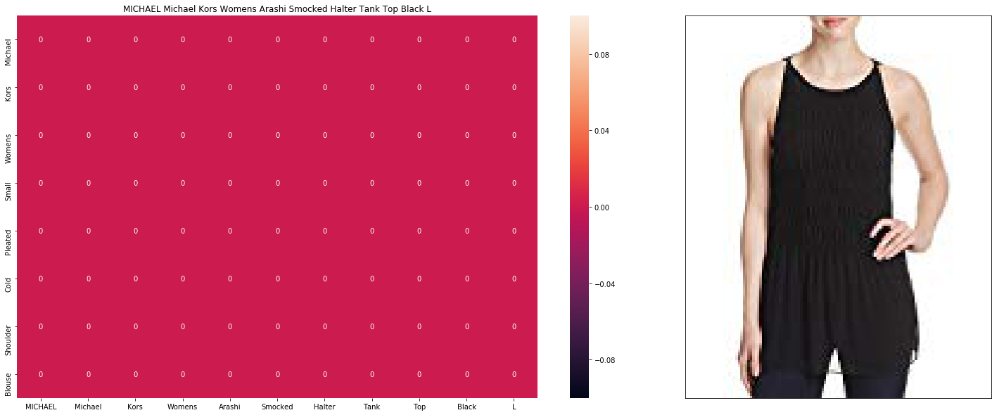

Product Title:  Women's Diesel Black Patterned Sleeveless Blouse
Euclidean Distance from input image: 0.0
Amazon Url: www.amazon.com/dp/B00UM8N8X6


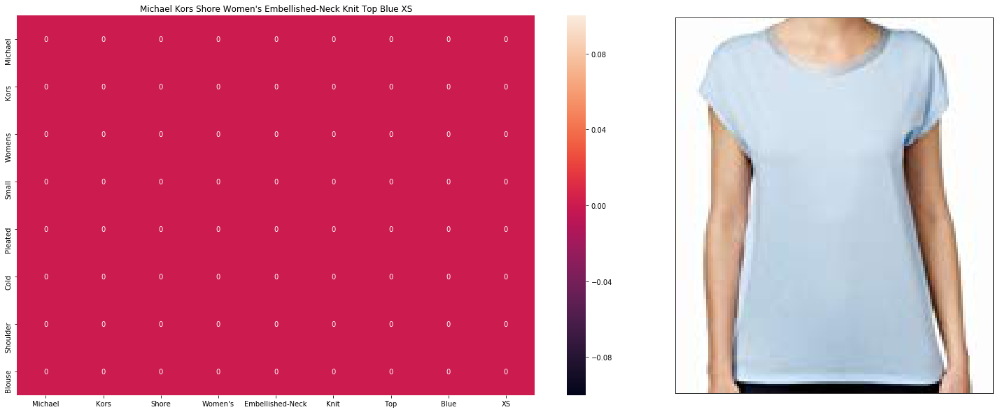

Product Title:  C6 Corvette Embroidered Ladies Performance Polo Shirt Ceramic Blue - Black Lettering - Medium
Euclidean Distance from input image: 0.0
Amazon Url: www.amazon.com/dp/B00UNS8VU0


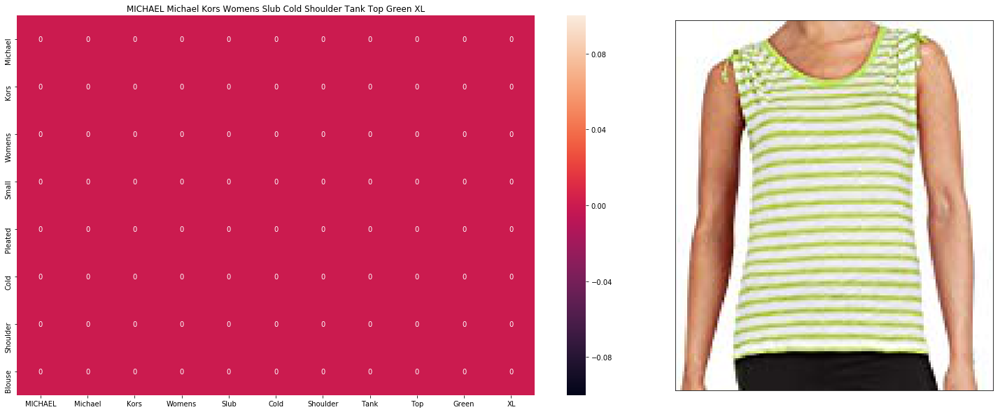

Product Title:  Women's Racer back Pug Life Vest Top S/M White
Euclidean Distance from input image: 0.0
Amazon Url: www.amazon.com/dp/B01ERYBC3I


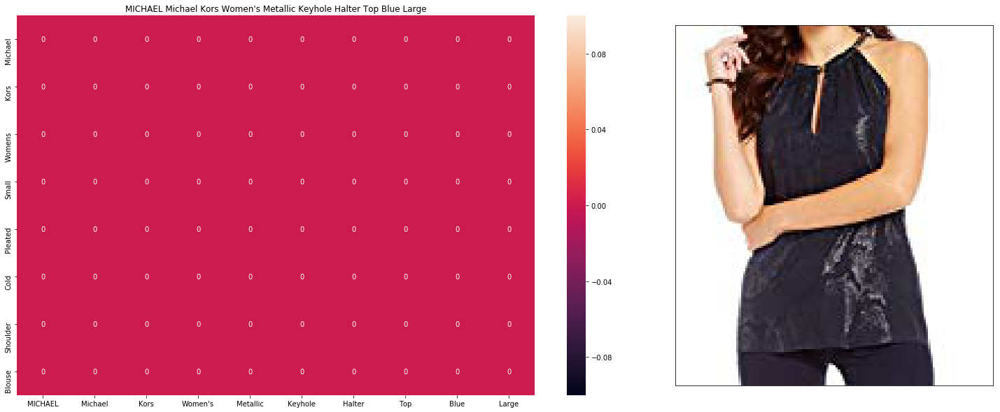

Product Title:  Kingde Digital Printing Black White Plaid Sleeveless Vest(BQN27)
Euclidean Distance from input image: 0.0
Amazon Url: www.amazon.com/dp/B015H3WIRC


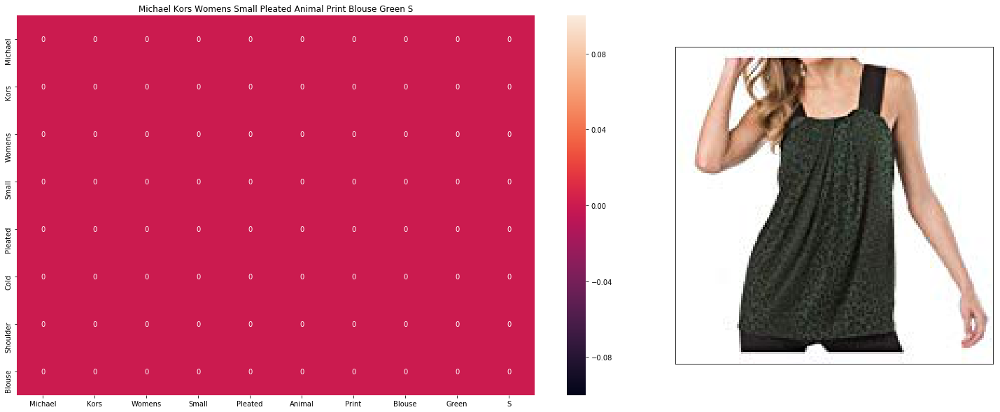

Product Title:  RJC Womens Classic Hibiscus Camp Shirt in Red - XXL
Euclidean Distance from input image: 0.0
Amazon Url: www.amazon.com/dp/B00PFACQ52


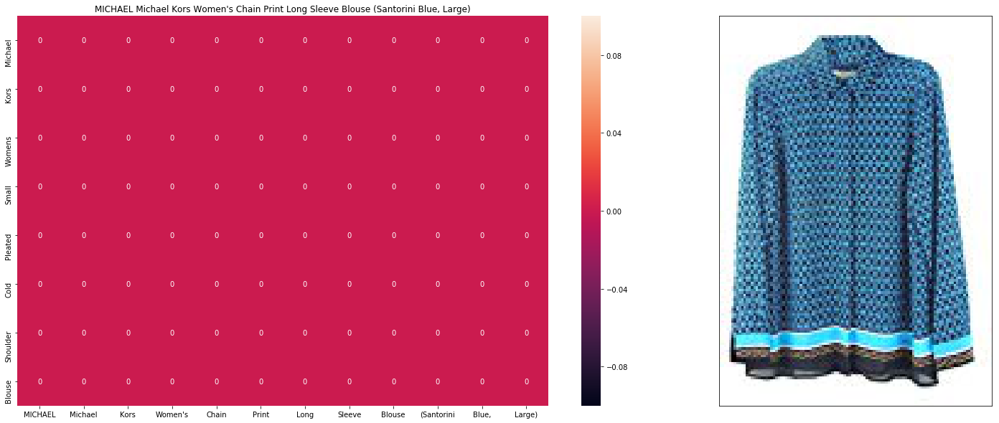

Product Title:  Fashion Crop Tops Women Casual Summer Emoji Sexy Lady Girl Shirt Hipster Tank Top
Euclidean Distance from input image: 0.0
Amazon Url: www.amazon.com/dp/B010V3B44G


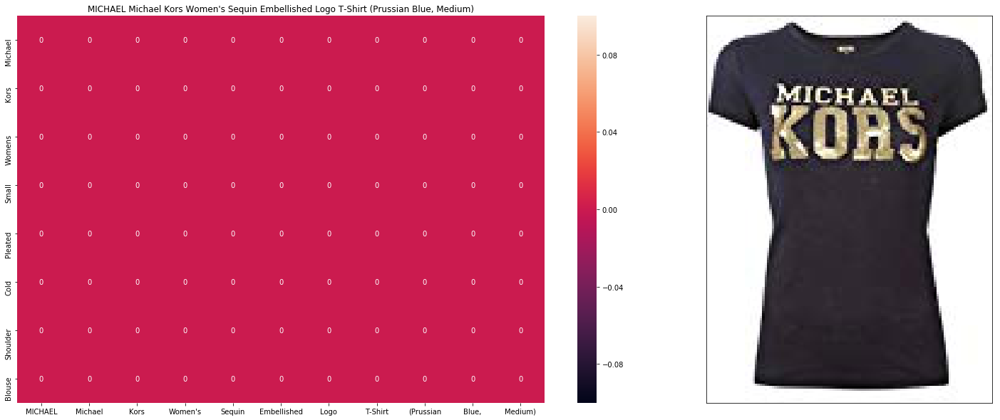

Product Title:  Women Crop Top White Emoji Short Sleeve Summer Casual Vest Crop Tops
Euclidean Distance from input image: 0.0
Amazon Url: www.amazon.com/dp/B0124E7MHS


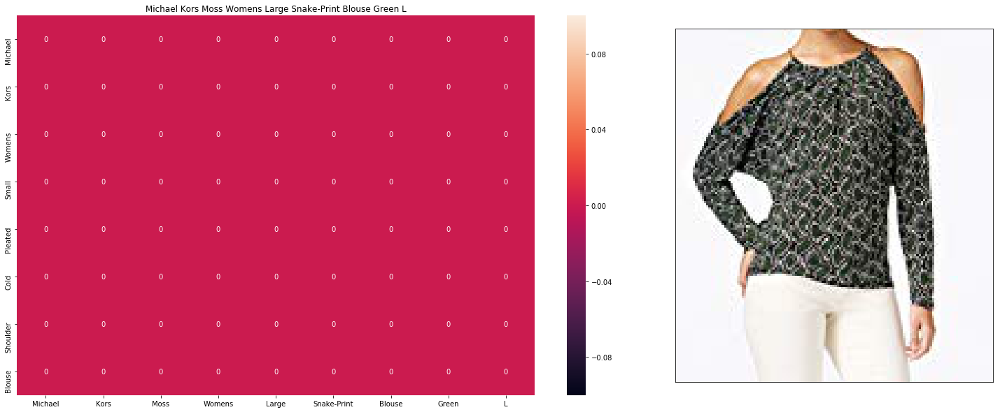

Product Title:  EnHui Womens Rowan University Casual V-Neck T-shirts XL
Euclidean Distance from input image: 0.0
Amazon Url: www.amazon.com/dp/B018U3BAXY


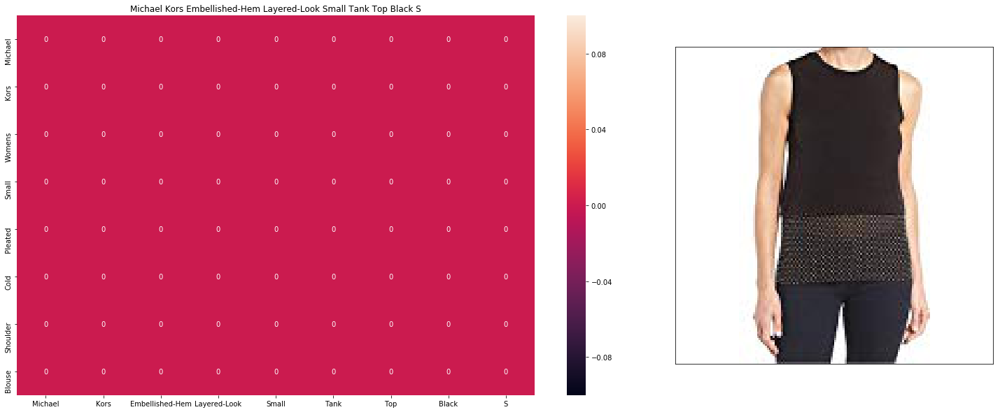

Product Title:  Denim & Supply Ralph Lauren Relaxed-Fit Flag Graphic T-Shirt - White
Euclidean Distance from input image: 0.0
Amazon Url: www.amazon.com/dp/B01E4EVRMC


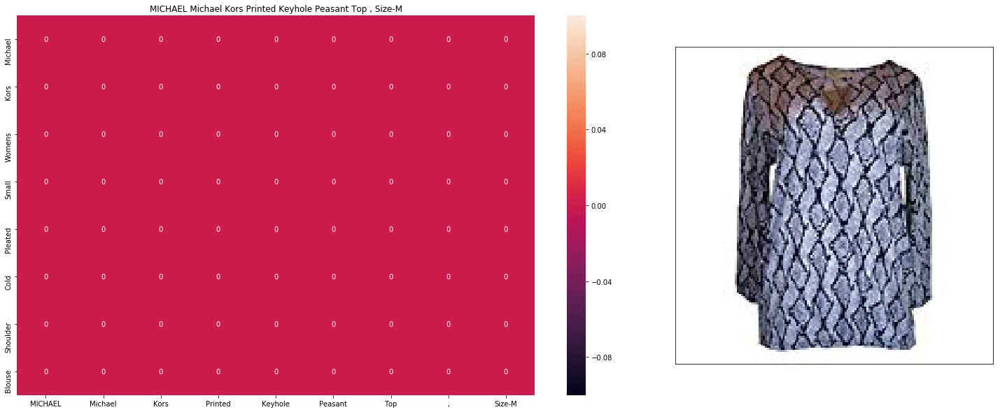

Product Title:  Officially Licensed Merchandise The Roommate Agreement Girly Tee (D.Grey), XX-Large
Euclidean Distance from input image: 0.0
Amazon Url: www.amazon.com/dp/B01BFLSV30


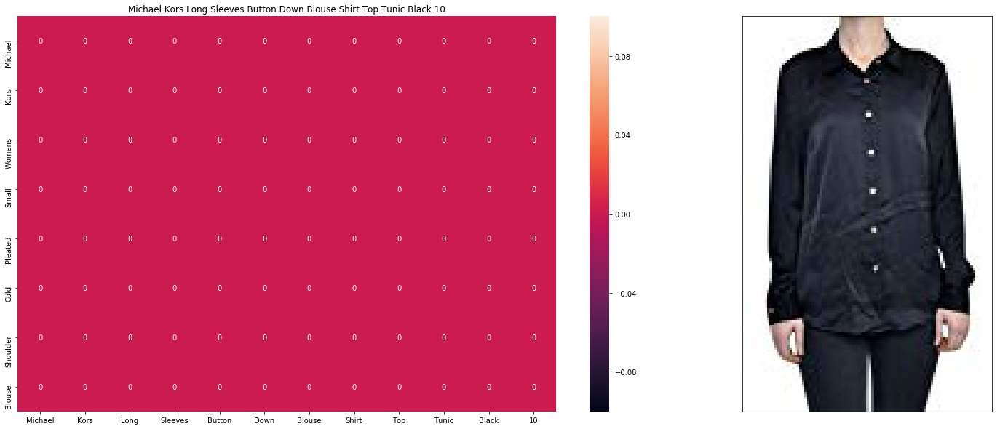

Product Title:  Anna-Kaci S/M Fit Blue Cord and Ruffle Trim Tiered Hem Drop Waist Denim Blouse
Euclidean Distance from input image: 1.0
Amazon Url: www.amazon.com/dp/B0759G15ZX


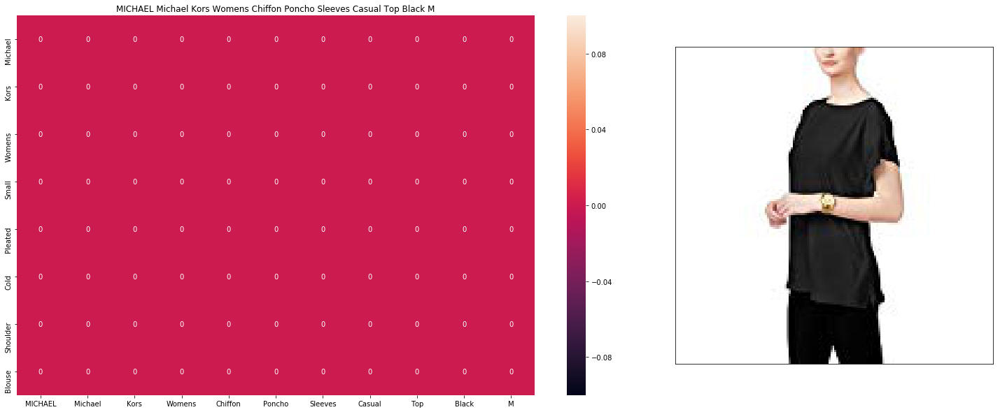

Product Title:  The Royal Standard Classic Tank Top Gray
Euclidean Distance from input image: 1.0
Amazon Url: www.amazon.com/dp/B013XA21QO


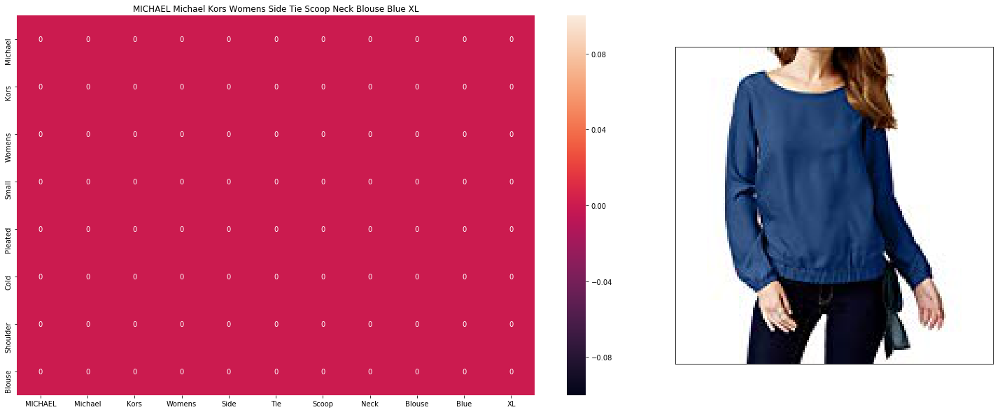

Product Title:  Anna Kaci S/M Fit Womens Boat Neck Long Sleeve Broad Keyhole Sweatshirt Black
Euclidean Distance from input image: 1.0
Amazon Url: www.amazon.com/dp/B01934R2P4


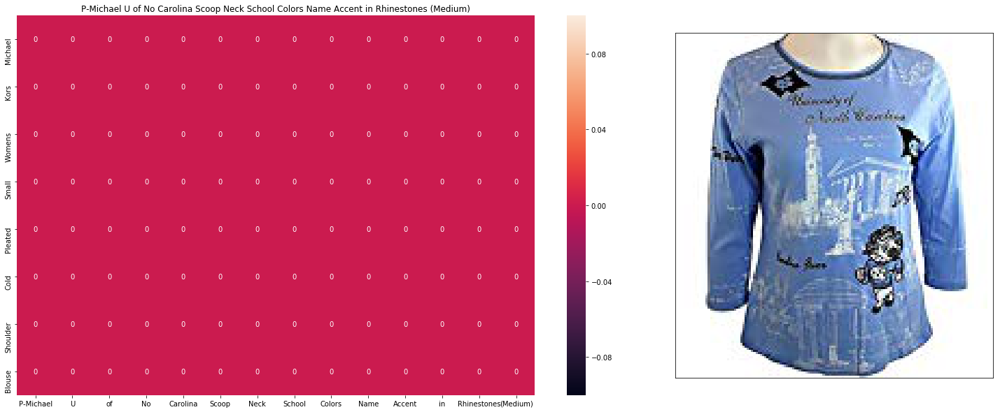

Product Title:  Pink purple Lao Laos Sleeveless Blouse V-Neckline Tops Size 34 S SL34D
Euclidean Distance from input image: 1.0
Amazon Url: www.amazon.com/dp/B074KCYKJP


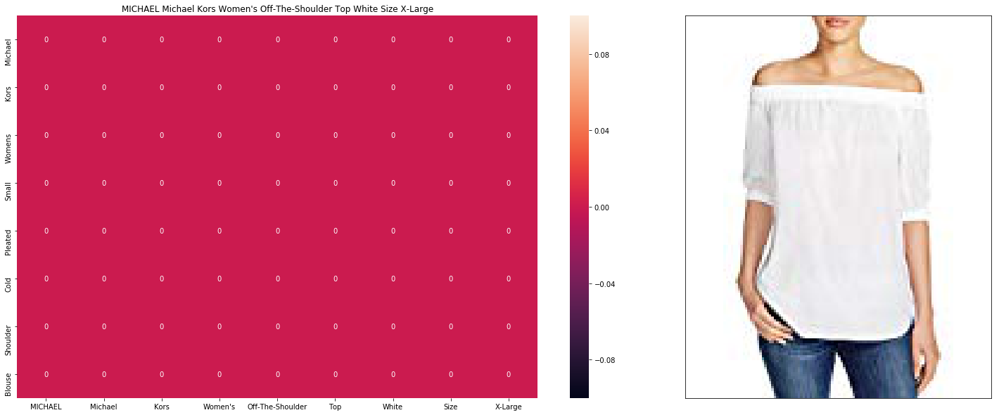

Product Title:  Womens Juniors Fashion Shawl Tunic Poncho Leopard Coral Cover up One Size Scarf Top
Euclidean Distance from input image: 1.0
Amazon Url: www.amazon.com/dp/B00L2L4EWG


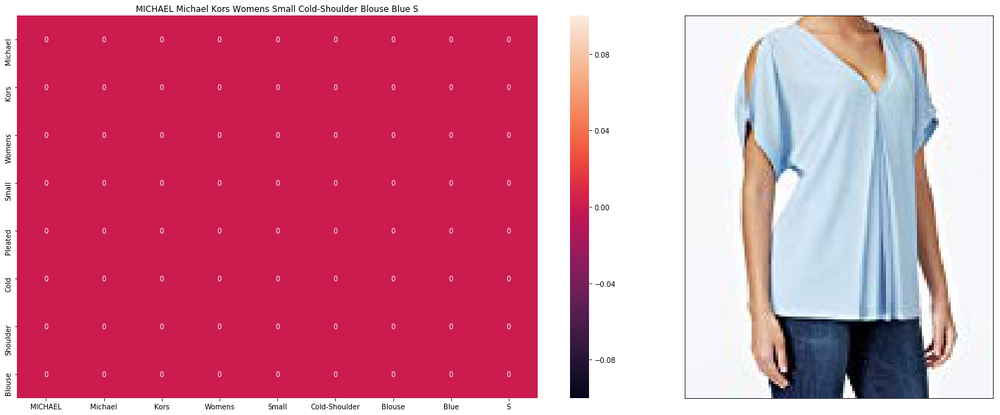

Product Title:  Grace Elements Ladies Size MED Short Sleeve Ruffle Edge Top BLACK/WHITE
Euclidean Distance from input image: 1.0
Amazon Url: www.amazon.com/dp/B01DUNI89I


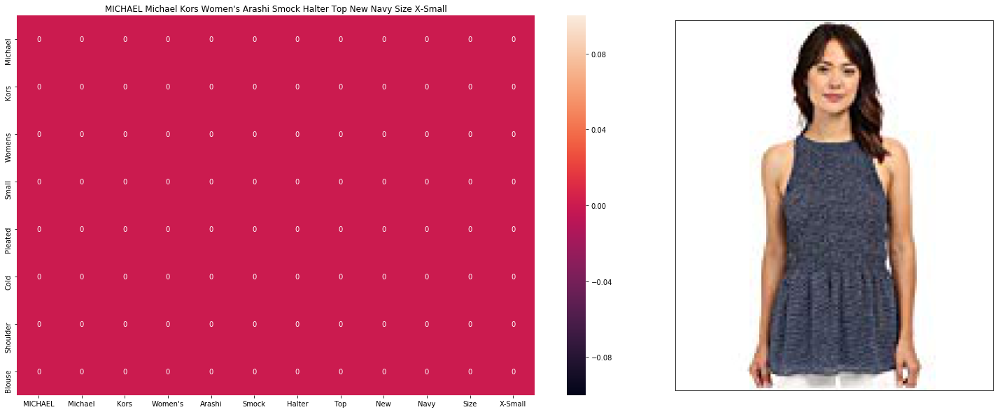

Product Title:  Gant Women's Ribbed Short Sleeve Polo Shirt X-Small Spring Green
Euclidean Distance from input image: 1.0
Amazon Url: www.amazon.com/dp/B0184RMYIG


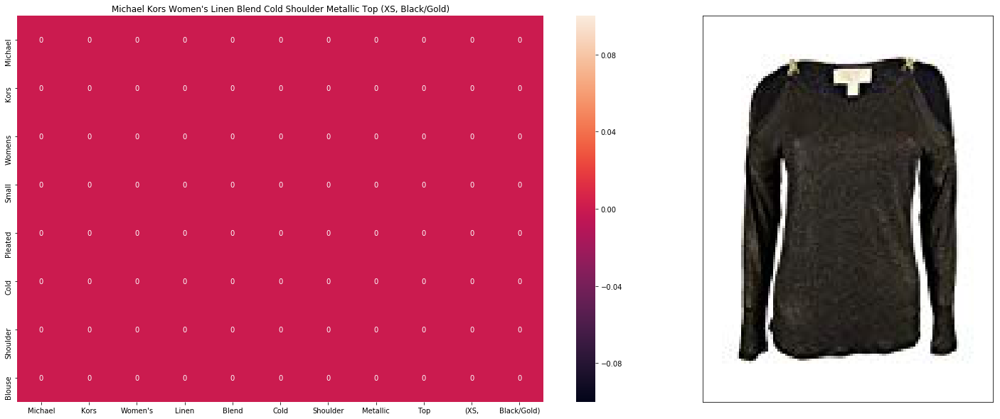

Product Title:  SLJD Women's Minnesota United FC NASL Design Tank Top Vest
Euclidean Distance from input image: 1.0
Amazon Url: www.amazon.com/dp/B01FPCYR6K


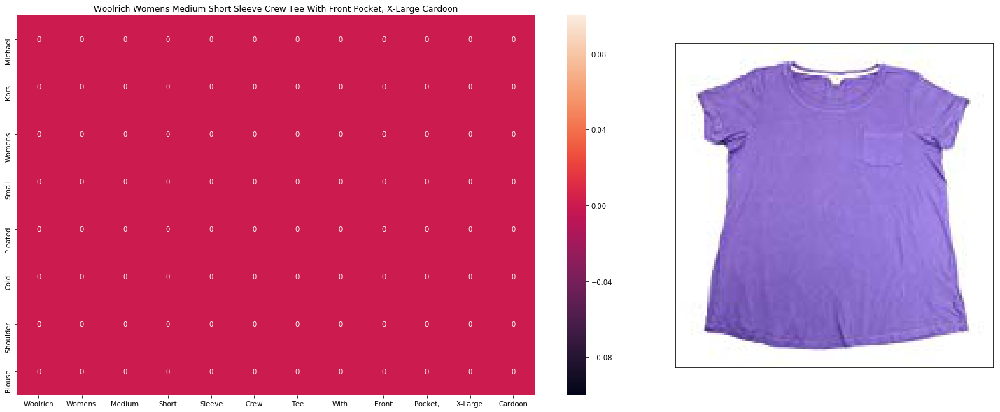

Product Title:  Kingde Slim Stretch Alien vest T-shirt Harness(BQN54)
Euclidean Distance from input image: 1.4142135623730951
Amazon Url: www.amazon.com/dp/B015H2QYKK


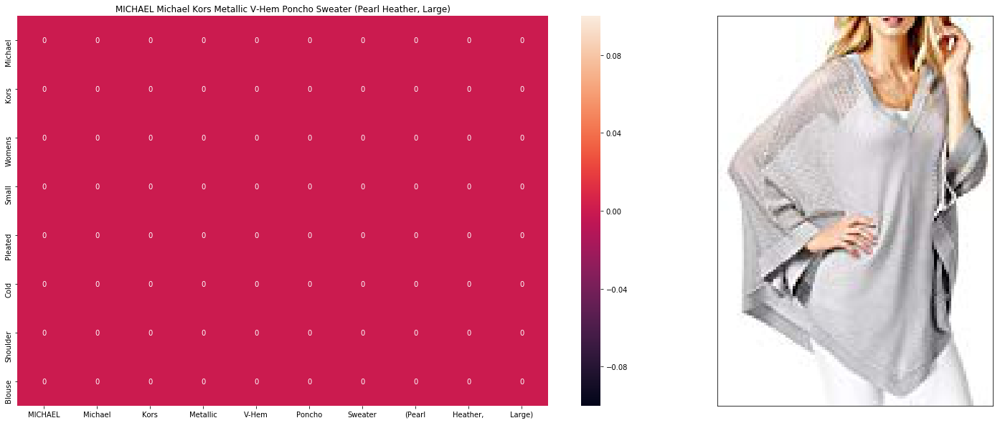

Product Title:  Flying Cross 139R5425 Women's Long Sleeve Uniform Shirt, Blue, 52L
Euclidean Distance from input image: 1.4142135623730951
Amazon Url: www.amazon.com/dp/B01JB6TGKI


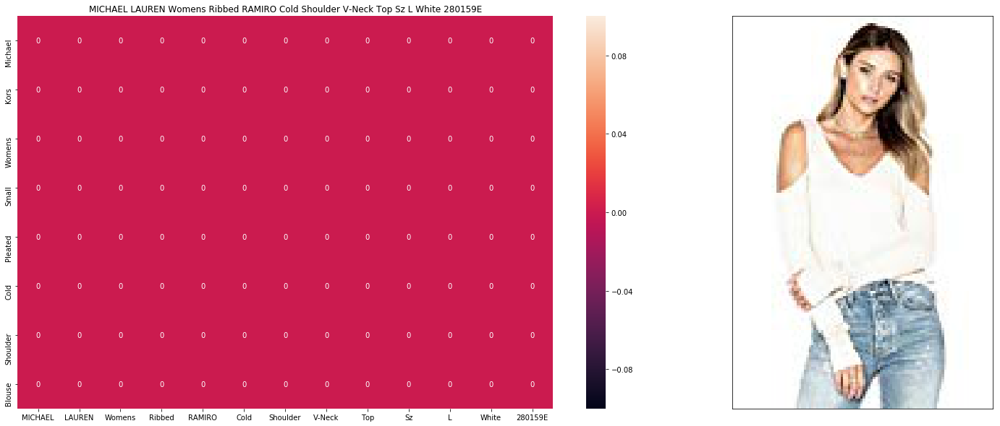

Product Title:  James Perse Rib Tank, White, 1/ Small
Euclidean Distance from input image: 1.4142135623730951
Amazon Url: www.amazon.com/dp/B0714GYNS1


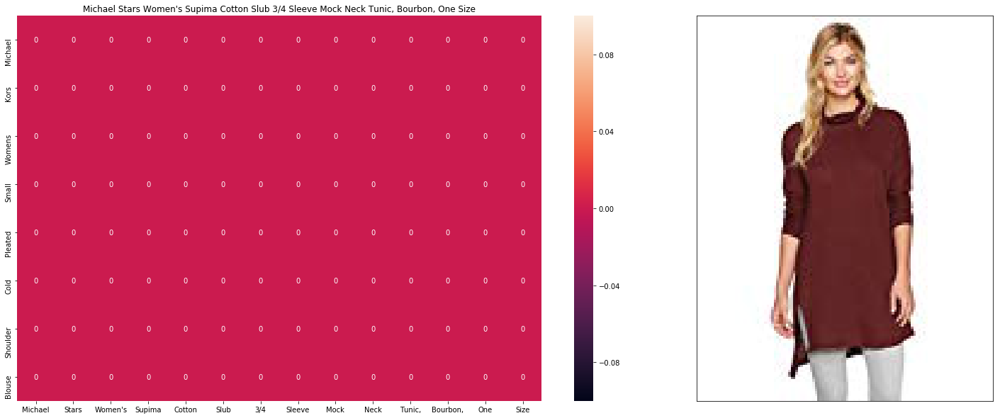

Product Title:  SPECIALWomen University Of North Texas O-Neck Shirt XL White
Euclidean Distance from input image: 1.4142135623730951
Amazon Url: www.amazon.com/dp/B01JA7SX6G


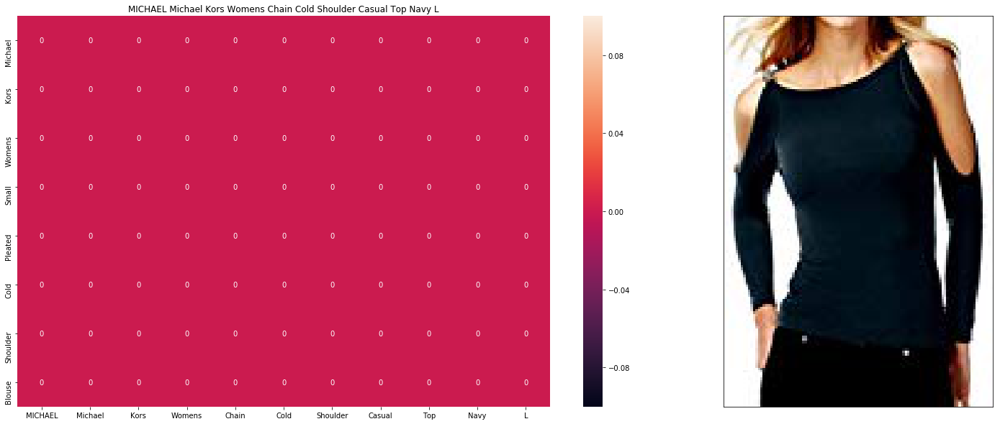

Product Title:  Purple Ruched Halter Top Cross Your Heart pinup style convertable straps (XL)
Euclidean Distance from input image: 1.4142135623730951
Amazon Url: www.amazon.com/dp/B01I4A8T3M


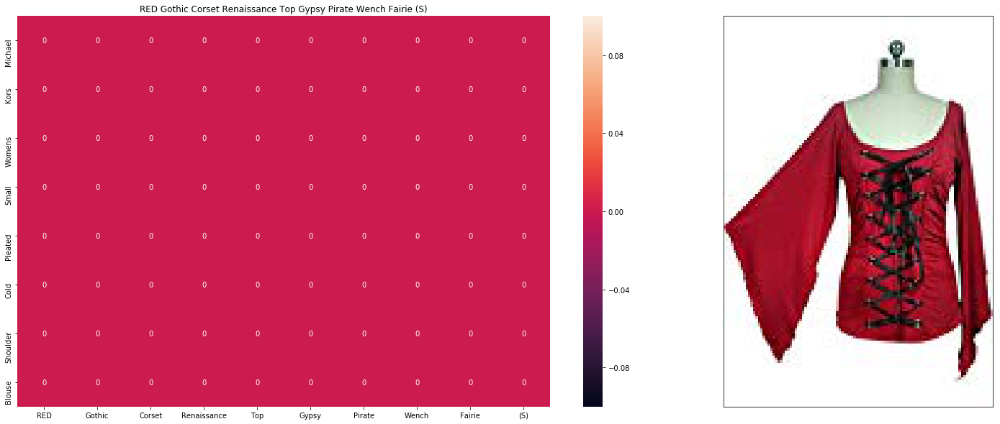

Product Title:  Realtree Camouflage WOMEN Navy "Born in the USA" Tank w/ Keyhole Backing (M)
Euclidean Distance from input image: 1.4142135623730951
Amazon Url: www.amazon.com/dp/B073VW97P6


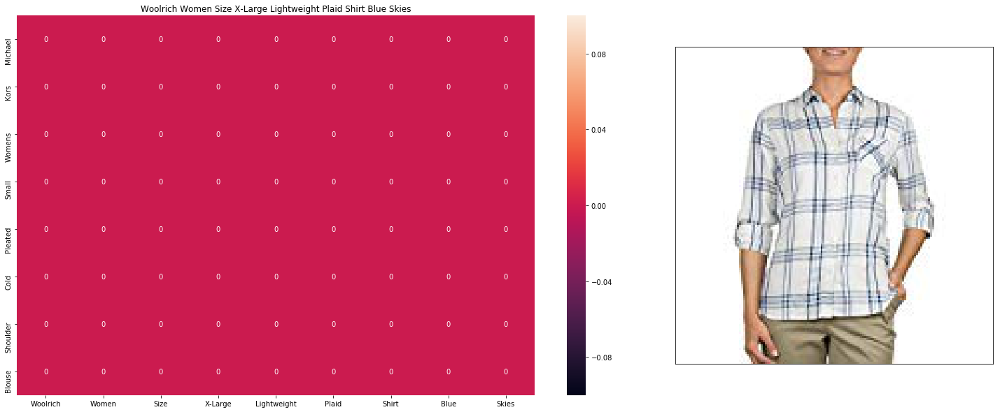

Product Title:  Women's Plus Size V-Neck Button Detail Dip Back Solid Blouse Top White XL
Euclidean Distance from input image: 1.4142135623730951
Amazon Url: www.amazon.com/dp/B01I50B44W


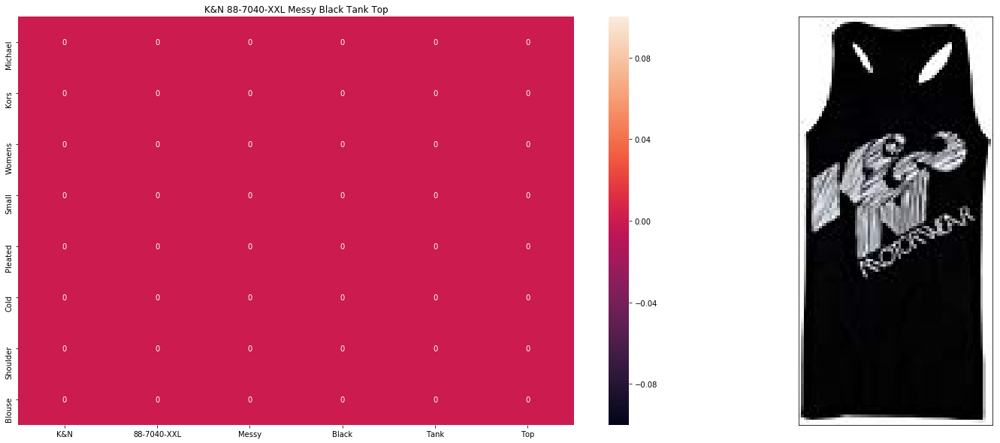

Product Title:  ZLYC Women Summer Basic Crop Top Midriff Tee Casual T Shirts for Teen Grils, Short Sleeve White, S
Euclidean Distance from input image: 1.4142135623730951
Amazon Url: www.amazon.com/dp/B00X51TRAA


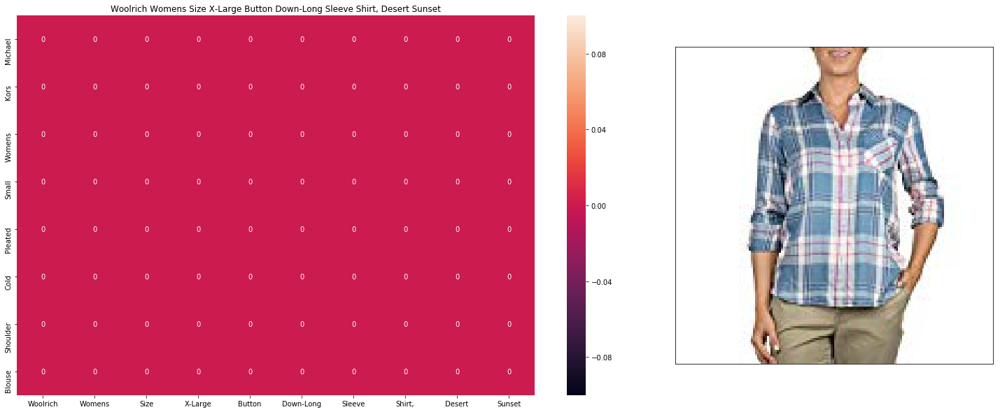

Product Title:  I'm The Crazy Nana Everyone Warned You About! T-Shirt - Can be grandma, mimi etc. (XX-Large)
Euclidean Distance from input image: 1.4142135623730951
Amazon Url: www.amazon.com/dp/B01AALZHU6


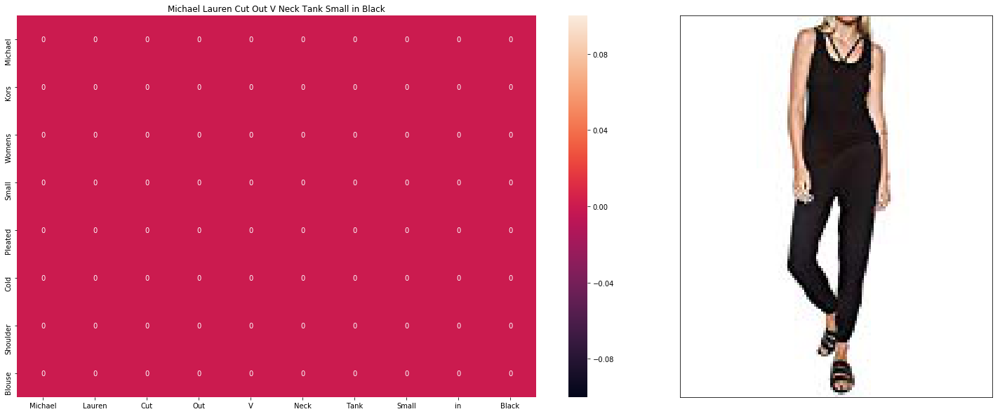

Product Title:  Who What Wear Women's Ruffled Tank Cream, X-Small, Cream
Euclidean Distance from input image: 1.4142135623730951
Amazon Url: www.amazon.com/dp/B06ZXWDS38


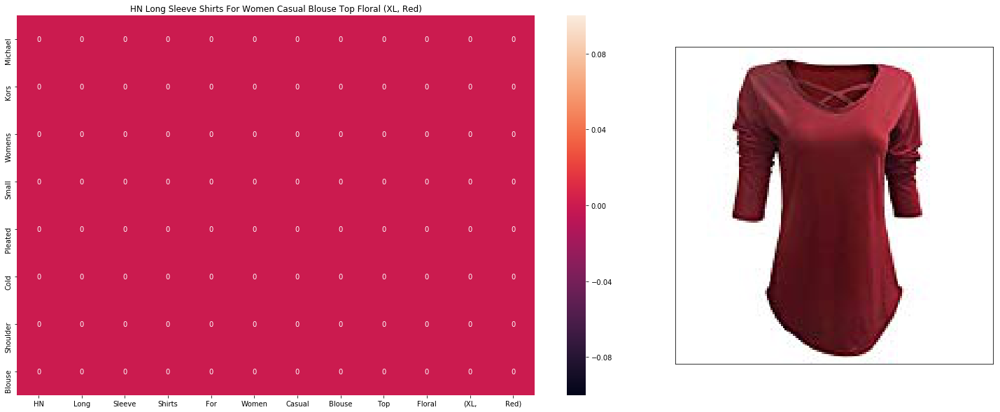

Product Title:  Samudrika Women's Sleeveless Shirt Indian Kurti Silk XL Grey Hand Embroidery
Euclidean Distance from input image: 1.4142135623730951
Amazon Url: www.amazon.com/dp/B019ETZQGU


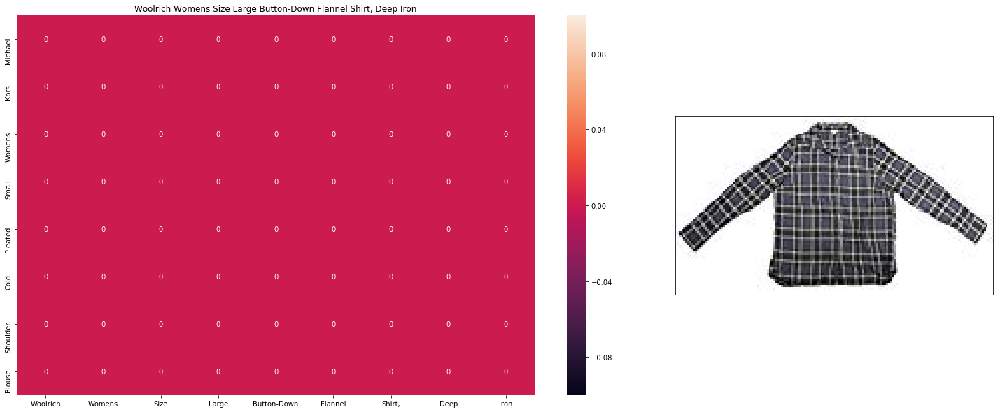

Product Title:  Women Slim Lace Carved Patchwork T-shirt Tops Tees Shirt (XL ( US  L), Grey)
Euclidean Distance from input image: 1.4142135623730951
Amazon Url: www.amazon.com/dp/B00MBARCD0


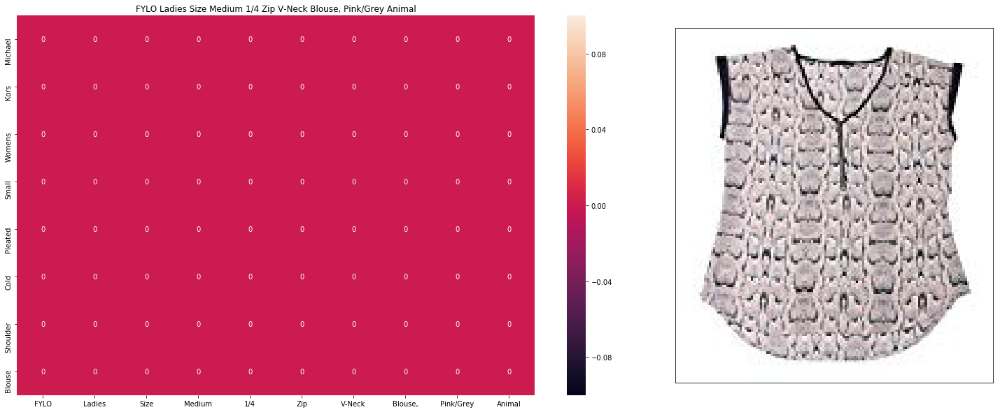

Product Title:  Womens Knit Shirt, French Blue, XL - 1 Each
Euclidean Distance from input image: 1.4142135623730951
Amazon Url: www.amazon.com/dp/B0085CB1JE


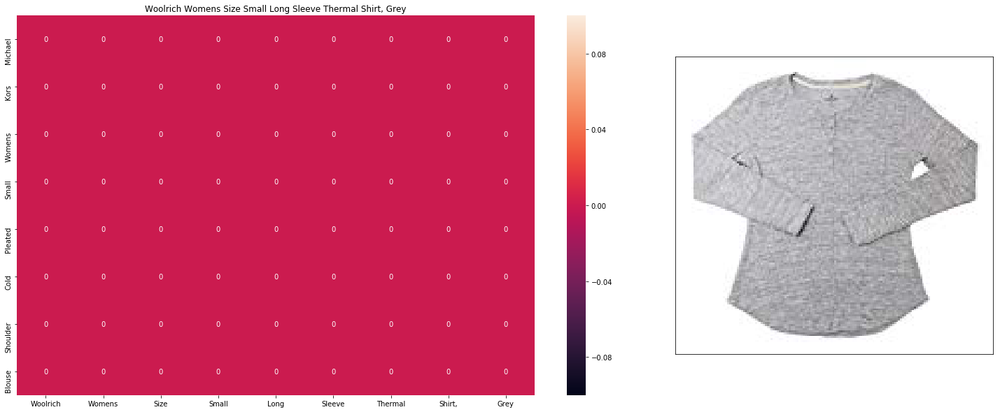

Product Title:  CHFSO For Urgent Shipping Only
Euclidean Distance from input image: 1.4142135623730951
Amazon Url: www.amazon.com/dp/B017JSX9OO


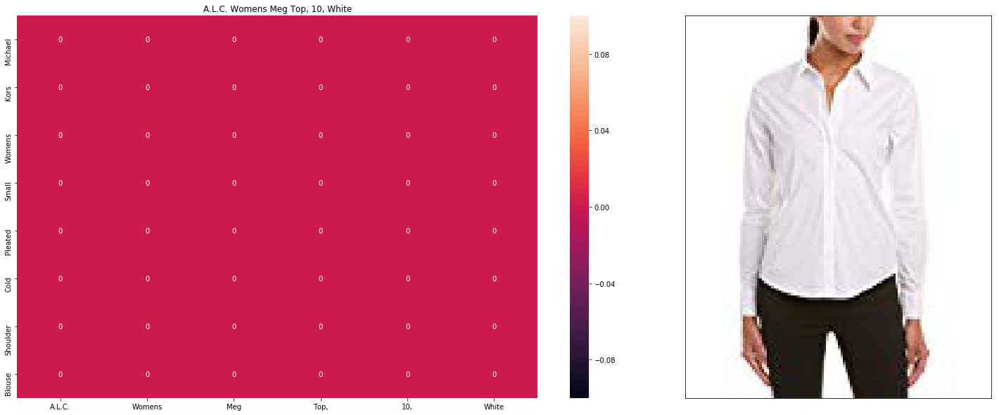

Product Title:  Adam And The Ants Prince Charming Casual Women's V Neck Tee Shirts Black
Euclidean Distance from input image: 1.4142135623730951
Amazon Url: www.amazon.com/dp/B01I37F2YK


In [63]:
get_similar_products_cnn(12566, 0, 50, 0, 0, 50)

__GIVING MORE WEIGHTS ON TITLE___

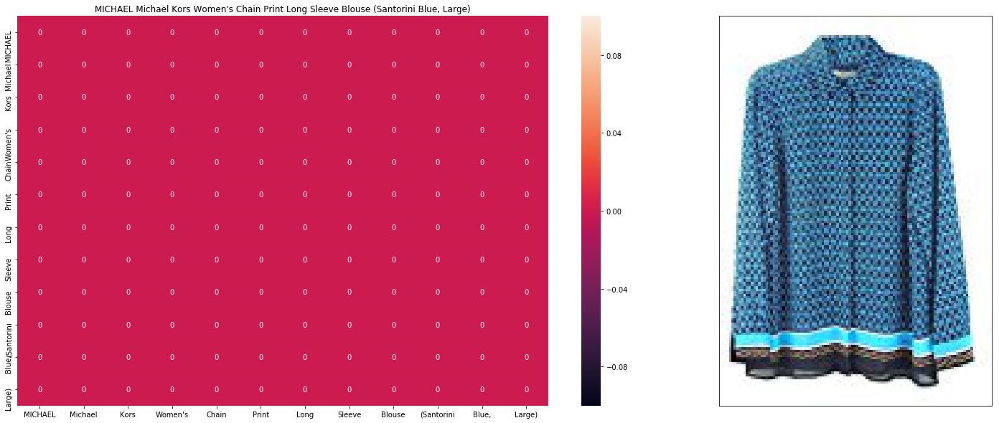

Product Title:  Fashion Crop Tops Women Casual Summer Emoji Sexy Lady Girl Shirt Hipster Tank Top
Euclidean Distance from input image: 0.001953125
Amazon Url: www.amazon.com/dp/B010V3B44G


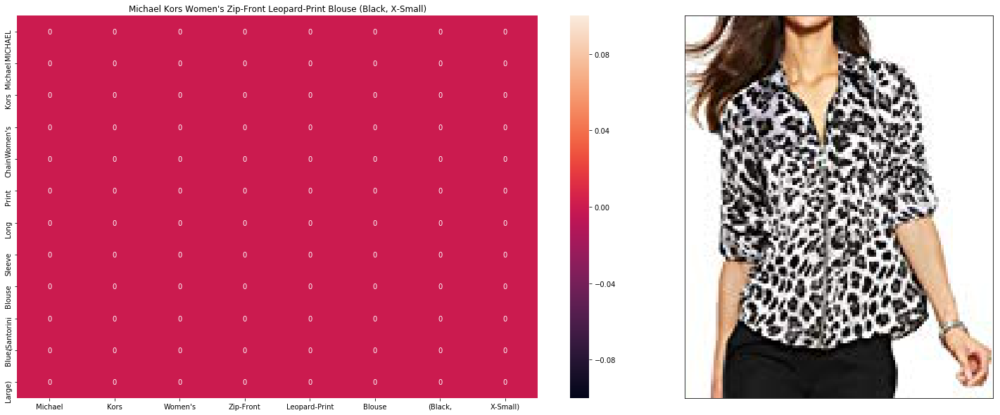

Product Title:  Cosabella Talco Scoop Camisole, Persimmon, X-Large
Euclidean Distance from input image: 2.2436709594726563
Amazon Url: www.amazon.com/dp/B013J5U2QY


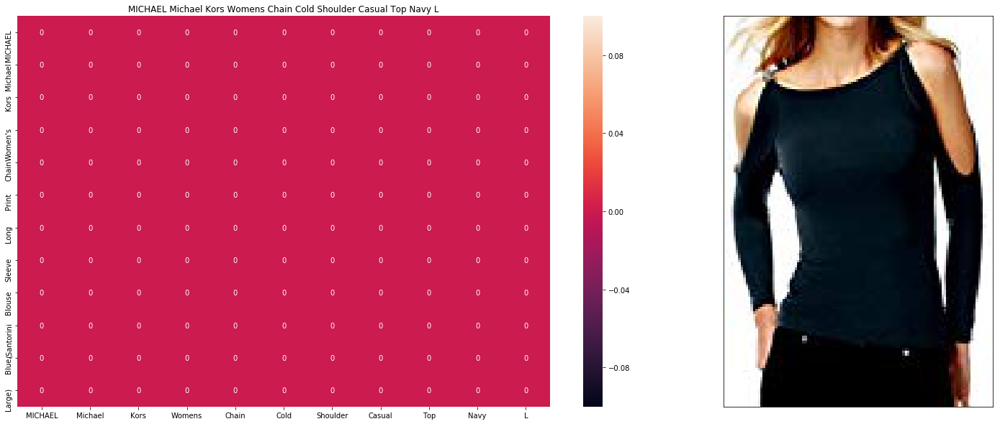

Product Title:  Purple Ruched Halter Top Cross Your Heart pinup style convertable straps (XL)
Euclidean Distance from input image: 2.387225799560547
Amazon Url: www.amazon.com/dp/B01I4A8T3M


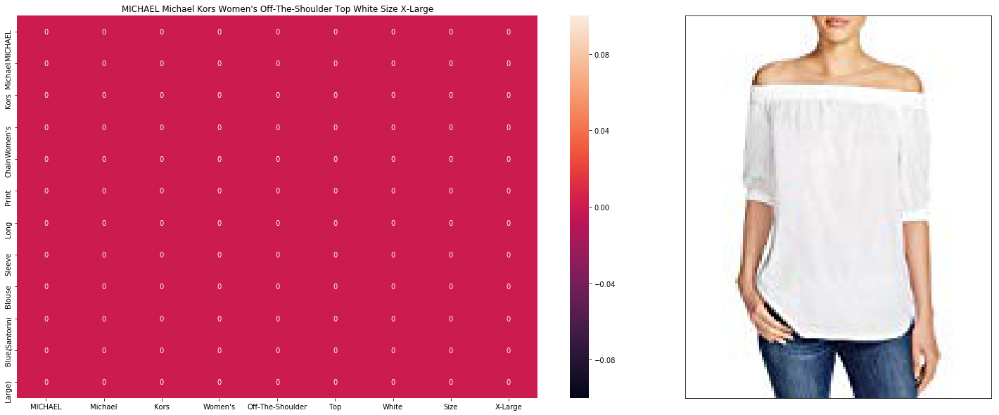

Product Title:  Womens Juniors Fashion Shawl Tunic Poncho Leopard Coral Cover up One Size Scarf Top
Euclidean Distance from input image: 2.4631878662109377
Amazon Url: www.amazon.com/dp/B00L2L4EWG


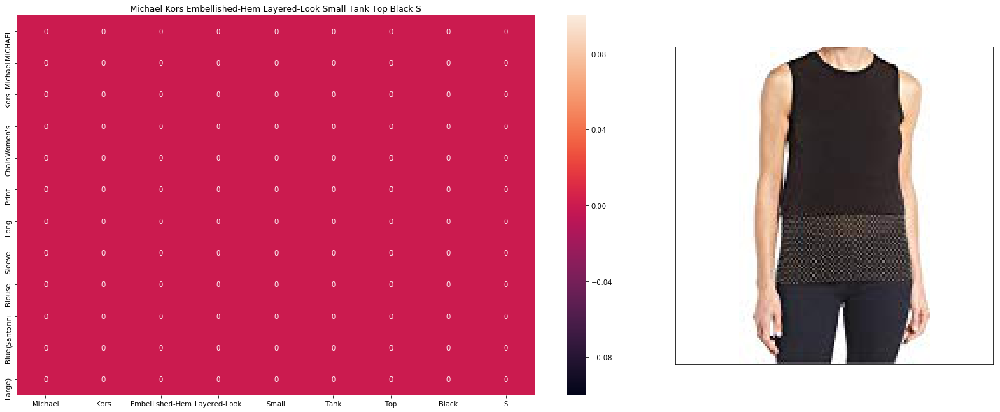

Product Title:  Denim & Supply Ralph Lauren Relaxed-Fit Flag Graphic T-Shirt - White
Euclidean Distance from input image: 2.5073258972167967
Amazon Url: www.amazon.com/dp/B01E4EVRMC


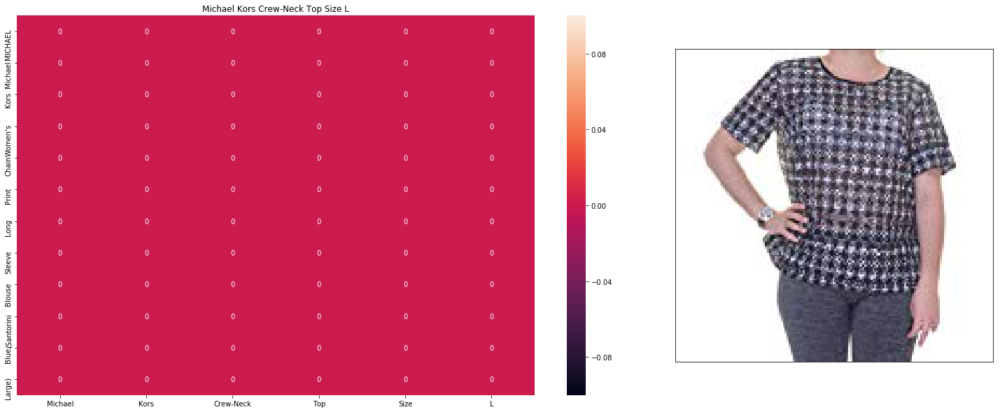

Product Title:  Cecilia Pink Women's Wrap Front Bralette (L)
Euclidean Distance from input image: 2.521584320068359
Amazon Url: www.amazon.com/dp/B01G6RHWJ2


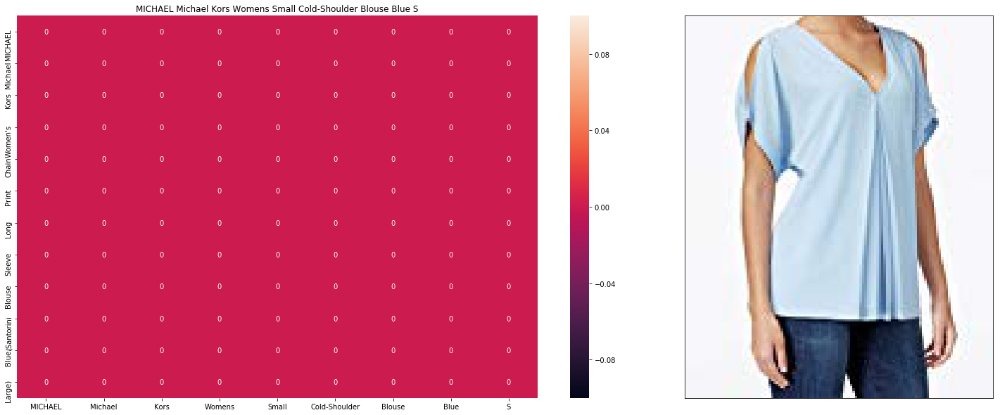

Product Title:  Grace Elements Ladies Size MED Short Sleeve Ruffle Edge Top BLACK/WHITE
Euclidean Distance from input image: 2.6333502197265624
Amazon Url: www.amazon.com/dp/B01DUNI89I


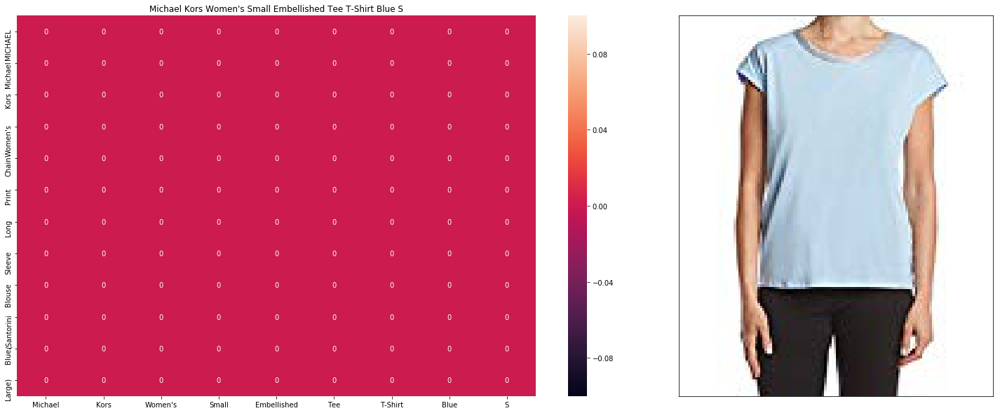

Product Title:  European Painting Colorful Loose Short T-shirt Bky12-store2-021
Euclidean Distance from input image: 2.773514404296875
Amazon Url: www.amazon.com/dp/B012B6ABTA


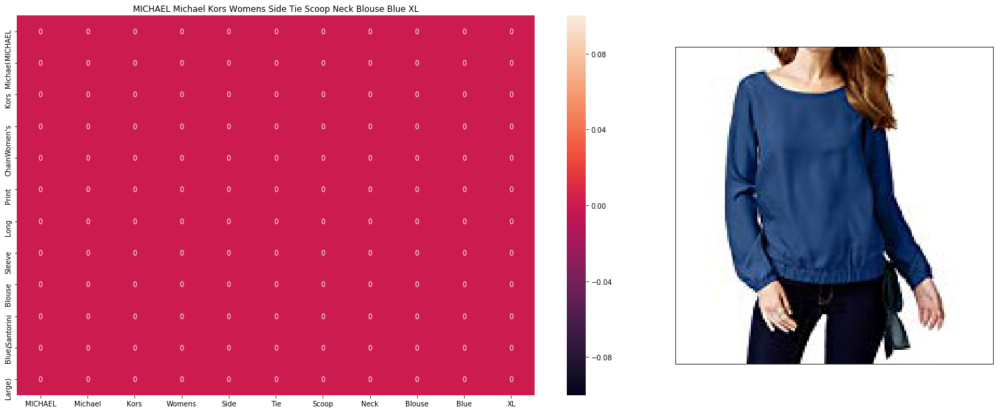

Product Title:  Anna Kaci S/M Fit Womens Boat Neck Long Sleeve Broad Keyhole Sweatshirt Black
Euclidean Distance from input image: 2.787518310546875
Amazon Url: www.amazon.com/dp/B01934R2P4


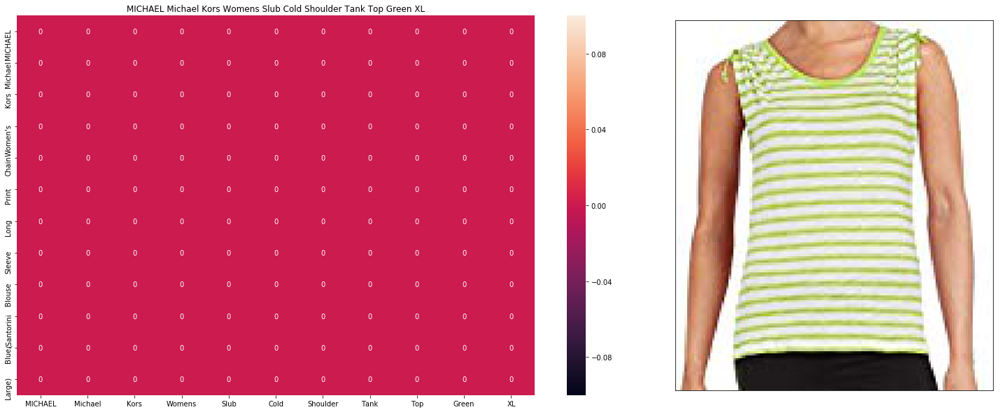

Product Title:  Women's Racer back Pug Life Vest Top S/M White
Euclidean Distance from input image: 2.795596923828125
Amazon Url: www.amazon.com/dp/B01ERYBC3I


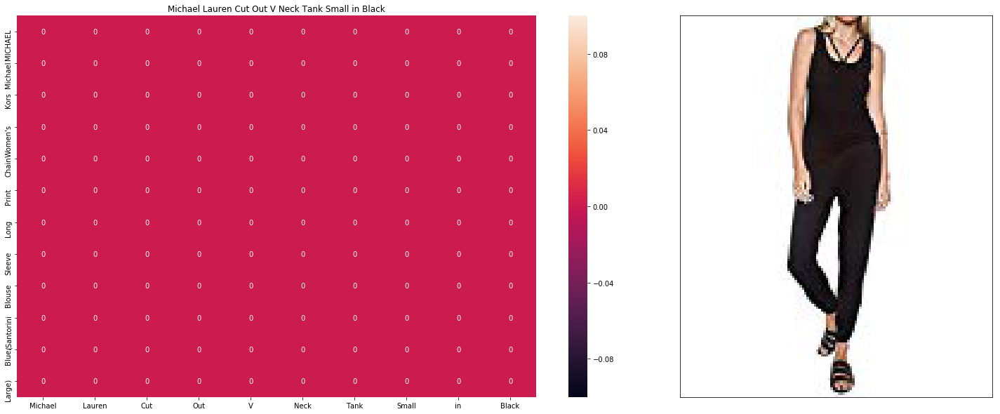

Product Title:  Who What Wear Women's Ruffled Tank Cream, X-Small, Cream
Euclidean Distance from input image: 2.91319580078125
Amazon Url: www.amazon.com/dp/B06ZXWDS38


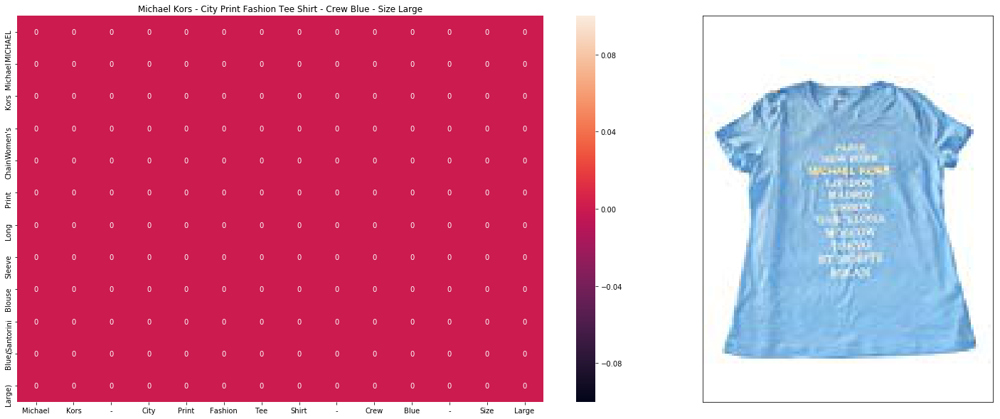

Product Title:  Nygard Women's Petite Slims Beaded tunic Pink Multi
Euclidean Distance from input image: 2.93188232421875
Amazon Url: www.amazon.com/dp/B00TQSRDPM


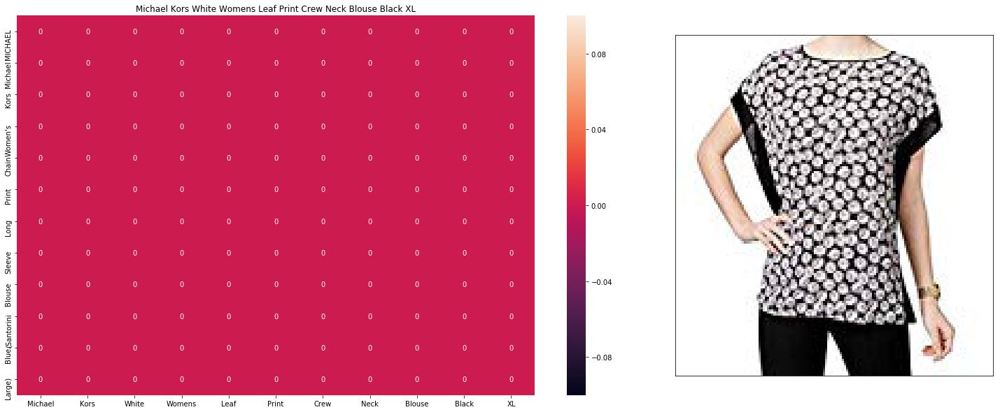

Product Title:  Krezy Case Girls Kick The Dust Up Tank Top -Xtra Large White
Euclidean Distance from input image: 2.9446145629882814
Amazon Url: www.amazon.com/dp/B018ROXJGW


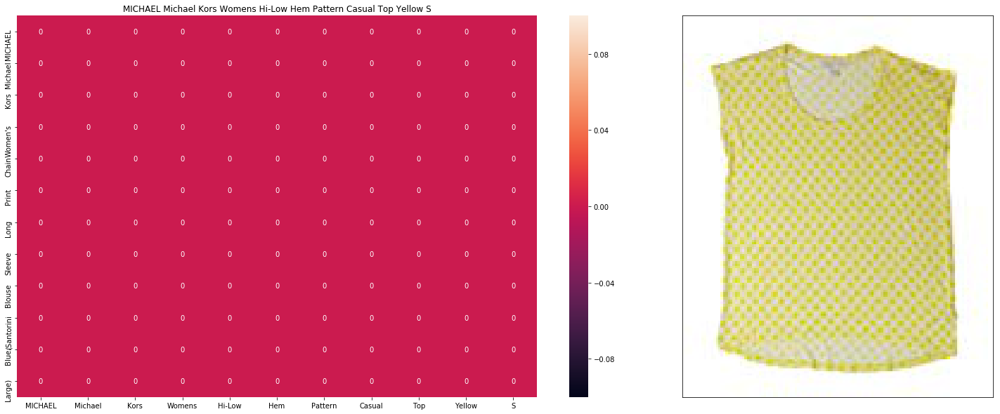

Product Title:  C&C California Women's Striped Shark Bite Tank Top in City Blue, Size Small
Euclidean Distance from input image: 3.0088531494140627
Amazon Url: www.amazon.com/dp/B018RH41D4


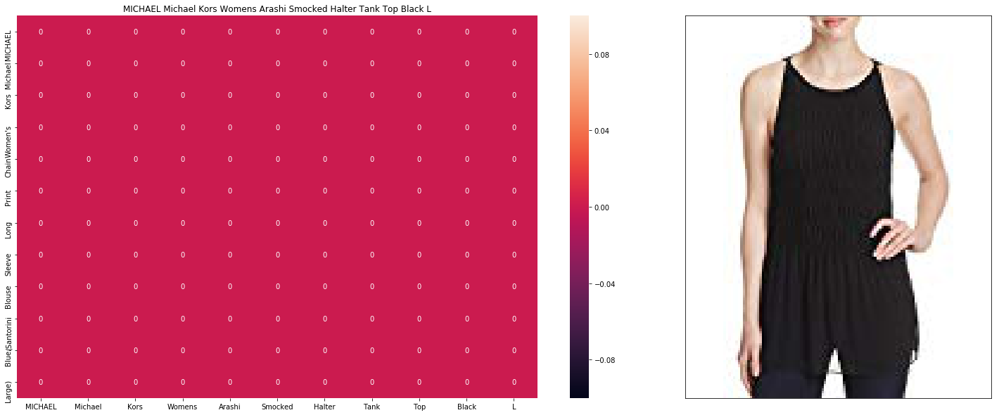

Product Title:  Women's Diesel Black Patterned Sleeveless Blouse
Euclidean Distance from input image: 3.020924377441406
Amazon Url: www.amazon.com/dp/B00UM8N8X6


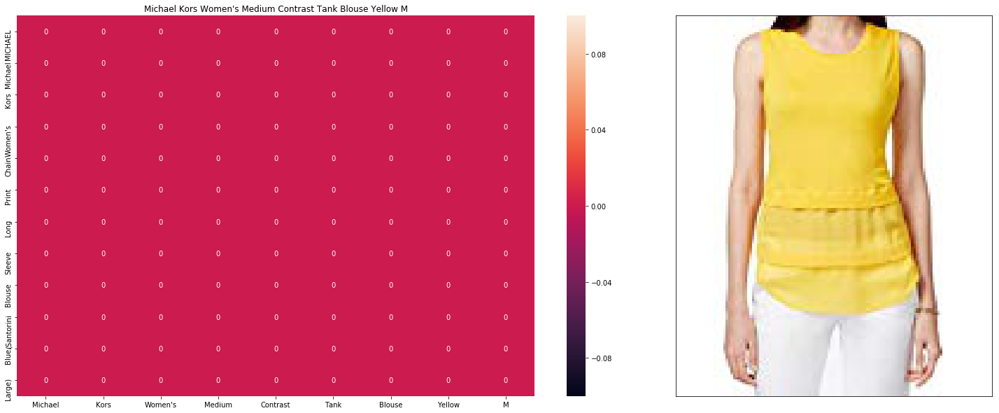

Product Title:  Charter Club Women's Plus Short Sleeve Pima Cotton Boat Neck Shirt (0x, Strawberry Ice)
Euclidean Distance from input image: 3.1081948852539063
Amazon Url: www.amazon.com/dp/B01CUZIDK6


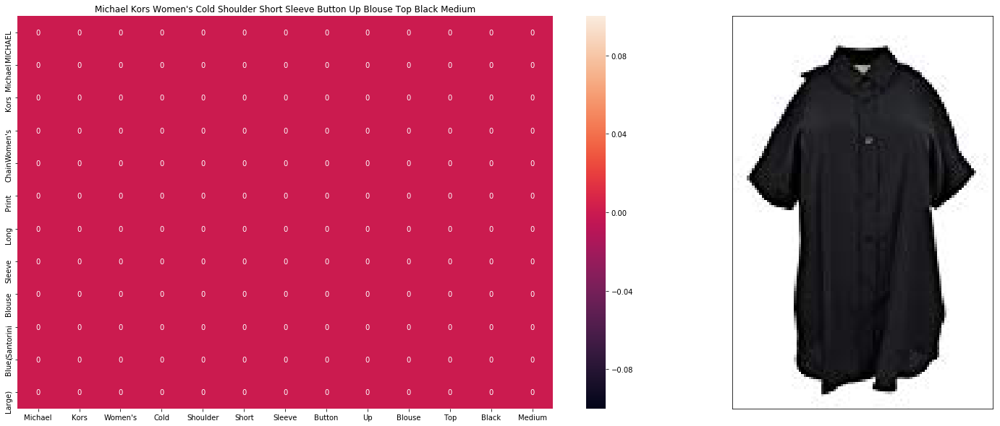

Product Title:  VIGVOG Women Casual Star Logo T-Shirt Chunky Tops
Euclidean Distance from input image: 3.1141842651367186
Amazon Url: www.amazon.com/dp/B00Q43SKD6


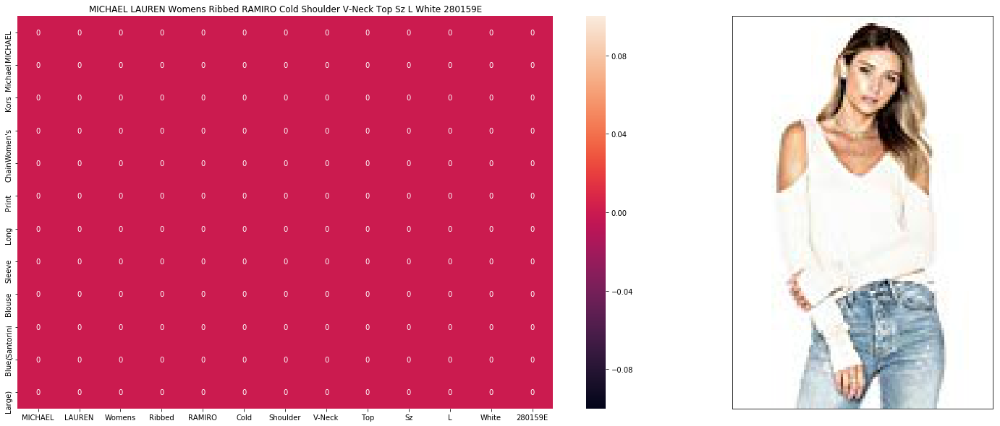

Product Title:  James Perse Rib Tank, White, 1/ Small
Euclidean Distance from input image: 3.123926086425781
Amazon Url: www.amazon.com/dp/B0714GYNS1


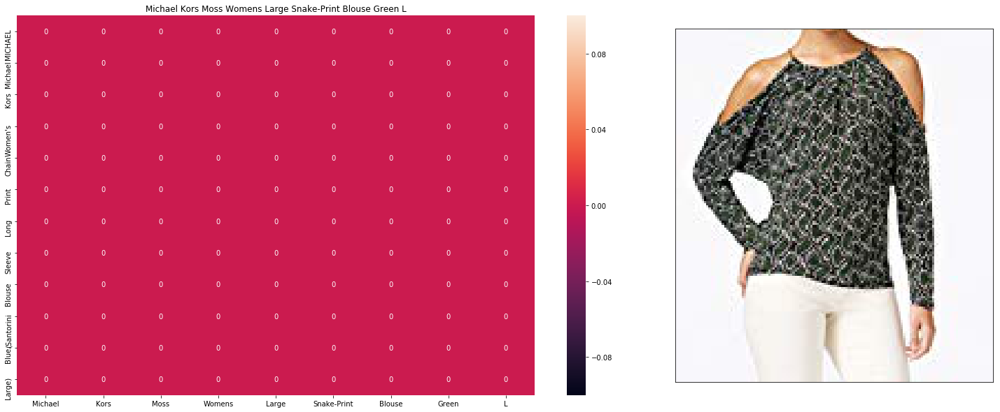

Product Title:  EnHui Womens Rowan University Casual V-Neck T-shirts XL
Euclidean Distance from input image: 3.128501281738281
Amazon Url: www.amazon.com/dp/B018U3BAXY


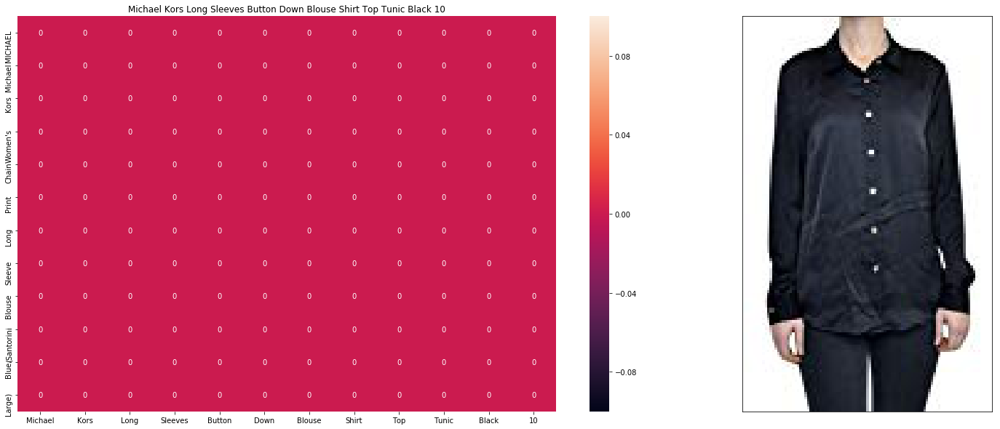

Product Title:  Anna-Kaci S/M Fit Blue Cord and Ruffle Trim Tiered Hem Drop Waist Denim Blouse
Euclidean Distance from input image: 3.192945556640625
Amazon Url: www.amazon.com/dp/B0759G15ZX


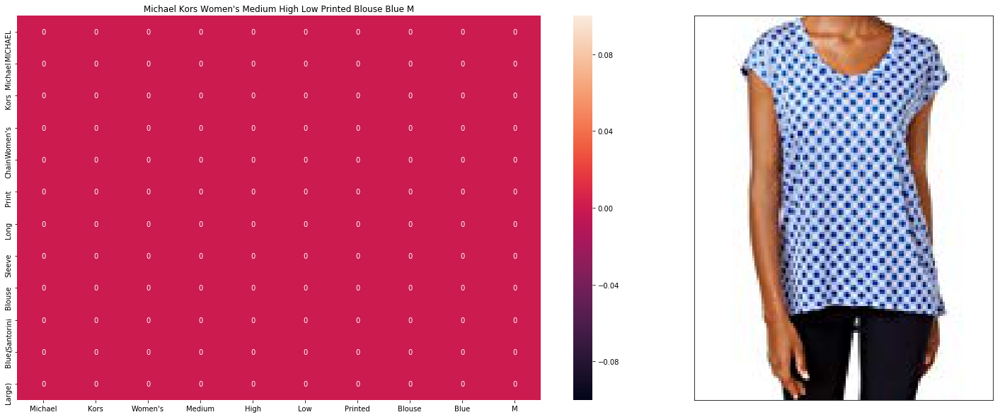

Product Title:  Next Level Apparel Women's Soft Deep V-Neck T-Shirt, Vintage Dark Black, Medium
Euclidean Distance from input image: 3.1994760131835935
Amazon Url: www.amazon.com/dp/B00MPWB6LS


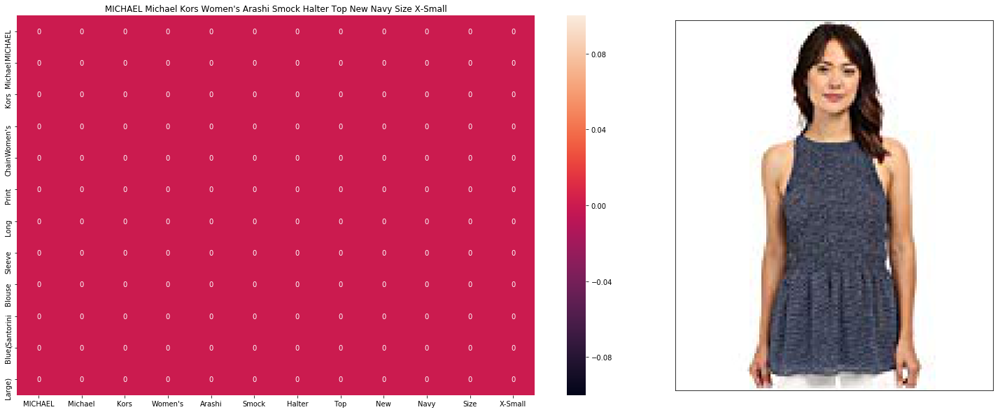

Product Title:  Gant Women's Ribbed Short Sleeve Polo Shirt X-Small Spring Green
Euclidean Distance from input image: 3.2775604248046877
Amazon Url: www.amazon.com/dp/B0184RMYIG


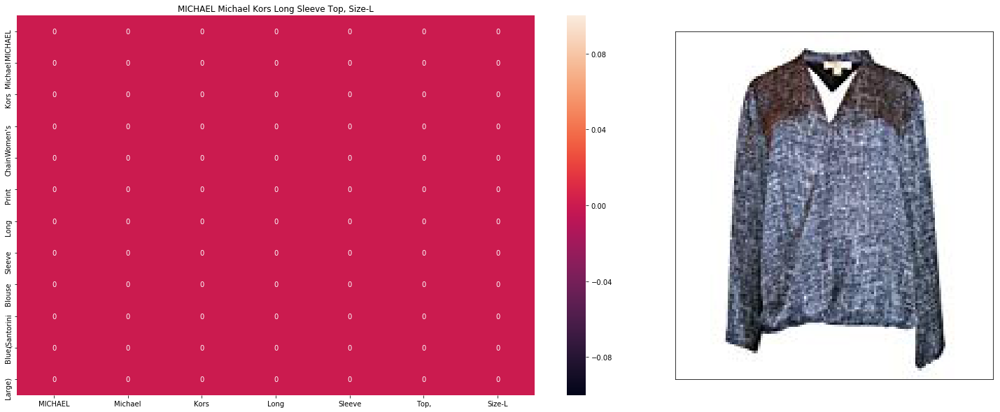

Product Title:  Style&co. Short Sleeve Scoop Neck Shirt Size M
Euclidean Distance from input image: 3.2932733154296874
Amazon Url: www.amazon.com/dp/B01AS7UVPS


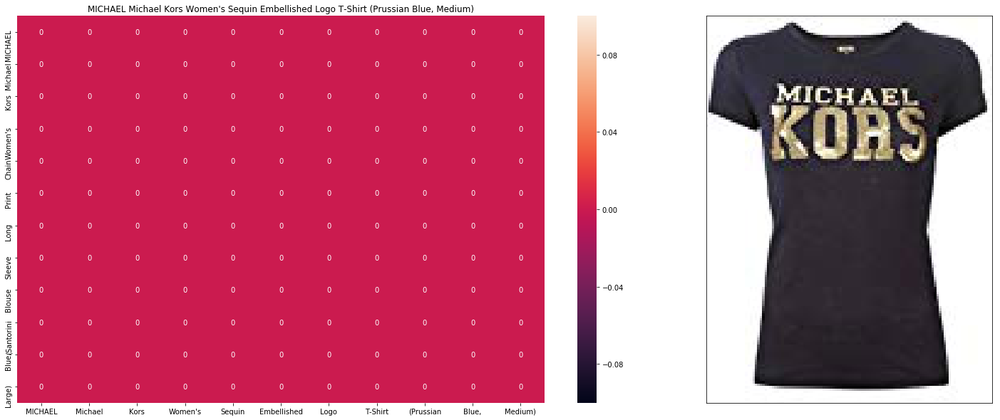

Product Title:  Women Crop Top White Emoji Short Sleeve Summer Casual Vest Crop Tops
Euclidean Distance from input image: 3.2935470581054687
Amazon Url: www.amazon.com/dp/B0124E7MHS


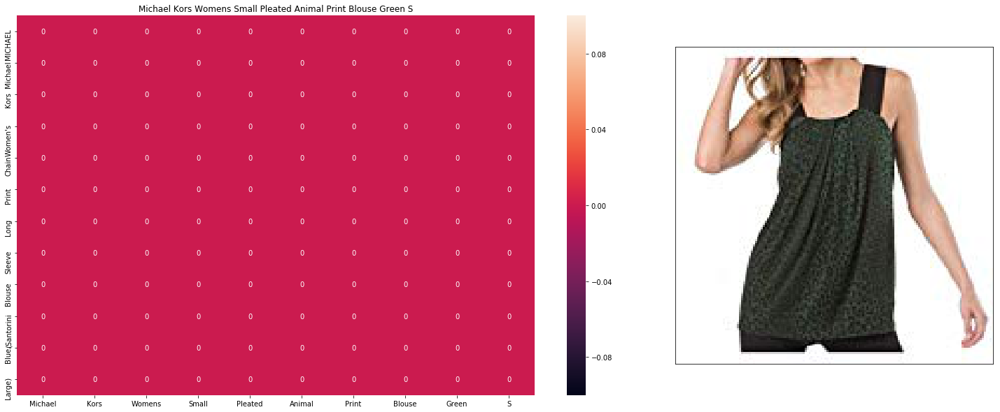

Product Title:  RJC Womens Classic Hibiscus Camp Shirt in Red - XXL
Euclidean Distance from input image: 3.31120361328125
Amazon Url: www.amazon.com/dp/B00PFACQ52


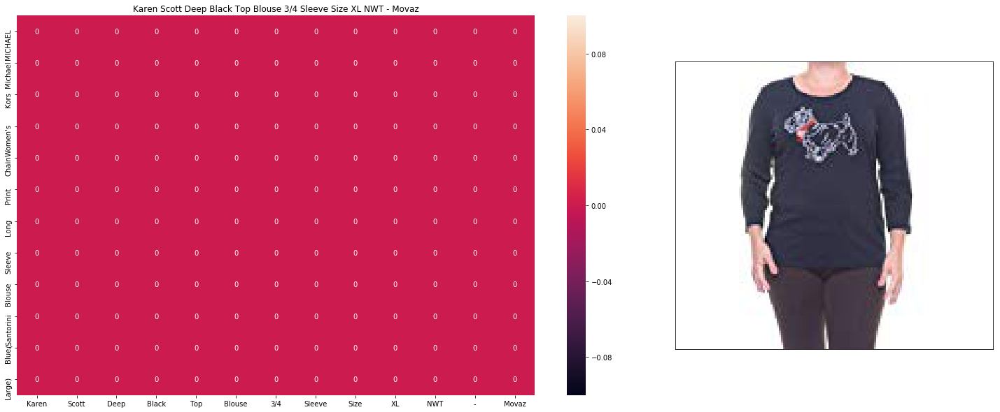

Product Title:  Almost Famous Juniors' Wine Top Size M
Euclidean Distance from input image: 3.3402584838867186
Amazon Url: www.amazon.com/dp/B01M3RLP9B


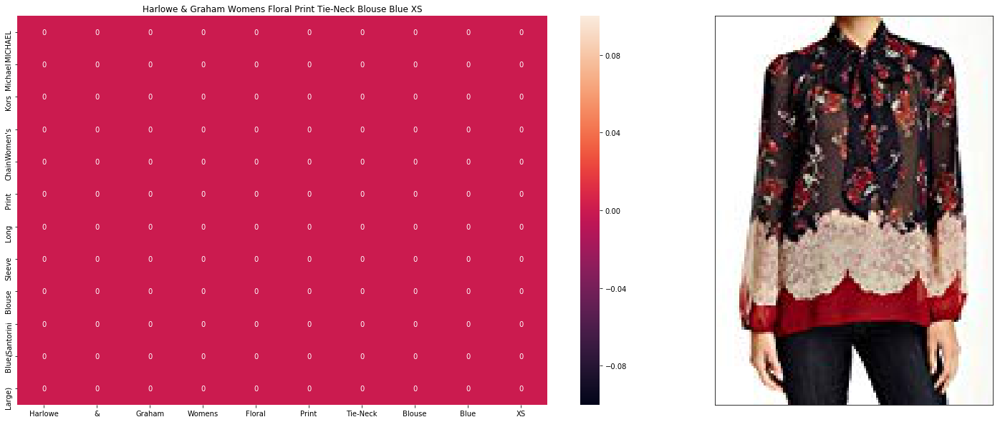

Product Title:  Sullen Women's Standard Issues Graphic T-Shirt-XL black
Euclidean Distance from input image: 3.361769104003906
Amazon Url: www.amazon.com/dp/B06XC5P59Y


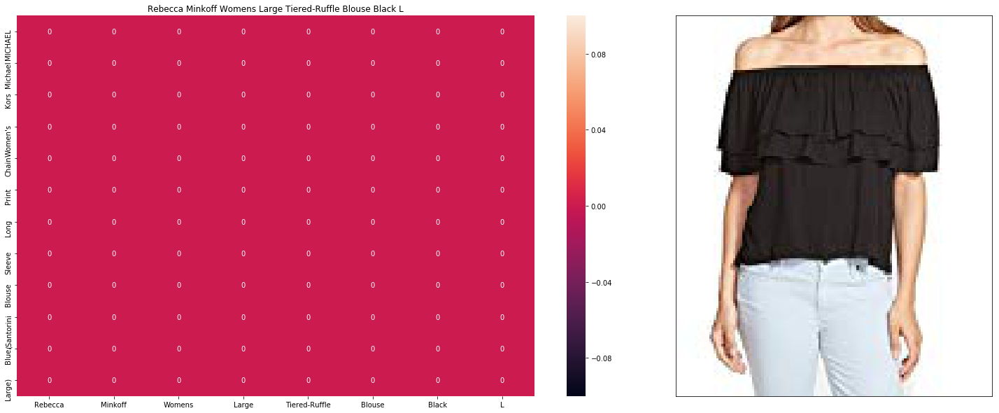

Product Title:  MSK Womens Matte Jersey Embellished Blouse Purple L
Euclidean Distance from input image: 3.4045867919921875
Amazon Url: www.amazon.com/dp/B071V72DTW


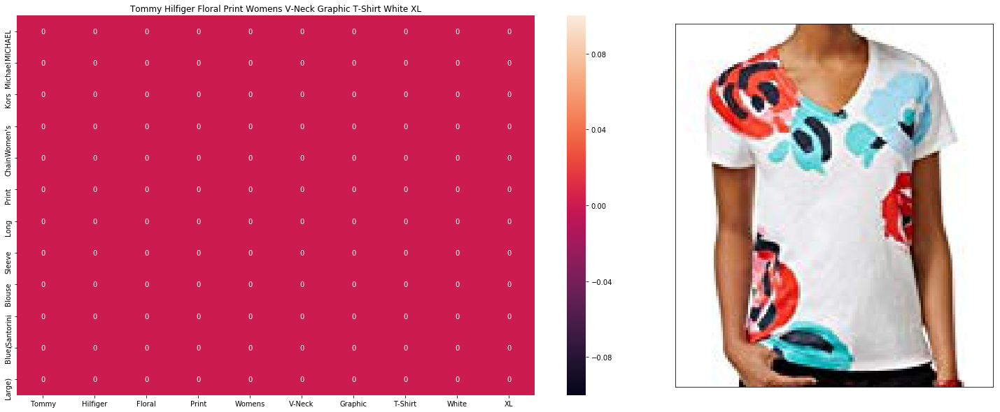

Product Title:  Glamorous Women's Bardot Off the Shoulder Lace Top Gray Blue, Grey/Blue, Small
Euclidean Distance from input image: 3.4066287231445314
Amazon Url: www.amazon.com/dp/B06XS4VZSH


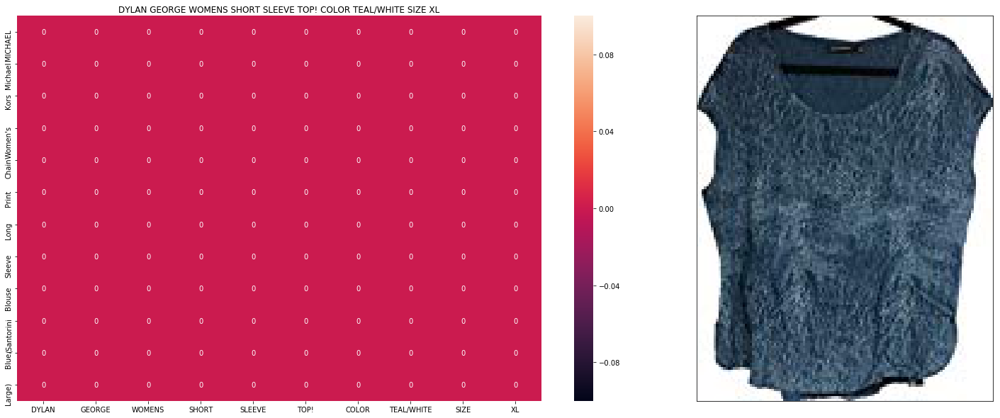

Product Title:  YOCO Women's Crochet Lace Trapeze Long Top with Wide Sleeves One size Ivory
Euclidean Distance from input image: 3.430784912109375
Amazon Url: www.amazon.com/dp/B00JU8OK2W


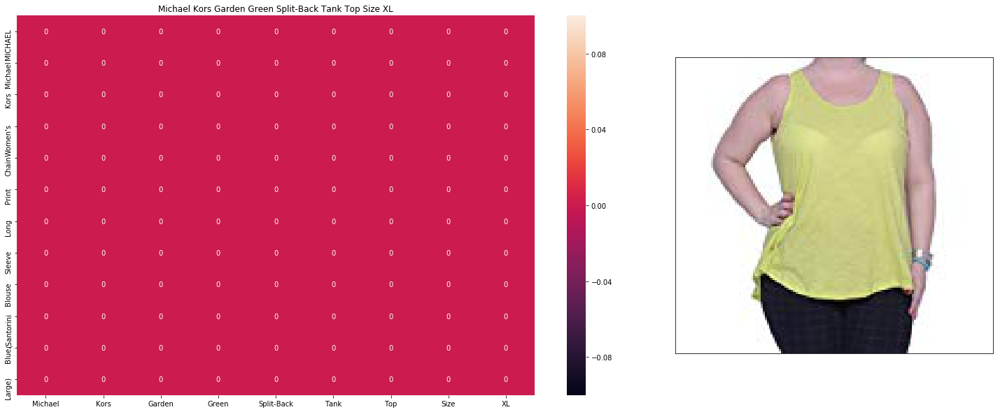

Product Title:  ZEKO Women's Fashion Sleeveless Shirt Deathstroke Size S Black
Euclidean Distance from input image: 3.4365365600585935
Amazon Url: www.amazon.com/dp/B01547U3E6


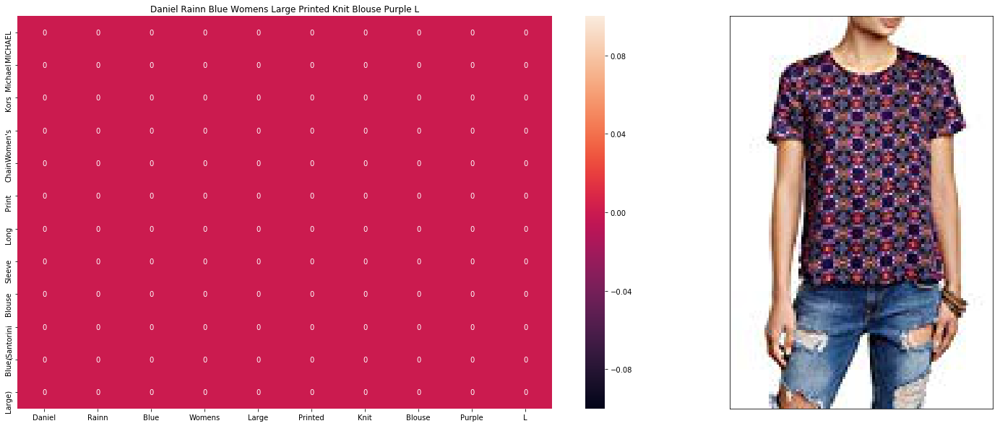

Product Title:  Nella Fantasia Women's Owl Print Tank Top Small Peach
Euclidean Distance from input image: 3.4458306884765624
Amazon Url: www.amazon.com/dp/B01I2ZZC16


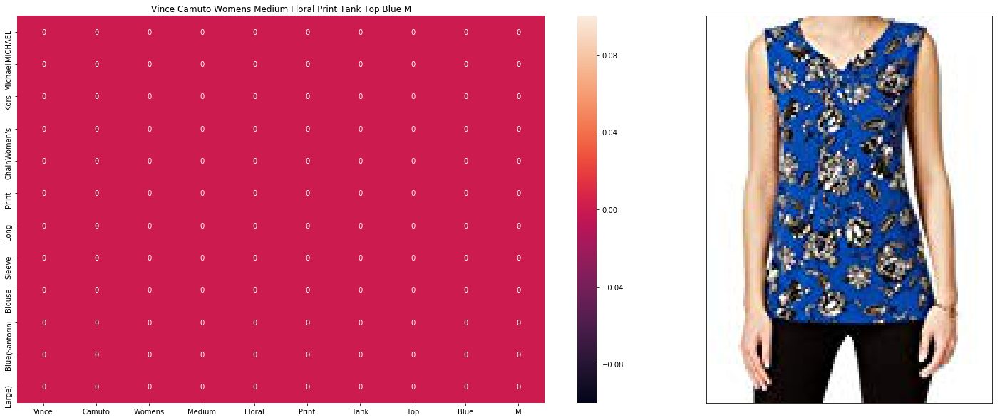

Product Title:  Pink Lao Laos Laotian Sleeveless Blouse Tops Size 38 M SL38B
Euclidean Distance from input image: 3.481695556640625
Amazon Url: www.amazon.com/dp/B074J34D1V


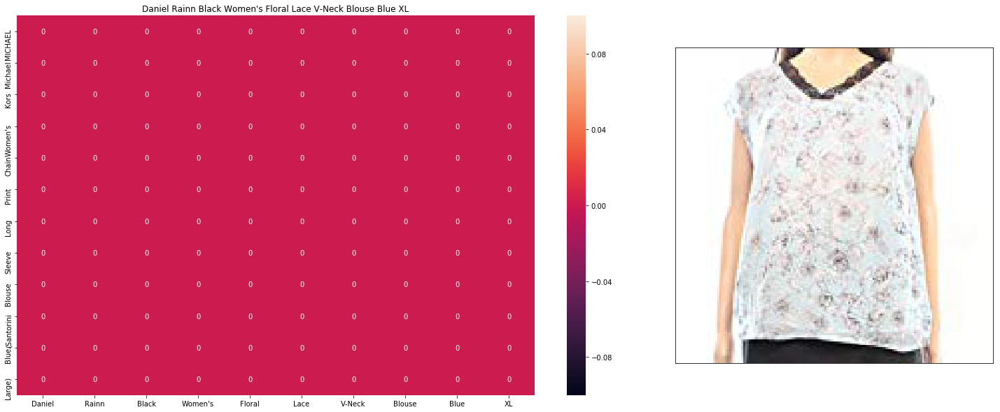

Product Title:  Paccilo Big and Tall Women 4028 PLUS & ALL SIZE Leather Dress
Euclidean Distance from input image: 3.4993890380859374
Amazon Url: www.amazon.com/dp/B01CGDLRS2


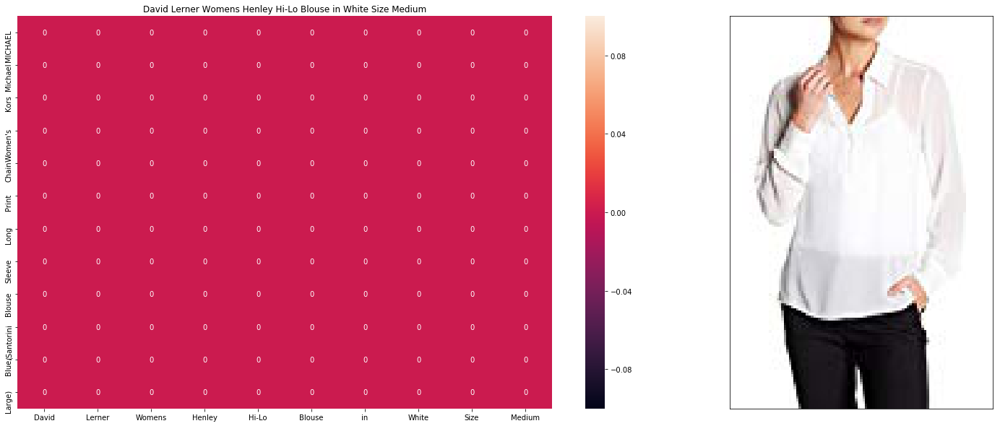

Product Title:  Baby Phat Women's Plus Size Beaded Blouse After Glow 2X Ivory
Euclidean Distance from input image: 3.5052734375
Amazon Url: www.amazon.com/dp/B0746QM9ZK


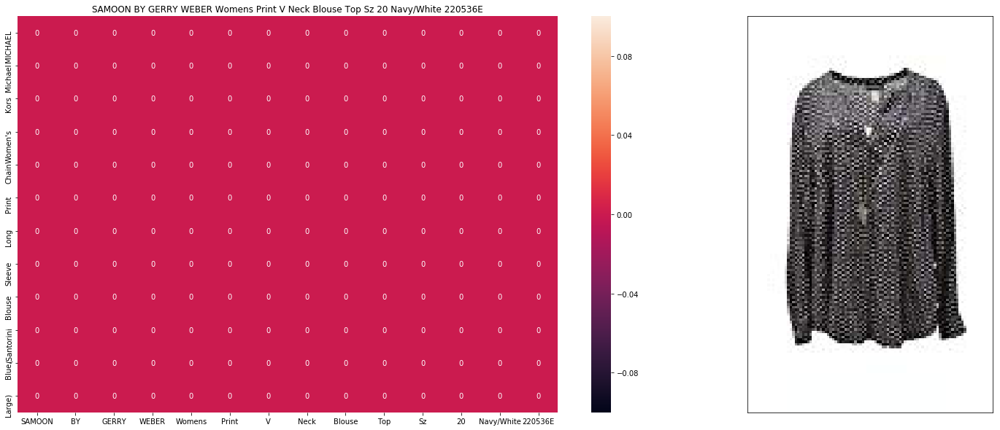

Product Title:  Loose Round Neck Short Sleeve Lace Flowers Cotton T-Shirt Fashion Tassel Vest
Euclidean Distance from input image: 3.5138348388671874
Amazon Url: www.amazon.com/dp/B00WHCRJA8


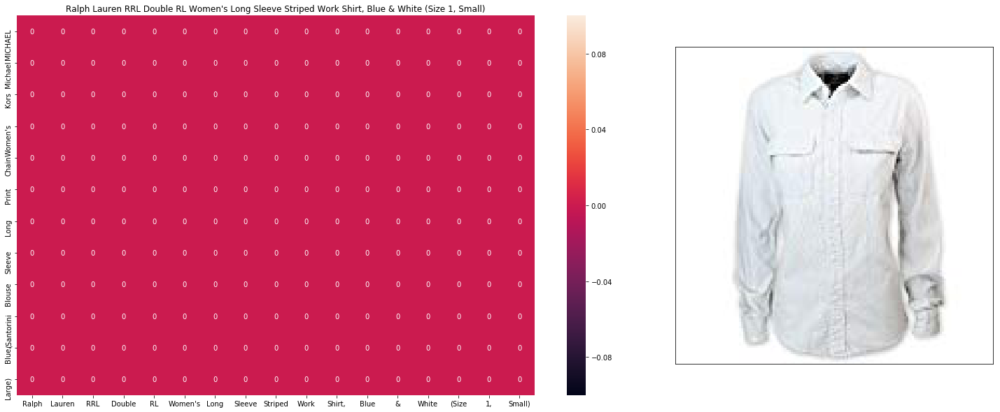

Product Title:  HOTOU Women's Murray Hotel Transylvania 3/4 Sleeve Baseball T Shirt Red
Euclidean Distance from input image: 3.5169857788085936
Amazon Url: www.amazon.com/dp/B01GE73QY4


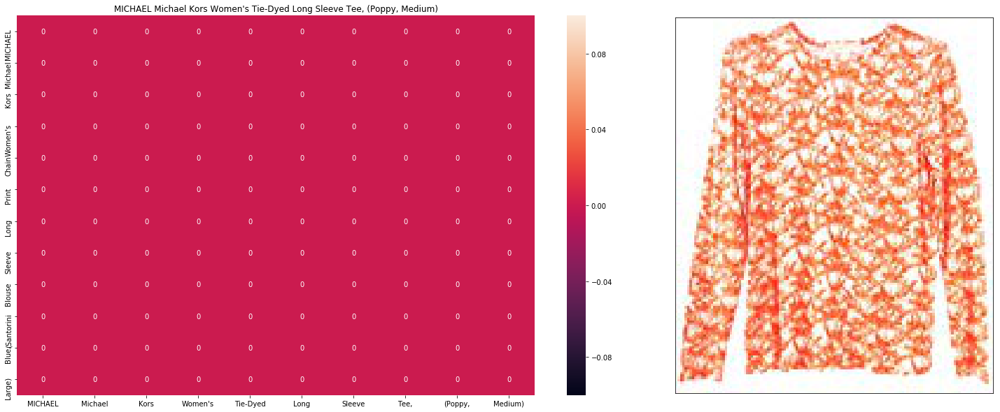

Product Title:  Women Japanese Mixed Martial Arts Tee,Black Tshirts By HGiorgis XXL Black
Euclidean Distance from input image: 3.517958068847656
Amazon Url: www.amazon.com/dp/B01JQ096HW


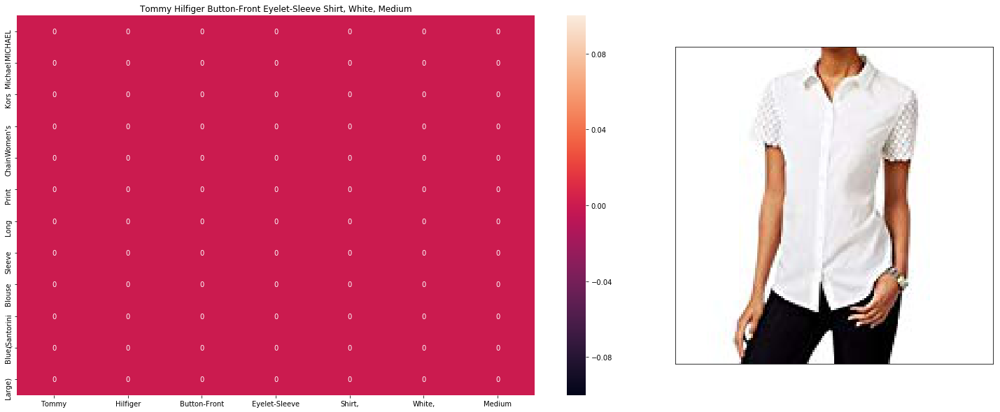

Product Title:  Project Social T Light Teal Womens Hi-Low V-Neck Knit Top
Euclidean Distance from input image: 3.5220147705078126
Amazon Url: www.amazon.com/dp/B0758YB6KM


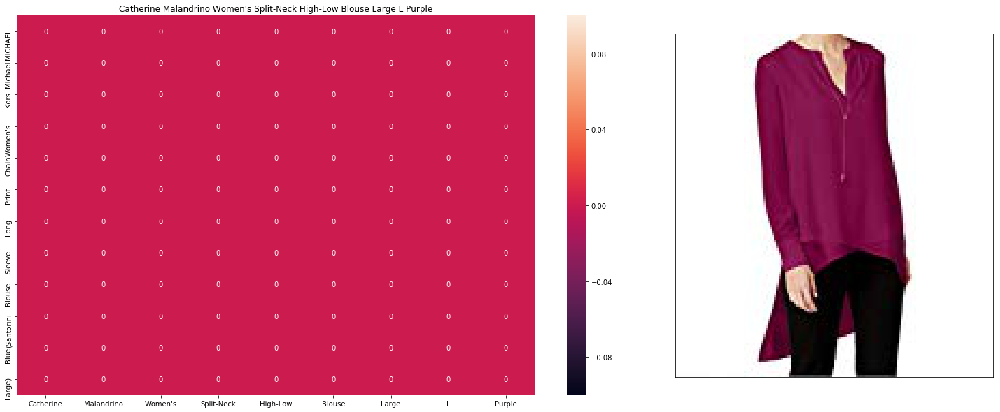

Product Title:  Lovely Day Small Junior Floral Print V-Neck Crop Cami Top
Euclidean Distance from input image: 3.5260635375976563
Amazon Url: www.amazon.com/dp/B0758WKGH3


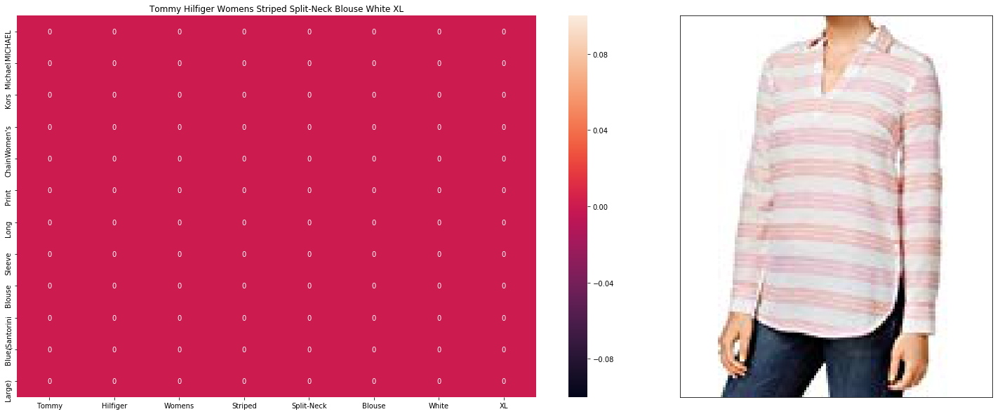

Product Title:  Bobeau Deep Womens Medium White Mesh-Trim Knit Top
Euclidean Distance from input image: 3.532212829589844
Amazon Url: www.amazon.com/dp/B0758WTXZK


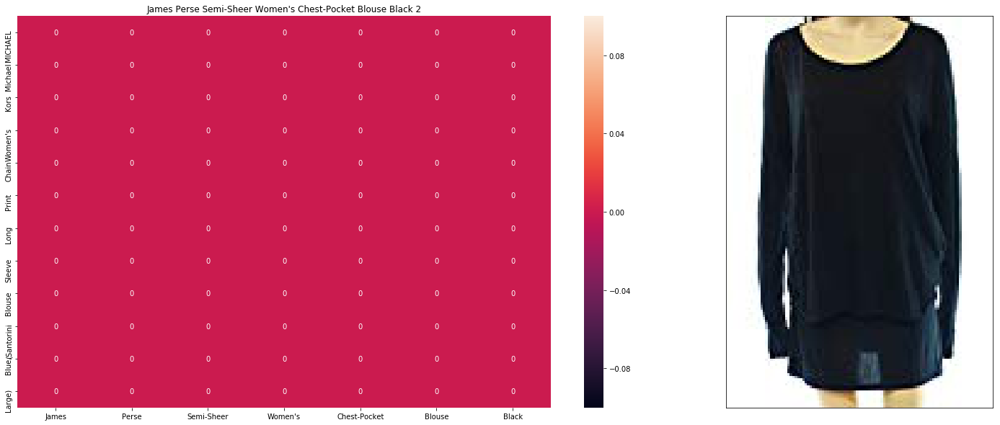

Product Title:  Mud Pie Laney Sweater Tunic - Green Small
Euclidean Distance from input image: 3.5336962890625
Amazon Url: www.amazon.com/dp/B01599D2JM


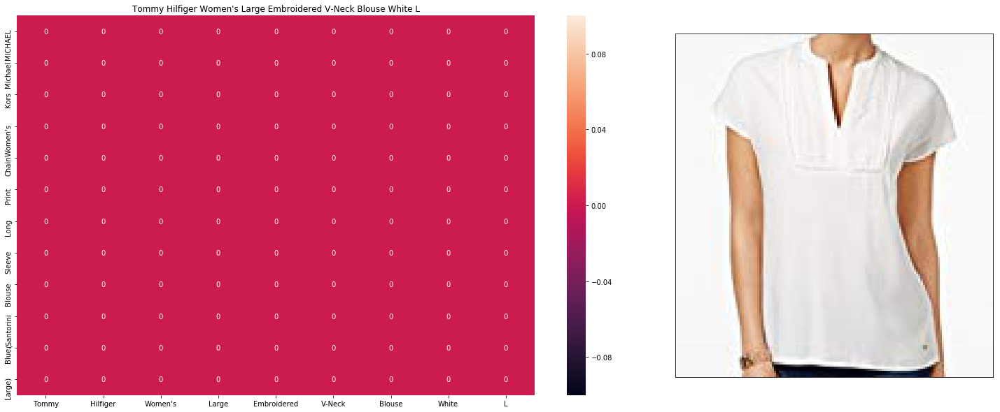

Product Title:  Leith Acorn Womens Medium Lace-Up Ribbed Knit Bodysuit
Euclidean Distance from input image: 3.535626220703125
Amazon Url: www.amazon.com/dp/B0758X773T


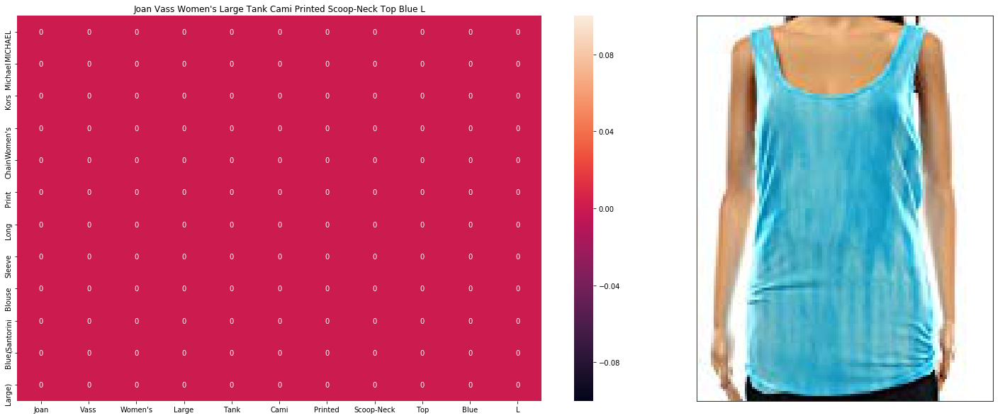

Product Title:  Cold Crush Large Junior Graphic Printed Halter Top $24 Beige L
Euclidean Distance from input image: 3.5411032104492186
Amazon Url: www.amazon.com/dp/B06Y37LGS5


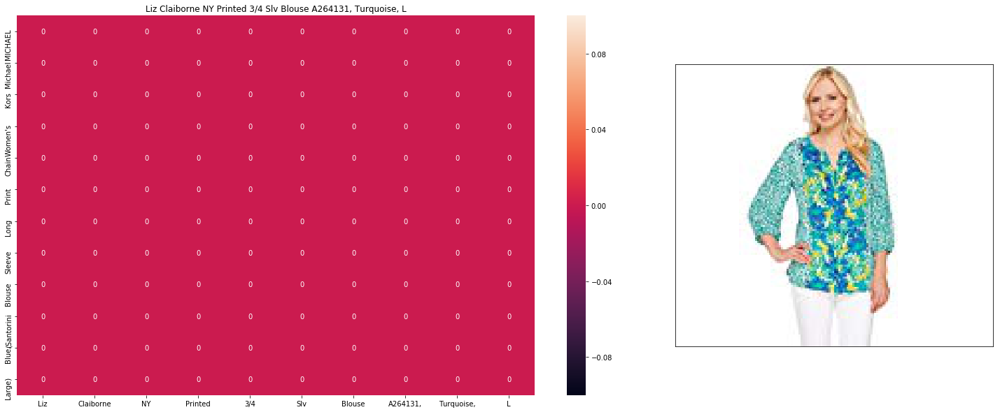

Product Title:  Hurley GTK0004250 Women's Moon Rise Singlet Tank, Grey Heather - XL
Euclidean Distance from input image: 3.558060302734375
Amazon Url: www.amazon.com/dp/B06Y5L6CN9


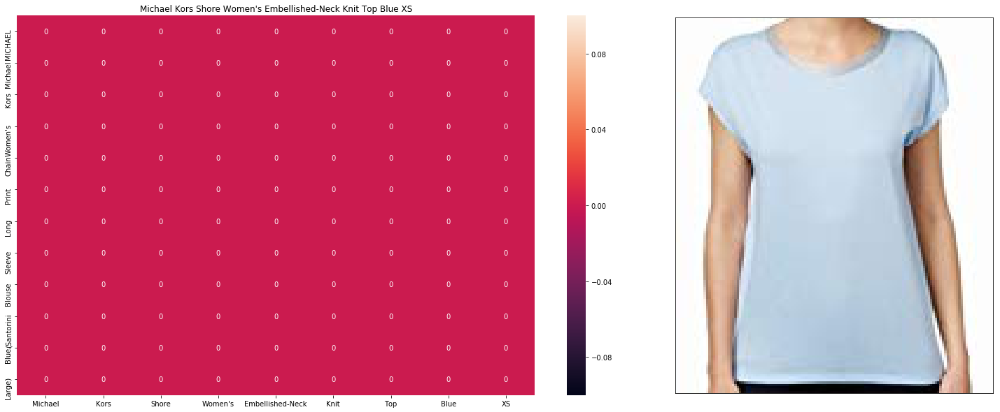

Product Title:  C6 Corvette Embroidered Ladies Performance Polo Shirt Ceramic Blue - Black Lettering - Medium
Euclidean Distance from input image: 3.560552062988281
Amazon Url: www.amazon.com/dp/B00UNS8VU0


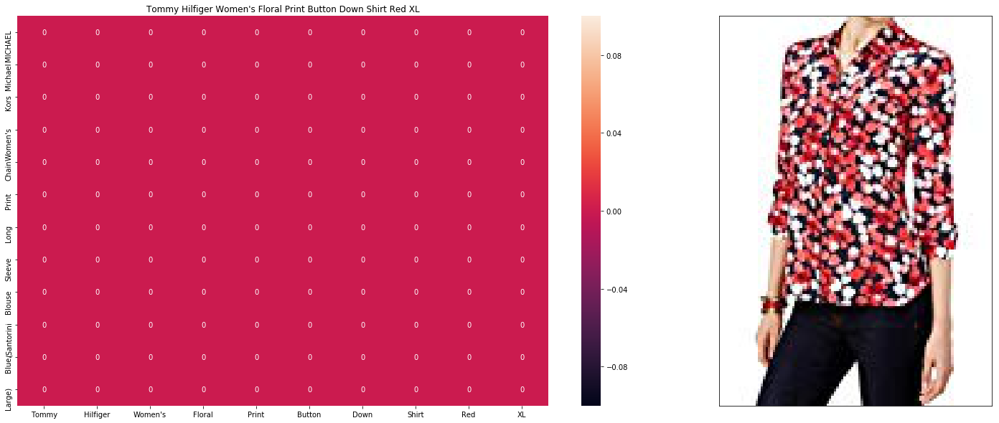

Product Title:  West K Optic Womens Small Peplum-Hem Knit Tank Top
Euclidean Distance from input image: 3.562420654296875
Amazon Url: www.amazon.com/dp/B07591PYDY


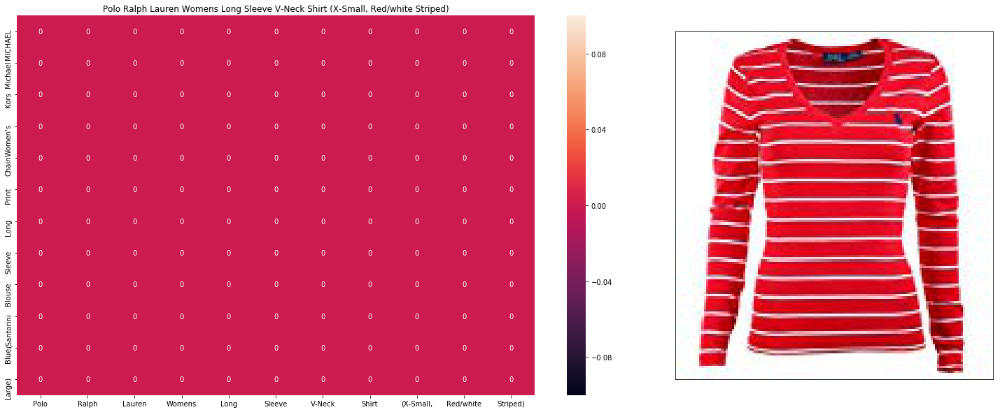

Product Title:  Dolce & Gabbana D&G Silk Black Long Sleeve Women's Button Down Shirt US S IT 40
Euclidean Distance from input image: 3.5657943725585937
Amazon Url: www.amazon.com/dp/B072KWXK3F


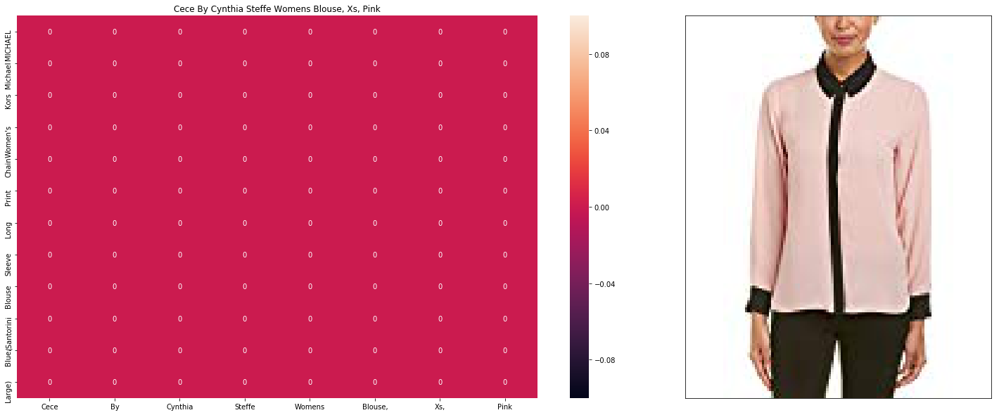

Product Title:  Vialumi Women's Juniors Floral Crochet Lace Tank Top Natural Beige One Size
Euclidean Distance from input image: 3.5668606567382812
Amazon Url: www.amazon.com/dp/B01FEJC5UO


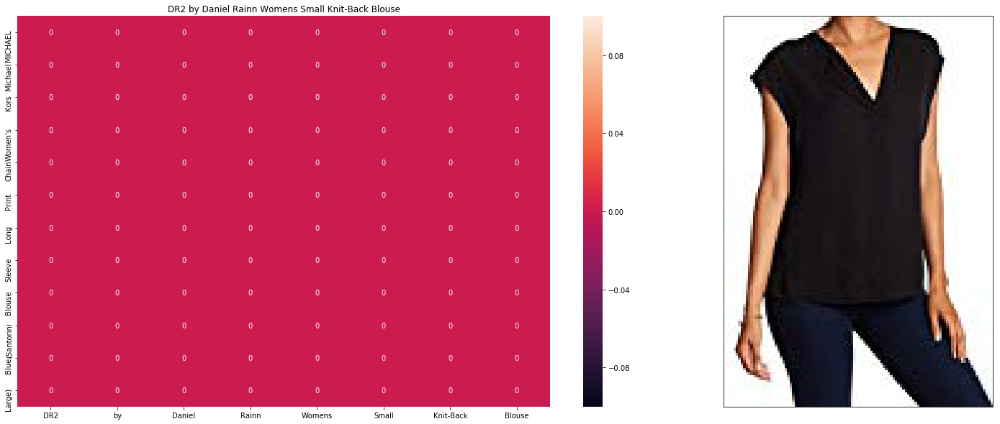

Product Title:  Women's "The Avenue" Art Wear Silk Tunic L / XL Oversized fits Plus Size
Euclidean Distance from input image: 3.5793267822265626
Amazon Url: www.amazon.com/dp/B015KZPXYC


In [64]:
get_similar_products_cnn(12566, 50, 0, 0, 0, 50)

OBSERVATIONS:
----------

We are seeing that the model works very well with brands and is average with other features